<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Stocks/USA/Apple/Apple_1H_Close.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from IPython.display import clear_output
import pandas as pd

if pd.__version__ != '0.25.0' or False:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git pandas==0.25.0
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)
  print('RESTARTING')
  %cd /content
  
  # force restart
  import os
  os.kill(os.getpid(), 9)

In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "AAPLUSUSD"
data_resample = '1H'
data_label = 'Close'
data_label_name = 'y'
start_date = '1 Jan 2018'
finish_date = '1 Jan 2019'
is_duka = True
is_yahoo = False
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe'] # True for all , ['All','Fwe','RFE','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
is_EDA = True
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [3]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

2019-07-25 03:18:12,238 - findatapy.market.datavendorweb - INFO - Request Dukascopy data
2019-07-25 03:18:12,242 - findatapy.market.datavendorweb - INFO - About to download from Dukascopy... for AAPLUSUSD
2019-07-25 03:19:14,377 - findatapy.market.datavendorweb - INFO - Downloading... 2018-01-30 00:00:00
2019-07-25 03:21:35,126 - findatapy.market.datavendorweb - INFO - Downloading... 2018-03-30 00:00:00
2019-07-25 03:22:46,976 - findatapy.market.datavendorweb - INFO - Downloading... 2018-04-30 00:00:00
2019-07-25 03:23:55,101 - findatapy.market.datavendorweb - INFO - Downloading... 2018-05-30 00:00:00
2019-07-25 03:25:05,205 - findatapy.market.datavendorweb - INFO - Downloading... 2018-06-30 00:00:00
2019-07-25 03:26:10,081 - findatapy.market.datavendorweb - INFO - Downloading... 2018-07-30 00:00:00
2019-07-25 03:27:21,381 - findatapy.market.datavendorweb - INFO - Downloading... 2018-08-30 00:00:00
2019-07-25 03:28:34,800 - findatapy.market.datavendorweb - INFO - Downloading... 2018-09

/usr/local/lib/python3.6/dist-packages/findatapy/market/ioengine.py:264: FutureWarning: to_msgpack is deprecated and will be removed in a future version.
It is recommended to use pyarrow for on-the-wire transmission of pandas objects.
  r.set(fname, data_frame.to_msgpack(compress='blosc'))


2019-07-25 03:32:32,742 - findatapy.market.ioengine - WARNING - Couldn't push MarketDataRequest_445__abstract_curve_key-None__category-None__category_key-backtest_default-cat_dukascopy_tick_NYC_AAPLUSUSD__cut-NYC__data_source-dukascopy__environment-backtest__expiry_date-NaT__fields-temp_ask_bid_askv_bidv__finish_date-2019-01-01 00:00:00__freq-tick__freq_mult-1__gran_freq-None__resample-None__resample_how-last__start_date-2018-01-01 00:00:00__tickers-AAPLUSUSD__trade_side-trade__vendor_fields-temp_ask_bid_askv_bidv__vendor_tickers-AAPLUSUSD to Redis: Error 111 connecting to 127.0.0.1:6379. Connection refused.


,Open,High,Low,Close,Volume
Date,,,,,
2018-01-02 14:00:00,1.70138,1.71058,1.69257,1.70968,16.620377
2018-01-02 15:00:00,1.70967,1.71588,1.70857,1.71498,22.677385
2018-01-02 16:00:00,1.71490,1.71510,1.71097,1.71198,16.675083
2018-01-02 17:00:00,1.71198,1.71488,1.71187,1.71281,13.665617
2018-01-02 18:00:00,1.71278,1.71688,1.71277,1.71667,13.143733
2018-01-02 19:00:00,1.71668,1.72097,1.71648,1.71978,13.700274
2018-01-02 20:00:00,1.71978,1.72218,1.71697,1.72198,15.186753
2018-01-03 14:00:00,1.72527,1.73869,1.72167,1.73869,15.635374
2018-01-03 15:00:00,1.73869,1.74538,1.73757,1.74147,22.369852


,Open,High,Low,Close,Volume
count,1745.000000,1745.000000,1745.000000,1745.000000,1745.000000
mean,1.892712,1.899268,1.885718,1.892676,21.262165
std,0.204467,0.204856,0.204418,0.204630,20.779993
min,1.468790,1.485570,1.466780,1.467380,0.976983
25%,1.736580,1.741880,1.729970,1.736870,8.461745
50%,1.863280,1.868970,1.858870,1.863280,14.491368
75%,2.076470,2.081670,2.071570,2.076680,23.290422
max,2.327170,2.334180,2.324570,2.327070,117.602814


25

In [4]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,6
Number of observations,1745
Total Missing (%),0.0%
Total size in memory,47.8 KiB
Average record size in memory,28.1 B
Numeric,2
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,3


In [5]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import uuid
import os


features_dataset = pd.read_pickle('full_dataset').sort_index()


periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
timeperiods = [8, 12, 14, 20, 24, 30]
matypes = range(9)
nbdevs = [2, 3, 4, 5]

# date features
features_dataset['day'] = features_dataset.index.day
features_dataset['dayofweek'] = features_dataset.index.dayofweek
features_dataset['dayofyear'] = features_dataset.index.dayofyear
features_dataset['days_in_month'] = features_dataset.index.days_in_month
features_dataset['hour'] = features_dataset.index.hour
features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
features_dataset['minute'] = features_dataset.index.minute
features_dataset['month'] = features_dataset.index.month
features_dataset['quarter'] = features_dataset.index.quarter
features_dataset['second'] = features_dataset.index.second
features_dataset['week'] = features_dataset.index.week
features_dataset['weekday'] = features_dataset.index.weekday
features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
features_dataset['weekofyear'] = features_dataset.index.weekofyear

# Overlap Studies
features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                    offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                    accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                    accelerationshort=-4e37, accelerationmaxshort=-4e37)

for timeperiod in timeperiods:
    features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                           acceleration=timeperiod / 100,
                                                           maximum=timeperiod / 100)
    features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

    for matype in matypes:
        features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                           timeperiod=timeperiod, matype=matype)
        features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                               minperiod=2,
                                                                               maxperiod=timeperiod, matype=matype)
        features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                           timeperiod=timeperiod,
                                                                           vfactor=matype / 10)

        for nbdev in nbdevs:
            features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

            
gc.collect()
# Momentum Indicators
features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                              features_dataset['Close'])

for timeperiod in timeperiods:
    features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
        features_dataset['High'],
        features_dataset['Low'],
        timeperiod=timeperiod)
    features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                   features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
        'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
    features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], features_dataset['Volume'],
                                                     timeperiod=timeperiod)
    features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                               features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                             features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                             timeperiod=timeperiod)
    features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                         features_dataset['Close'], timeperiod=timeperiod)

    
gc.collect()
features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
    features_dataset['Close'], fastperiod=12,
    slowperiod=26,
    signalperiod=9)
features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
    features_dataset['Close'],
    fastperiod=12,
    fastmatype=0,
    slowperiod=26,
    slowmatype=0,
    signalperiod=9,
    signalmatype=0)

features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                         features_dataset['Low'],
                                                                         features_dataset['Close'], fastk_period=5,
                                                                         slowk_period=3, slowk_matype=0,
                                                                         slowd_period=3, slowd_matype=0)
features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                            features_dataset['Low'],
                                                                            features_dataset['Close'], fastk_period=5,
                                                                            fastd_period=3, fastd_matype=0)
features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                  timeperiod=14,
                                                                                  fastk_period=5, fastd_period=3,
                                                                                  fastd_matype=0)
features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    timeperiod1=7, timeperiod2=14, timeperiod3=28)

# Volume Indicators
features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                            features_dataset['Volume'])
features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                  features_dataset['Volume'], fastperiod=3, slowperiod=10)
features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

gc.collect()
# Volatility Indicators
for timeperiod in timeperiods:
    features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)

features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

# Price Transform
features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

gc.collect()
# Cycle Indicators
features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

# Pattern Recognition
features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'],
                                                        penetration=0)
features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                      features_dataset['Close'])
features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'], penetration=0)
features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
gc.collect()

# Statistic Functions
for timeperiod in timeperiods:
    features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                       timeperiod=timeperiod)
    features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                           timeperiod=timeperiod)
    features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                     timeperiod=timeperiod)
    features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
    features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

    
gc.collect()
# Math Transform
features_dataset['ACOS'] = ACOS(features_dataset['Close'])
features_dataset['ASIN'] = ASIN(features_dataset['Close'])
features_dataset['ATAN'] = ATAN(features_dataset['Close'])
features_dataset['CEIL'] = CEIL(features_dataset['Close'])
features_dataset['COS'] = COS(features_dataset['Close'])
features_dataset['COSH'] = COSH(features_dataset['Close'])
features_dataset['EXP'] = EXP(features_dataset['Close'])
features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
features_dataset['LN'] = LN(features_dataset['Close'])
features_dataset['LOG10'] = LOG10(features_dataset['Close'])
features_dataset['SIN'] = SIN(features_dataset['Close'])
features_dataset['SINH'] = SINH(features_dataset['Close'])
features_dataset['SQRT'] = SQRT(features_dataset['Close'])
features_dataset['TAN'] = TAN(features_dataset['Close'])
features_dataset['TANH'] = TANH(features_dataset['Close'])

gc.collect()
# Math Operator
features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

for timeperiod in timeperiods:
    features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
        features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
    
gc.collect()


features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
features_dataset = features_dataset[50:].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
features_dataset.to_pickle('features_dataset')
display(features_dataset)
display(features_dataset.describe())

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del periods, timeperiods, matypes, nbdevs, features_dataset, talib
gc.collect()

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBA

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBA

36

In [6]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

Output hidden; open in https://colab.research.google.com to view.

In [7]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]][:-1]
label_df[data_label_name] = pd.DataFrame(features_dataset[data_label][1:].values / features_dataset[data_label][:-1].values,
                             index=label_df.index).clip(0,1).astype(int)

scaled_df = features_dataset
scaled_df = pd.DataFrame(minmax_scale(scaled_df, axis=0, feature_range=(0, 1)), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale
gc.collect()

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBA

52

In [8]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import uuid
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*0.7),int(len(train_hf)*0.9)]
  gc.collect()


try:
  load_h2o()
except:
  pass

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O cluster uptime:,4 hours 0 mins
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,1 month and 6 days
H2O cluster name:,H2O_from_python_unknownUser_mysi7r
H2O cluster total nodes:,1
H2O cluster free memory:,8.46 Gb
H2O cluster total cores:,2
H2O cluster allowed cores:,2
H2O cluster status:,"locked, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo,project_name=str(uuid.uuid4()))
      t_hf = (training_frame or train_hf)

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=t_hf[index_splits[0]:index_splits[1],:], leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except KeyboardInterrupt:
      return None
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    start_idx = max(-index_splits[1],-20)
    predicted = aml.leader.predict(t_hf[start_idx:,:])
    predicted = predicted.as_data_frame()[['predict']]
    predict_df = pd.read_pickle('predict_df')[start_idx:]
    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper right')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)
    h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
    gc.collect()

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190725_034001_mod...,0.520972,0.696879,0.477778,0.501852,0.251856
1,DeepLearning_grid_1_AutoML_20190725_034001_mod...,0.513056,1.805512,0.447917,0.620230,0.384685
2,DeepLearning_grid_1_AutoML_20190725_034001_mod...,0.502222,0.697326,0.500000,0.502083,0.252087
3,DeepLearning_grid_1_AutoML_20190725_034001_mod...,0.501250,14.005562,0.468750,0.696543,0.485172
4,DeepLearning_grid_1_AutoML_20190725_034001_mod...,0.500000,0.692417,0.500000,0.499635,0.249635
5,DeepLearning_grid_1_AutoML_20190725_034001_mod...,0.500000,0.988060,0.458333,0.581738,0.338419
6,DeepLearning_grid_1_AutoML_20190725_034001_mod...,0.488194,1.492860,0.462500,0.665123,0.442388
7,DeepLearning_grid_1_AutoML_20190725_034001_mod...,0.476042,0.754576,0.494444,0.521627,0.272095
8,DeepLearning_grid_1_AutoML_20190725_034001_mod...,0.472222,0.694375,0.500000,0.500610,0.250610
9,DeepLearning_1_AutoML_20190725_034001,0.446667,1.766269,0.484028,0.657660,0.432516


,variable,relative_importance,scaled_importance,percentage
0,HT_TRENDMODE,1.000000,1.000000,0.001347
1,weekday,0.928749,0.928749,0.001251
2,STOCHRSI_fastk,0.910742,0.910742,0.001227
3,dayofweek,0.910502,0.910502,0.001227
4,weekday_name,0.886181,0.886181,0.001194
5,BOP,0.884176,0.884176,0.001191
6,day,0.879428,0.879428,0.001185
7,STOCHF_fastk,0.854486,0.854486,0.001151
8,AROONOSC_24,0.850366,0.850366,0.001146
9,hour,0.846491,0.846491,0.001140


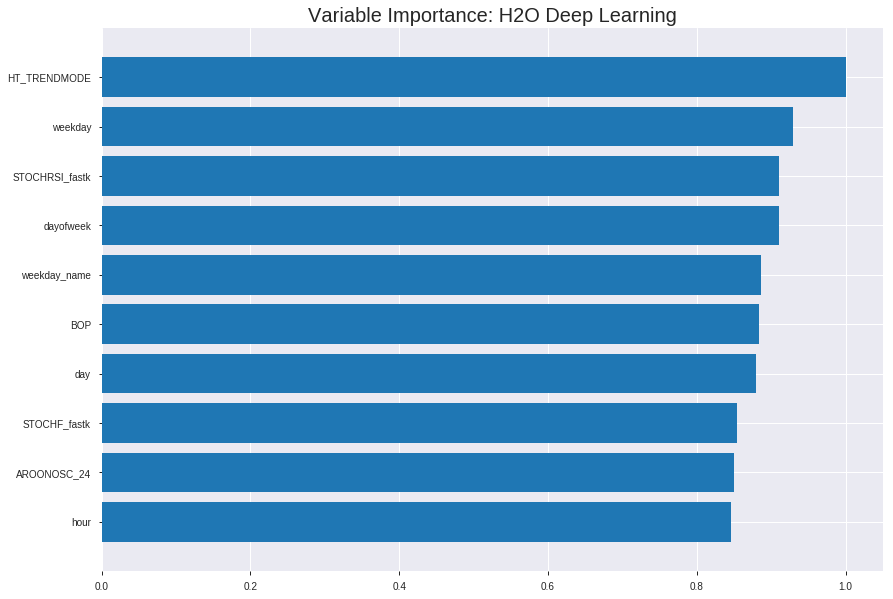

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190725_034001_model_6


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.24002908036346365
RMSE: 0.48992762767929676
LogLoss: 0.6717248755858202
Mean Per-Class Error: 0.43467637364834366
AUC: 0.5914642157394766
pr_auc: 0.6310812006156561
Gini: 0.1829284314789532
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43067900206177273: 


,0,1,Error,Rate
0,45.0,517.0,0.9199,(517.0/562.0)
1,6.0,617.0,0.0096,(6.0/623.0)
Total,51.0,1134.0,0.4414,(523.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4306790,0.7023335,355.0
max f2,0.4277979,0.8519130,359.0
max f0point5,0.4345250,0.5986261,348.0
max accuracy,0.5177955,0.5645570,198.0
max precision,0.8749518,1.0,0.0
max recall,0.3158862,1.0,384.0
max specificity,0.8749518,1.0,0.0
max absolute_mcc,0.4306790,0.1733174,355.0
max min_per_class_accuracy,0.5177955,0.4679715,198.0
max mean_per_class_accuracy,0.5183750,0.5653236,193.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 51.38 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.7247887,1.9020867,1.9020867,1.0,0.8062946,1.0,0.8062946,0.0192616,0.0192616,90.2086677,90.2086677
,2,0.0202532,0.6863442,1.7435795,1.8228331,0.9166667,0.7020643,0.9583333,0.7541795,0.0176565,0.0369181,74.3579454,82.2833066
,3,0.0303797,0.6604387,1.4265650,1.6907437,0.75,0.6732970,0.8888889,0.7272186,0.0144462,0.0513644,42.6565008,69.0743713
,4,0.0405063,0.6364283,1.2680578,1.5850722,0.6666667,0.6475812,0.8333333,0.7073093,0.0128411,0.0642055,26.8057785,58.5072231
,5,0.0506329,0.6231723,1.2680578,1.5216693,0.6666667,0.6275853,0.8,0.6913645,0.0128411,0.0770465,26.8057785,52.1669342
,6,0.1004219,0.5654764,1.3217890,1.4225690,0.6949153,0.5899043,0.7478992,0.6410607,0.0658106,0.1428571,32.1789047,42.2569028
,7,0.1502110,0.5492870,1.1283565,1.3250491,0.5932203,0.5580079,0.6966292,0.6135320,0.0561798,0.1990369,12.8356504,32.5049146
,8,0.2,0.5302456,0.9994015,1.2439807,0.5254237,0.5390159,0.6540084,0.5949816,0.0497592,0.2487961,-0.0598525,24.3980738
,9,0.3004219,0.5191380,1.1028906,1.1968186,0.5798319,0.5226146,0.6292135,0.5707915,0.1107544,0.3595506,10.2890594,19.6818584
,10,0.5873418,0.5177980,1.0013927,1.1013519,0.5264706,0.5179616,0.5790230,0.5449838,0.2873194,0.6468700,0.1392692,10.1351912




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.25002987860056375
RMSE: 0.5000298777078863
LogLoss: 0.693218525846635
Mean Per-Class Error: 0.4431295315114334
AUC: 0.5390407138873397
pr_auc: 0.5038995469937967
Gini: 0.0780814277746793
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42300020585169196: 


,0,1,Error,Rate
0,6.0,170.0,0.9659,(170.0/176.0)
1,2.0,161.0,0.0123,(2.0/163.0)
Total,8.0,331.0,0.5074,(172.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4230002,0.6518219,330.0
max f2,0.4165208,0.8232323,337.0
max f0point5,0.4559178,0.5452775,215.0
max accuracy,0.4660036,0.5575221,162.0
max precision,0.6409696,1.0,0.0
max recall,0.4165208,1.0,337.0
max specificity,0.6409696,1.0,0.0
max absolute_mcc,0.4660036,0.1137409,162.0
max min_per_class_accuracy,0.4651402,0.5521472,167.0
max mean_per_class_accuracy,0.4660036,0.5568705,162.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 47.70 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.6273315,1.5598160,1.5598160,0.75,0.6367374,0.75,0.6367374,0.0184049,0.0184049,55.9815951,55.9815951
,2,0.0206490,0.6157643,1.3865031,1.4855390,0.6666667,0.6220346,0.7142857,0.6304362,0.0122699,0.0306748,38.6503067,48.5539001
,3,0.0324484,0.6064851,0.5199387,1.1344116,0.25,0.6104440,0.5454545,0.6231663,0.0061350,0.0368098,-48.0061350,13.4411601
,4,0.0412979,0.5971436,1.3865031,1.1884312,0.6666667,0.6033421,0.5714286,0.6189183,0.0122699,0.0490798,38.6503067,18.8431201
,5,0.0501475,0.5763636,0.6932515,1.1010466,0.3333333,0.5910889,0.5294118,0.6140072,0.0061350,0.0552147,-30.6748466,10.1046554
,6,0.1002950,0.5441212,0.4893540,0.7952003,0.2352941,0.5536294,0.3823529,0.5838183,0.0245399,0.0797546,-51.0645976,-20.4799711
,7,0.1504425,0.5213108,1.4680621,1.0194875,0.7058824,0.5347030,0.4901961,0.5674466,0.0736196,0.1533742,46.8062071,1.9487550
,8,0.2005900,0.5073999,0.9787080,1.0092927,0.4705882,0.5120723,0.4852941,0.5536030,0.0490798,0.2024540,-2.1291952,0.9292674
,9,0.3008850,0.4779250,1.2845543,1.1010466,0.6176471,0.4873348,0.5294118,0.5315136,0.1288344,0.3312883,28.4554313,10.1046554
,10,0.4011799,0.4696897,1.1010466,1.1010466,0.5294118,0.4729969,0.5294118,0.5168844,0.1104294,0.4417178,10.1046554,10.1046554



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 03:50:30,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-07-25 03:50:33,5 min 12.133 sec,323 obs/sec,0.7037975,1,834.0,0.6316380,2.8424105,-0.6001064,0.5353173,0.4409446,0.6340289,0.4666667,0.7155662,10.1173146,-1.0511564,0.5040609,0.1187011,0.0,0.5162242
,2019-07-25 03:50:55,5 min 34.718 sec,363 obs/sec,7.0253165,10,8325.0,0.4994592,0.6925961,-0.0004891,0.5640798,0.5752902,0.9510433,0.4734177,0.5319114,0.7637249,-0.1333856,0.4888455,0.4727247,0.5199387,0.5162242
,2019-07-25 03:51:19,5 min 58.422 sec,413 obs/sec,15.4582278,22,18318.0,0.4932207,0.6790793,0.0243479,0.5924624,0.6235634,1.9020867,0.4531646,0.5016758,0.6966355,-0.0081970,0.4817345,0.4663306,1.0398773,0.5162242
,2019-07-25 03:51:42,6 min 21.534 sec,433 obs/sec,23.8776371,34,28295.0,0.4899276,0.6717249,0.0373327,0.5914642,0.6310812,1.9020867,0.4413502,0.5000299,0.6932185,-0.0015924,0.5390407,0.5038995,1.5598160,0.5073746
,2019-07-25 03:52:05,6 min 43.769 sec,449 obs/sec,32.3443038,46,38328.0,0.4890417,0.6692068,0.0408111,0.5861975,0.6339963,1.9020867,0.4421941,0.5013638,0.6958820,-0.0069436,0.4741355,0.4680260,1.5598160,0.5191740
,2019-07-25 03:52:27,7 min 6.516 sec,464 obs/sec,41.4818565,59,49156.0,0.4839254,0.6574535,0.0607759,0.6222988,0.6600058,1.9020867,0.4396624,0.5068728,0.7071093,-0.0291937,0.5292805,0.5192138,1.5598160,0.4926254
,2019-07-25 03:52:50,7 min 29.445 sec,478 obs/sec,51.0860759,73,60537.0,0.4792176,0.6462185,0.0789614,0.6493477,0.6795471,1.9020867,0.4244726,0.5039360,0.7010931,-0.0173018,0.4870678,0.4580380,1.0398773,0.5191740
,2019-07-25 03:53:14,7 min 53.329 sec,493 obs/sec,61.6210970,88,73021.0,0.4760176,0.6376250,0.0912210,0.6313584,0.6916572,1.9020867,0.4126582,0.5044053,0.7020383,-0.0191976,0.4948410,0.4672754,1.0398773,0.5191740
,2019-07-25 03:53:16,7 min 55.588 sec,492 obs/sec,61.6210970,88,73021.0,0.4899276,0.6717249,0.0373327,0.5914642,0.6310812,1.9020867,0.4413502,0.5000299,0.6932185,-0.0015924,0.5390407,0.5038995,1.5598160,0.5073746


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
HT_TRENDMODE,1.0,1.0,0.0013472
weekday,0.9287485,0.9287485,0.0012512
STOCHRSI_fastk,0.9107422,0.9107422,0.0012270
dayofweek,0.9105022,0.9105022,0.0012266
weekday_name,0.8861811,0.8861811,0.0011939
---,---,---,---
fama,0.6524130,0.6524130,0.0008789
BBANDS_middleband_20_6_5,0.6520860,0.6520860,0.0008785
BBANDS_middleband_30_5_3,0.6515490,0.6515490,0.0008778
MA_8_1,0.6478959,0.6478959,0.0008728



See the whole table with table.as_data_frame()


('accuracy', 0.5411764705882353)

('F1', 0.6504065040650406)

('auc', 0.5209722222222223)

('logloss', 0.696878654963871)

('mean_per_class_error', 0.47291666666666665)

('rmse', 0.5018523810620849)

('mse', 0.25185581237768406)

deeplearning prediction progress: |███████████████████████████████████████| 100%


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


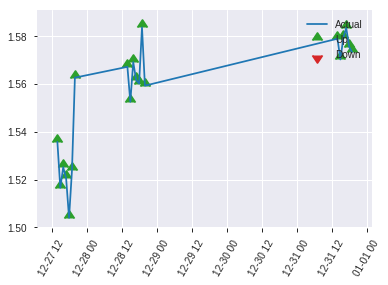


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.25185581237768406
RMSE: 0.5018523810620849
LogLoss: 0.696878654963871
Mean Per-Class Error: 0.47291666666666665
AUC: 0.5209722222222223
pr_auc: 0.47855121447731075
Gini: 0.04194444444444456
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5107905239765538: 


,0,1,Error,Rate
0,4.0,86.0,0.9556,(86.0/90.0)
1,0.0,80.0,0.0,(0.0/80.0)
Total,4.0,166.0,0.5059,(86.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5107905,0.6504065,51.0
max f2,0.5107905,0.8230453,51.0
max f0point5,0.5112861,0.5396175,48.0
max accuracy,0.5492825,0.5411765,11.0
max precision,0.5617664,0.6,4.0
max recall,0.5107905,1.0,51.0
max specificity,0.6076220,0.9888889,0.0
max absolute_mcc,0.5107905,0.1463523,51.0
max min_per_class_accuracy,0.5178546,0.2,32.0
max mean_per_class_accuracy,0.5112861,0.5270833,48.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 52.20 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.5778334,1.0625,1.0625,0.5,0.5986074,0.5,0.5986074,0.0125,0.0125,6.25,6.25
,2,0.0235294,0.5678074,1.0625,1.0625,0.5,0.5720301,0.5,0.5853187,0.0125,0.025,6.25,6.25
,3,0.0352941,0.5605540,1.0625,1.0625,0.5,0.5612237,0.5,0.5772871,0.0125,0.0375,6.25,6.25
,4,0.0411765,0.5587909,2.125,1.2142857,1.0,0.5588655,0.5714286,0.5746554,0.0125,0.05,112.5,21.4285714
,5,0.0529412,0.5562444,0.0,0.9444444,0.0,0.5583297,0.4444444,0.5710275,0.0,0.05,-100.0,-5.5555556
,6,0.1,0.5402928,1.0625,1.0,0.5,0.5475662,0.4705882,0.5599869,0.05,0.1,6.25,0.0
,7,0.1529412,0.5183439,1.4166667,1.1442308,0.6666667,0.5269186,0.5384615,0.5485402,0.075,0.175,41.6666667,14.4230769
,8,0.2,0.5178078,0.53125,1.0,0.25,0.5180605,0.4705882,0.5413685,0.025,0.2,-46.875,0.0
,9,0.8764706,0.5177980,1.0347826,1.0268456,0.4869565,0.5177980,0.4832215,0.5231765,0.7,0.9,3.4782609,2.6845638
,10,0.9,0.5169169,0.53125,1.0138889,0.25,0.5173494,0.4771242,0.5230241,0.0125,0.9125,-46.875,1.3888889


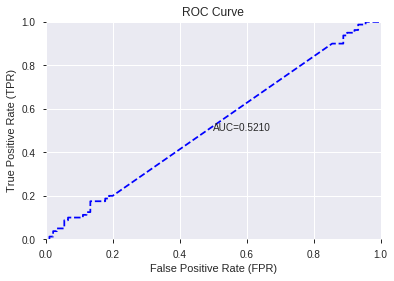

This function is available for GLM models only


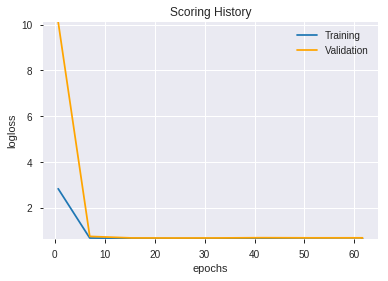

--2019-07-25 04:06:05--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.179.99
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.179.99|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


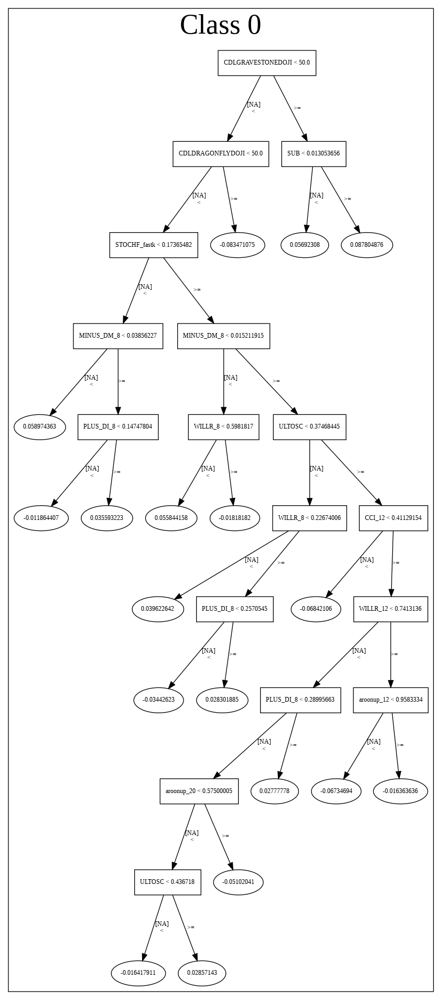

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190725_034001_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190725_034001_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_2_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

In [10]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190725_040618_model_4,0.511111,1.380626,0.488889,0.626865,0.392960
1,DeepLearning_grid_1_AutoML_20190725_040618_model_6,0.497500,0.781551,0.500000,0.534702,0.285906
2,DeepLearning_grid_1_AutoML_20190725_040618_model_1,0.490833,1.575303,0.483333,0.631568,0.398878
3,DeepLearning_grid_1_AutoML_20190725_040618_model_8,0.487083,0.694004,0.500000,0.500428,0.250428
4,DeepLearning_grid_1_AutoML_20190725_040618_model_9,0.468611,0.695010,0.500000,0.500928,0.250929
5,DeepLearning_grid_1_AutoML_20190725_040618_model_7,0.467500,1.030146,0.500000,0.597926,0.357516
6,DeepLearning_grid_1_AutoML_20190725_040618_model_3,0.451667,1.299546,0.478472,0.637429,0.406316
7,DeepLearning_grid_1_AutoML_20190725_040618_model_2,0.444583,1.388173,0.500000,0.636113,0.404639
8,DeepLearning_grid_1_AutoML_20190725_040618_model_5,0.440278,0.801364,0.461111,0.546694,0.298874
9,DeepLearning_1_AutoML_20190725_040618,0.433194,0.803618,0.500000,0.542243,0.294028


,variable,relative_importance,scaled_importance,percentage
0,CDLGAPSIDESIDEWHITE,1.000000,1.000000,0.045352
1,CDLMORNINGDOJISTAR,0.856760,0.856760,0.038856
2,BOP,0.558275,0.558275,0.025319
3,CDLDOJI,0.540142,0.540142,0.024497
4,CORREL_12,0.501028,0.501028,0.022723
5,hour,0.495694,0.495694,0.022481
6,days_in_month,0.483888,0.483888,0.021945
7,day,0.474271,0.474271,0.021509
8,HT_PHASOR_quadrature,0.466626,0.466626,0.021162
9,FLOOR,0.454676,0.454676,0.020620


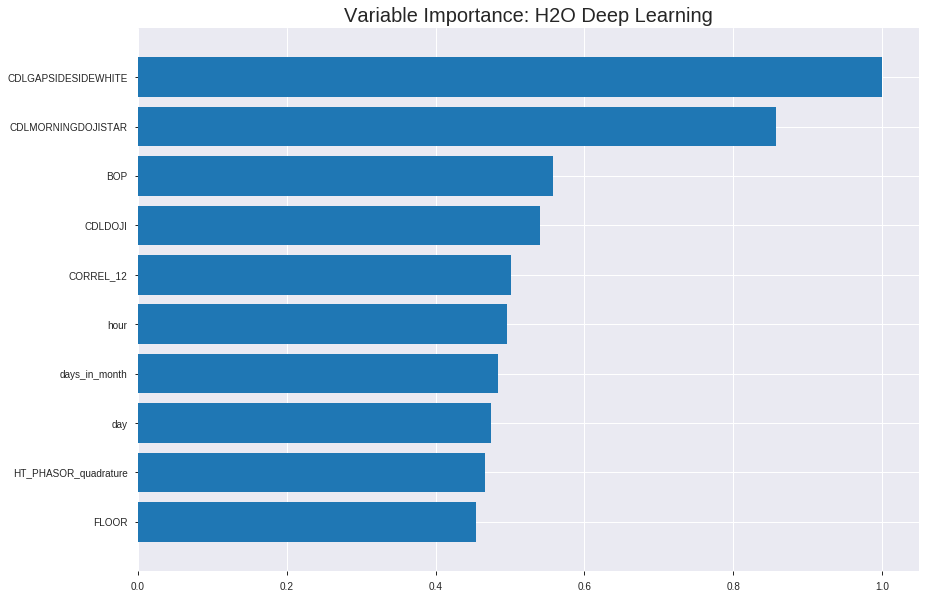

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190725_040618_model_4


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.11268713456515644
RMSE: 0.3356890444520888
LogLoss: 0.3638924636069261
Mean Per-Class Error: 0.14175039842799453
AUC: 0.9206842679492526
pr_auc: 0.9295243957242428
Gini: 0.8413685358985052
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5097998650653227: 


,0,1,Error,Rate
0,501.0,61.0,0.1085,(61.0/562.0)
1,109.0,514.0,0.175,(109.0/623.0)
Total,610.0,575.0,0.1435,(170.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5097999,0.8580968,195.0
max f2,0.1461044,0.8889224,315.0
max f0point5,0.6142472,0.8934517,164.0
max accuracy,0.5097999,0.8565401,195.0
max precision,0.9986259,1.0,0.0
max recall,0.0043096,1.0,396.0
max specificity,0.9986259,1.0,0.0
max absolute_mcc,0.5097999,0.7158616,195.0
max min_per_class_accuracy,0.4399753,0.8426966,216.0
max mean_per_class_accuracy,0.5097999,0.8582496,195.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 48.89 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.9960761,1.9020867,1.9020867,1.0,0.9975720,1.0,0.9975720,0.0192616,0.0192616,90.2086677,90.2086677
,2,0.0202532,0.9940834,1.9020867,1.9020867,1.0,0.9954007,1.0,0.9964863,0.0192616,0.0385233,90.2086677,90.2086677
,3,0.0303797,0.9916678,1.9020867,1.9020867,1.0,0.9927119,1.0,0.9952282,0.0192616,0.0577849,90.2086677,90.2086677
,4,0.0405063,0.9884394,1.9020867,1.9020867,1.0,0.9903086,1.0,0.9939983,0.0192616,0.0770465,90.2086677,90.2086677
,5,0.0506329,0.9865595,1.9020867,1.9020867,1.0,0.9877369,1.0,0.9927460,0.0192616,0.0963082,90.2086677,90.2086677
,6,0.1004219,0.9693559,1.9020867,1.9020867,1.0,0.9784297,1.0,0.9856480,0.0947030,0.1910112,90.2086677,90.2086677
,7,0.1502110,0.9497733,1.8053704,1.8700290,0.9491525,0.9597572,0.9831461,0.9770662,0.0898876,0.2808989,80.5370406,87.0029037
,8,0.2,0.9188345,1.9020867,1.8780096,1.0,0.9372904,0.9873418,0.9671642,0.0947030,0.3756019,90.2086677,87.8009631
,9,0.3004219,0.8237231,1.8061831,1.8540002,0.9495798,0.8778680,0.9747191,0.9373152,0.1813804,0.5569823,80.6183147,85.4000216
,10,0.4,0.6888748,1.6119379,1.7937400,0.8474576,0.7601055,0.9430380,0.8931997,0.1605136,0.7174960,61.1937862,79.3739968




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.35110240916219426
RMSE: 0.5925389515991284
LogLoss: 1.1485334022834244
Mean Per-Class Error: 0.45212283881762416
AUC: 0.5253067484662576
pr_auc: 0.4966793725629167
Gini: 0.050613496932515156
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.002916240062059879: 


,0,1,Error,Rate
0,1.0,175.0,0.9943,(175.0/176.0)
1,0.0,163.0,0.0,(0.0/163.0)
Total,1.0,338.0,0.5162,(175.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0029162,0.6506986,337.0
max f2,0.0029162,0.8232323,337.0
max f0point5,0.3961815,0.5446516,213.0
max accuracy,0.4589030,0.5427729,201.0
max precision,0.9817585,0.625,15.0
max recall,0.0029162,1.0,337.0
max specificity,0.9967224,0.9943182,0.0
max absolute_mcc,0.3961815,0.0991623,213.0
max min_per_class_accuracy,0.5704322,0.5030675,165.0
max mean_per_class_accuracy,0.3961815,0.5478772,213.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 53.57 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.9955524,0.5199387,0.5199387,0.25,0.9961335,0.25,0.9961335,0.0061350,0.0061350,-48.0061350,-48.0061350
,2,0.0206490,0.9926174,1.3865031,0.8913234,0.6666667,0.9947526,0.4285714,0.9955417,0.0122699,0.0184049,38.6503067,-10.8676599
,3,0.0324484,0.9874875,1.0398773,0.9453430,0.5,0.9893115,0.4545455,0.9932762,0.0122699,0.0306748,3.9877301,-5.4656999
,4,0.0412979,0.9835018,2.0797546,1.1884312,1.0,0.9848377,0.5714286,0.9914679,0.0184049,0.0490798,107.9754601,18.8431201
,5,0.0501475,0.9801037,1.3865031,1.2233851,0.6666667,0.9818550,0.5882353,0.9897715,0.0122699,0.0613497,38.6503067,22.3385060
,6,0.1002950,0.9595922,0.8563695,1.0398773,0.4117647,0.9692709,0.5,0.9795212,0.0429448,0.1042945,-14.3630458,3.9877301
,7,0.1504425,0.9369711,1.1010466,1.0602671,0.5294118,0.9463401,0.5098039,0.9684609,0.0552147,0.1595092,10.1046554,6.0267052
,8,0.2005900,0.9053156,1.3457236,1.1316312,0.6470588,0.9212270,0.5441176,0.9566524,0.0674847,0.2269939,34.5723565,13.1631180
,9,0.3008850,0.8232949,0.8563695,1.0398773,0.4117647,0.8630094,0.5,0.9254381,0.0858896,0.3128834,-14.3630458,3.9877301
,10,0.4011799,0.7168138,1.0398773,1.0398773,0.5,0.7777489,0.5,0.8885158,0.1042945,0.4171779,3.9877301,3.9877301



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 04:07:58,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-07-25 04:08:05,7.082 sec,371 obs/sec,2.0,1,2370.0,0.6836311,5.0141145,-0.8743728,0.5178707,0.5402940,0.4755217,0.4742616,0.6514031,3.9014298,-0.6998038,0.5453151,0.5352263,2.0797546,0.5044248
,2019-07-25 04:08:15,17.126 sec,450 obs/sec,6.0,3,7110.0,0.6534960,2.7264853,-0.7127667,0.5551130,0.4716068,1.4265650,0.4734177,0.6954486,4.1896608,-0.9374440,0.5318949,0.4936467,1.0398773,0.4985251
,2019-07-25 04:08:23,25.262 sec,508 obs/sec,10.0,5,11850.0,0.6006444,1.5404324,-0.4469289,0.5991115,0.5684313,1.4265650,0.4708861,0.6619241,2.4886056,-0.7551549,0.5385178,0.5111813,1.5598160,0.5014749
,2019-07-25 04:08:30,32.291 sec,559 obs/sec,14.0,7,16590.0,0.5467298,1.1182414,-0.1988306,0.6538503,0.6347655,1.1095506,0.4624473,0.6423566,1.8596146,-0.6529188,0.5278514,0.5114611,2.0797546,0.5044248
,2019-07-25 04:08:39,41.258 sec,623 obs/sec,20.0,10,23700.0,0.5039321,0.8742361,-0.0184892,0.7092804,0.7138931,1.5850722,0.3628692,0.6331570,1.4906637,-0.6059130,0.5257599,0.5136677,2.0797546,0.5103245
,2019-07-25 04:08:47,49.334 sec,677 obs/sec,26.0,13,30810.0,0.4417223,0.6233553,0.2174521,0.7961134,0.8002553,1.9020867,0.2742616,0.6192469,1.4194659,-0.5361260,0.5300125,0.5056638,1.5598160,0.5132743
,2019-07-25 04:08:54,56.800 sec,725 obs/sec,32.0,16,37920.0,0.3839584,0.4733623,0.4087371,0.8729143,0.8828311,1.9020867,0.2008439,0.5941988,1.1717003,-0.4143688,0.5317903,0.5035772,1.0398773,0.5132743
,2019-07-25 04:09:02,1 min 4.113 sec,763 obs/sec,38.0,19,45030.0,0.3356890,0.3638925,0.5480539,0.9206843,0.9295244,1.9020867,0.1434599,0.5925390,1.1485334,-0.4064780,0.5253067,0.4966794,0.5199387,0.5162242
,2019-07-25 04:09:09,1 min 11.493 sec,793 obs/sec,44.0,22,52140.0,0.3219958,0.3328608,0.5841730,0.9320687,0.9352666,1.9020867,0.1367089,0.6111019,1.2857571,-0.4959822,0.5216118,0.4944843,0.5199387,0.5162242


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGAPSIDESIDEWHITE,1.0,1.0,0.0453520
CDLMORNINGDOJISTAR,0.8567603,0.8567603,0.0388558
BOP,0.5582753,0.5582753,0.0253189
CDLDOJI,0.5401419,0.5401419,0.0244965
CORREL_12,0.5010278,0.5010278,0.0227226
---,---,---,---
aroonup_24,0.3807644,0.3807644,0.0172684
AROONOSC_20,0.3806989,0.3806989,0.0172655
MACDFIX_hist_20,0.3732238,0.3732238,0.0169264
AROONOSC_24,0.3670202,0.3670202,0.0166451



See the whole table with table.as_data_frame()


('accuracy', 0.5470588235294118)

('F1', 0.6451612903225806)

('auc', 0.5111111111111111)

('logloss', 1.3806263646538248)

('mean_per_class_error', 0.47430555555555554)

('rmse', 0.6268653687572086)

('mse', 0.392960190547111)

deeplearning prediction progress: |███████████████████████████████████████| 100%


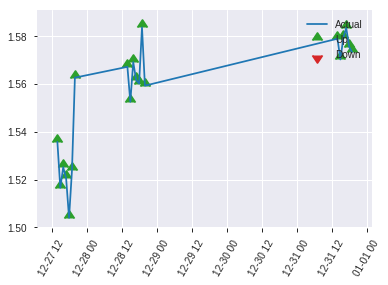


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.392960190547111
RMSE: 0.6268653687572086
LogLoss: 1.3806263646538248
Mean Per-Class Error: 0.47430555555555554
AUC: 0.5111111111111111
pr_auc: 0.4860637351553962
Gini: 0.022222222222222143
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.02296994197738244: 


,0,1,Error,Rate
0,2.0,88.0,0.9778,(88.0/90.0)
1,0.0,80.0,0.0,(0.0/80.0)
Total,2.0,168.0,0.5176,(88.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0229699,0.6451613,167.0
max f2,0.0229699,0.8196721,167.0
max f0point5,0.1968535,0.5367232,156.0
max accuracy,0.9872895,0.5470588,22.0
max precision,0.9996853,1.0,0.0
max recall,0.0229699,1.0,167.0
max specificity,0.9996853,1.0,0.0
max absolute_mcc,0.9988731,0.1157275,1.0
max min_per_class_accuracy,0.8462582,0.5,84.0
max mean_per_class_accuracy,0.9872895,0.5256944,22.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 71.32 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.9988055,2.125,2.125,1.0,0.9992792,1.0,0.9992792,0.025,0.025,112.5,112.5
,2,0.0235294,0.9982453,0.0,1.0625,0.0,0.9985508,0.5,0.9989150,0.0,0.025,-100.0,6.25
,3,0.0352941,0.9980452,2.125,1.4166667,1.0,0.9980927,0.6666667,0.9986409,0.025,0.05,112.5,41.6666667
,4,0.0411765,0.9972784,0.0,1.2142857,0.0,0.9976826,0.5714286,0.9985040,0.0,0.05,-100.0,21.4285714
,5,0.0529412,0.9961084,0.0,0.9444444,0.0,0.9967379,0.4444444,0.9981115,0.0,0.05,-100.0,-5.5555556
,6,0.1,0.9911433,1.328125,1.125,0.625,0.9933120,0.5294118,0.9958529,0.0625,0.1125,32.8125,12.5
,7,0.1529412,0.9827850,0.9444444,1.0625,0.4444444,0.9876403,0.5,0.9930101,0.05,0.1625,-5.5555556,6.25
,8,0.2,0.9782673,1.0625,1.0625,0.5,0.9800535,0.5,0.9899615,0.05,0.2125,6.25,6.25
,9,0.3,0.9599410,1.0,1.0416667,0.4705882,0.9692523,0.4901961,0.9830584,0.1,0.3125,0.0,4.1666667
,10,0.4,0.9134438,0.7500000,0.96875,0.3529412,0.9372685,0.4558824,0.9716109,0.075,0.3875,-25.0000000,-3.125


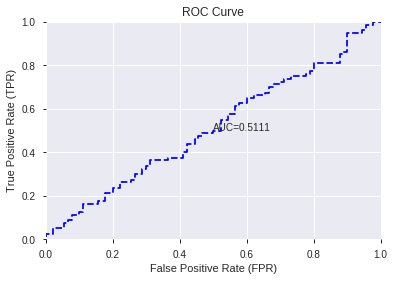

This function is available for GLM models only


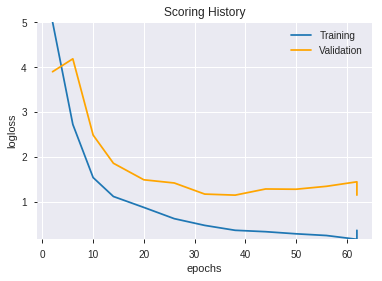

--2019-07-25 04:14:31--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.237.99
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.237.99|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


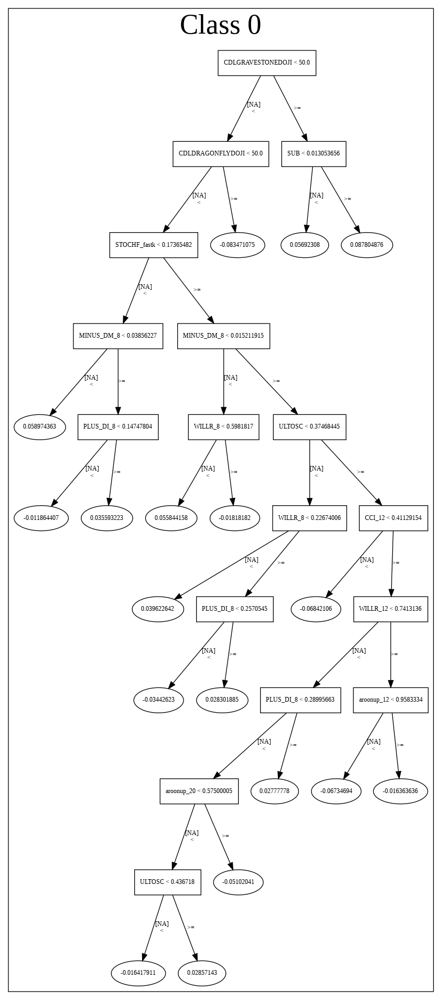

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190725_040618_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190725_040618_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_10_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['CDLGAPSIDESIDEWHITE',
 'CDLMORNINGDOJISTAR',
 'BOP',
 'CDLDOJI',
 'CORREL_12',
 'hour',
 'days_in_month',
 'day',
 'HT_PHASOR_quadrature',
 'FLOOR',
 'HT_TRENDMODE',
 'STOCHRSI_fastk',
 'weekday_name',
 'BETA_12',
 'CORREL_30',
 'HT_DCPERIOD',
 'AROONOSC_14',
 'CEIL',
 'SAREXT',
 'CORREL_8',
 'ADXR_14',
 'aroondown_20',
 'BETA_8',
 'ADX_20',
 'WILLR_8',
 'DX_8',
 'STOCHF_fastd',
 'MACDEXT_hist',
 'AROONOSC_12',
 'DX_24',
 'STOCHRSI_fastd',
 'MFI_12',
 'BETA_14',
 'week',
 'aroonup_20',
 'dayofweek',
 'quarter',
 'aroonup_14',
 'MACDFIX_hist_12',
 'weekday',
 'STOCH_slowk',
 'STOCHF_fastk',
 'DX_30',
 'CMO_14',
 'aroondown_30',
 'aroonup_24',
 'AROONOSC_20',
 'MACDFIX_hist_20',
 'AROONOSC_24',
 'AROONOSC_30']

In [11]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190725_041440_model_1,0.532361,0.698449,0.434028,0.502636,0.252642


,variable,relative_importance,scaled_importance,percentage
0,CDLGAPSIDESIDEWHITE,0.009078,1.000000,0.072251
1,CORREL_12,0.008827,0.972341,0.070252
2,HT_PHASOR_quadrature,0.007366,0.811464,0.058629
3,CDLMORNINGDOJISTAR,0.007019,0.773196,0.055864
4,day,0.006773,0.746096,0.053906
5,BETA_12,0.006248,0.688292,0.049730
6,BETA_14,0.005784,0.637090,0.046030
7,quarter,0.005080,0.559558,0.040428
8,STOCHF_fastd,0.004408,0.485623,0.035087
9,STOCH_slowk,0.004400,0.484673,0.035018


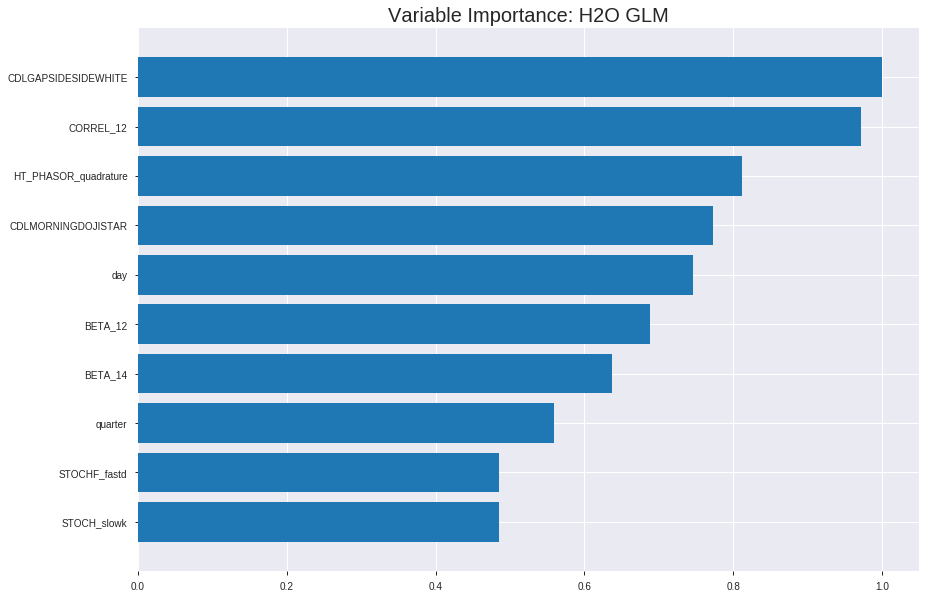

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190725_041440_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24843104595457213
RMSE: 0.4984285765830167
LogLoss: 0.6900026913466478
Null degrees of freedom: 1184
Residual degrees of freedom: 1134
Null deviance: 1639.617345269403
Residual deviance: 1635.3063784915548
AIC: 1737.3063784915548
AUC: 0.5571337175759584
pr_auc: 0.5649085762819608
Gini: 0.11426743515191684
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5047603957349488: 


,0,1,Error,Rate
0,10.0,552.0,0.9822,(552.0/562.0)
1,1.0,622.0,0.0016,(1.0/623.0)
Total,11.0,1174.0,0.4667,(553.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5047604,0.6922649,388.0
max f2,0.5047604,0.8483361,388.0
max f0point5,0.5191182,0.5896951,278.0
max accuracy,0.5232133,0.5603376,227.0
max precision,0.5827794,1.0,0.0
max recall,0.5026012,1.0,394.0
max specificity,0.5827794,1.0,0.0
max absolute_mcc,0.5232133,0.1126595,227.0
max min_per_class_accuracy,0.5257528,0.5498221,195.0
max mean_per_class_accuracy,0.5232133,0.5552058,227.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 52.57 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.5450157,1.4265650,1.4265650,0.75,0.5551143,0.75,0.5551143,0.0144462,0.0144462,42.6565008,42.6565008
,2,0.0202532,0.5426583,0.7925361,1.1095506,0.4166667,0.5436951,0.5833333,0.5494047,0.0080257,0.0224719,-20.7463884,10.9550562
,3,0.0303797,0.5420027,0.7925361,1.0038791,0.4166667,0.5424642,0.5277778,0.5470912,0.0080257,0.0304976,-20.7463884,0.3879080
,4,0.0405063,0.5408501,1.4265650,1.1095506,0.75,0.5412595,0.5833333,0.5456333,0.0144462,0.0449438,42.6565008,10.9550562
,5,0.0506329,0.5396583,0.6340289,1.0144462,0.3333333,0.5402442,0.5333333,0.5445555,0.0064205,0.0513644,-36.5971108,1.4446228
,6,0.1004219,0.5367904,1.0961177,1.0549388,0.5762712,0.5380397,0.5546218,0.5413250,0.0545746,0.1059390,9.6117746,5.4938829
,7,0.1502110,0.5349018,0.9349240,1.0151586,0.4915254,0.5357257,0.5337079,0.5394690,0.0465490,0.1524880,-6.5076040,1.5158620
,8,0.2,0.5334037,1.2250728,1.0674157,0.6440678,0.5341194,0.5611814,0.5381373,0.0609952,0.2134831,22.5072775,6.7415730
,9,0.3004219,0.5307657,1.2147780,1.1166745,0.6386555,0.5321821,0.5870787,0.5361466,0.1219904,0.3354735,21.4778046,11.6674482
,10,0.4,0.5283063,1.0155209,1.0914928,0.5338983,0.5295868,0.5738397,0.5345136,0.1011236,0.4365971,1.5520853,9.1492777




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.252161386902186
RMSE: 0.5021567353946236
LogLoss: 0.6974805889714535
Null degrees of freedom: 338
Residual degrees of freedom: 288
Null deviance: 472.19286403265005
Residual deviance: 472.8918393226454
AIC: 574.8918393226454
AUC: 0.5097950362520914
pr_auc: 0.4749818362871784
Gini: 0.019590072504182876
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5191963911566297: 


,0,1,Error,Rate
0,8.0,168.0,0.9545,(168.0/176.0)
1,2.0,161.0,0.0123,(2.0/163.0)
Total,10.0,329.0,0.5015,(170.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5191964,0.6544715,328.0
max f2,0.5087952,0.8240647,336.0
max f0point5,0.5283197,0.5546002,249.0
max accuracy,0.5299109,0.5427729,231.0
max precision,0.5488551,0.6666667,2.0
max recall,0.5087952,1.0,336.0
max specificity,0.5497447,0.9943182,0.0
max absolute_mcc,0.5283197,0.1179904,249.0
max min_per_class_accuracy,0.5342677,0.4723926,168.0
max mean_per_class_accuracy,0.5283197,0.5519555,249.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 53.35 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.5488138,1.0398773,1.0398773,0.5,0.5492142,0.5,0.5492142,0.0122699,0.0122699,3.9877301,3.9877301
,2,0.0206490,0.5473917,0.6932515,0.8913234,0.3333333,0.5484436,0.4285714,0.5488839,0.0061350,0.0184049,-30.6748466,-10.8676599
,3,0.0324484,0.5463851,0.5199387,0.7562744,0.25,0.5469049,0.3636364,0.5481643,0.0061350,0.0245399,-48.0061350,-24.3725600
,4,0.0412979,0.5459060,1.3865031,0.8913234,0.6666667,0.5461893,0.4285714,0.5477411,0.0122699,0.0368098,38.6503067,-10.8676599
,5,0.0501475,0.5453196,1.3865031,0.9787080,0.6666667,0.5457868,0.4705882,0.5473962,0.0122699,0.0490798,38.6503067,-2.1291952
,6,0.1002950,0.5429676,1.1010466,1.0398773,0.5294118,0.5442764,0.5,0.5458363,0.0552147,0.1042945,10.1046554,3.9877301
,7,0.1504425,0.5417722,0.6116925,0.8971490,0.2941176,0.5423844,0.4313725,0.5446857,0.0306748,0.1349693,-38.8307470,-10.2850956
,8,0.2005900,0.5404904,0.9787080,0.9175388,0.4705882,0.5410540,0.4411765,0.5437778,0.0490798,0.1840491,-2.1291952,-8.2461205
,9,0.3008850,0.5380940,1.0398773,0.9583183,0.5,0.5390393,0.4607843,0.5421983,0.1042945,0.2883436,3.9877301,-4.1681703
,10,0.4011799,0.5360312,0.7952003,0.9175388,0.3823529,0.5370185,0.4411765,0.5409033,0.0797546,0.3680982,-20.4799711,-8.2461205



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-07-25 04:14:41,0.000 sec,2,.27E1,51,1.3800054,1.3949612
,2019-07-25 04:14:41,0.014 sec,4,.17E1,51,1.3784418,1.3962046
,2019-07-25 04:14:41,0.025 sec,6,.11E1,51,1.3764254,1.3982660
,2019-07-25 04:14:41,0.039 sec,8,.66E0,51,1.3739585,1.4015433
,2019-07-25 04:14:41,0.053 sec,10,.41E0,51,1.3711200,1.4063710


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5705882352941176)

('F1', 0.6484018264840182)

('auc', 0.5323611111111112)

('logloss', 0.6984487201555327)

('mean_per_class_error', 0.4256944444444445)

('rmse', 0.5026355489276381)

('mse', 0.252642495045788)

glm prediction progress: |████████████████████████████████████████████████| 100%


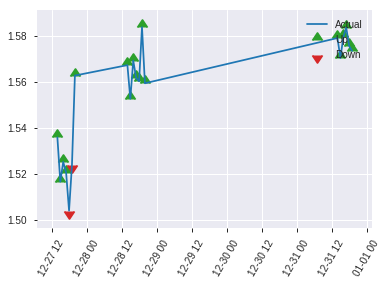


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.252642495045788
RMSE: 0.5026355489276381
LogLoss: 0.6984487201555327
Null degrees of freedom: 169
Residual degrees of freedom: 119
Null deviance: 237.15156222668182
Residual deviance: 237.47256485288113
AIC: 339.47256485288113
AUC: 0.5323611111111112
pr_auc: 0.4643851707602533
Gini: 0.06472222222222235
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5211943971875052: 


,0,1,Error,Rate
0,22.0,68.0,0.7556,(68.0/90.0)
1,9.0,71.0,0.1125,(9.0/80.0)
Total,31.0,139.0,0.4529,(77.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5211944,0.6484018,138.0
max f2,0.5111337,0.8163265,169.0
max f0point5,0.5211944,0.5581761,138.0
max accuracy,0.5284345,0.5705882,92.0
max precision,0.5284345,0.5376344,92.0
max recall,0.5111337,1.0,169.0
max specificity,0.5772749,0.9888889,0.0
max absolute_mcc,0.5211944,0.1705568,138.0
max min_per_class_accuracy,0.5298049,0.5375,82.0
max mean_per_class_accuracy,0.5281986,0.5743056,94.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 52.98 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.5484475,0.0,0.0,0.0,0.5629884,0.0,0.5629884,0.0,0.0,-100.0,-100.0
,2,0.0235294,0.5460398,1.0625,0.53125,0.5,0.5475565,0.25,0.5552724,0.0125,0.0125,6.25,-46.875
,3,0.0352941,0.5447791,1.0625,0.7083333,0.5,0.5448103,0.3333333,0.5517850,0.0125,0.025,6.25,-29.1666667
,4,0.0411765,0.5443565,2.125,0.9107143,1.0,0.5446619,0.4285714,0.5507674,0.0125,0.0375,112.5,-8.9285714
,5,0.0529412,0.5436449,0.0,0.7083333,0.0,0.5439626,0.3333333,0.5492553,0.0,0.0375,-100.0,-29.1666667
,6,0.1,0.5402396,0.796875,0.7500000,0.375,0.5425948,0.3529412,0.5461209,0.0375,0.075,-20.3125,-25.0000000
,7,0.1529412,0.5384756,0.7083333,0.7355769,0.3333333,0.5394880,0.3461538,0.5438249,0.0375,0.1125,-29.1666667,-26.4423077
,8,0.2,0.5374178,0.796875,0.7500000,0.375,0.5379740,0.3529412,0.5424482,0.0375,0.15,-20.3125,-25.0000000
,9,0.3,0.5338514,1.5000000,1.0,0.7058824,0.5355024,0.4705882,0.5401329,0.15,0.3,50.0000000,0.0
,10,0.4,0.5319426,1.375,1.09375,0.6470588,0.5328846,0.5147059,0.5383208,0.1375,0.4375,37.5,9.375


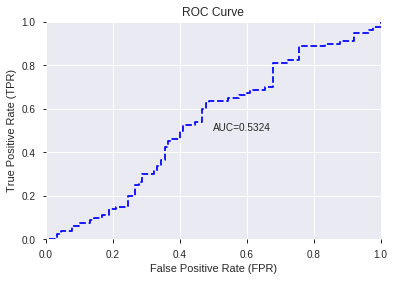

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


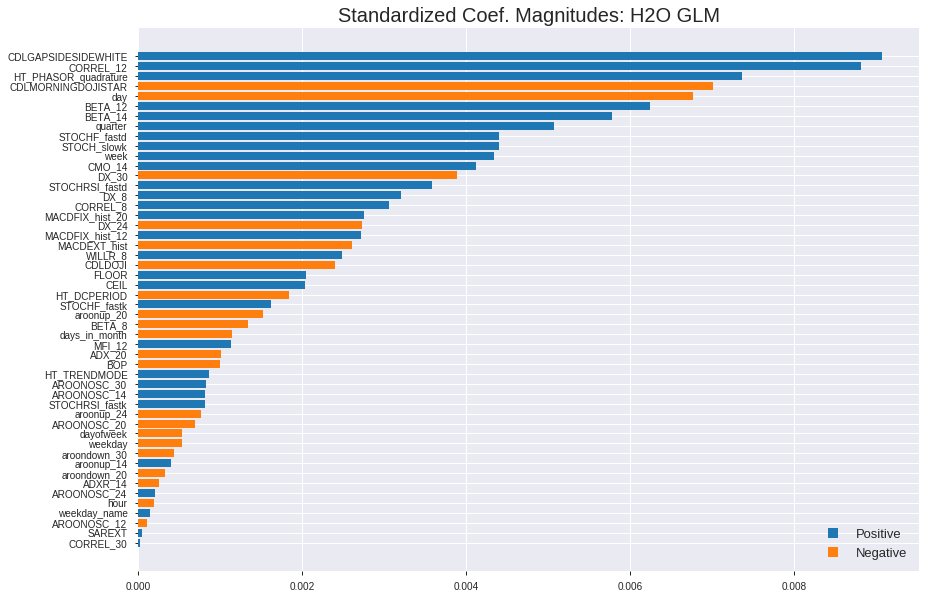

'log_likelihood'
--2019-07-25 04:14:47--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.96.227
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.96.227|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


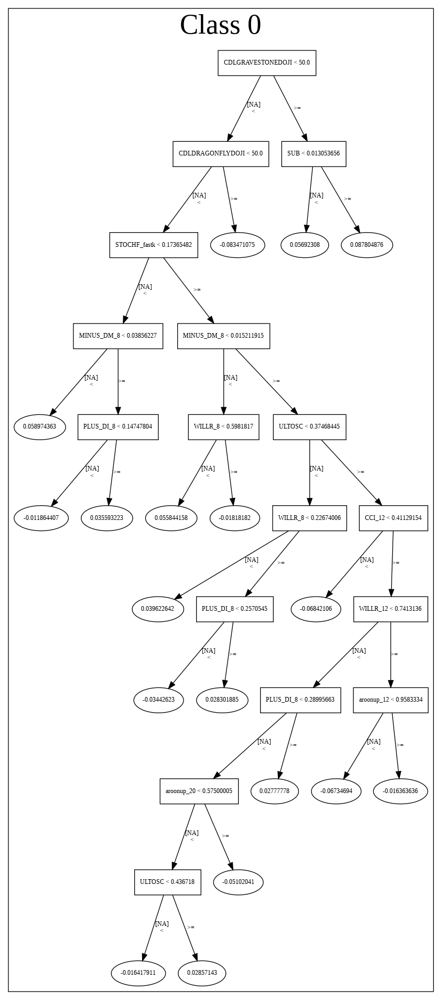

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190725_041440_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190725_041440_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_18_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_18_s

['CDLGAPSIDESIDEWHITE',
 'CORREL_12',
 'HT_PHASOR_quadrature',
 'CDLMORNINGDOJISTAR',
 'day',
 'BETA_12',
 'BETA_14',
 'quarter',
 'STOCHF_fastd',
 'STOCH_slowk',
 'week',
 'CMO_14',
 'DX_30',
 'STOCHRSI_fastd',
 'DX_8',
 'CORREL_8',
 'MACDFIX_hist_20',
 'DX_24',
 'MACDFIX_hist_12',
 'MACDEXT_hist',
 'WILLR_8',
 'CDLDOJI',
 'FLOOR',
 'CEIL',
 'HT_DCPERIOD',
 'STOCHF_fastk',
 'aroonup_20',
 'BETA_8',
 'days_in_month',
 'MFI_12',
 'ADX_20',
 'BOP',
 'HT_TRENDMODE',
 'AROONOSC_30',
 'AROONOSC_14',
 'STOCHRSI_fastk',
 'aroonup_24',
 'AROONOSC_20',
 'dayofweek',
 'weekday',
 'aroondown_30',
 'aroonup_14',
 'aroondown_20',
 'ADXR_14',
 'AROONOSC_24',
 'hour',
 'weekday_name',
 'AROONOSC_12',
 'SAREXT',
 'CORREL_30']

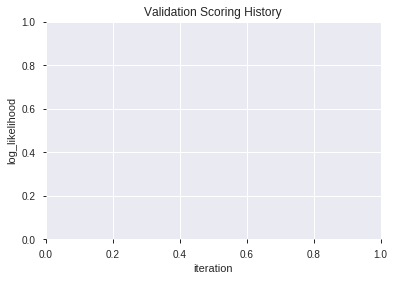

In [12]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190725_041455_model_3,0.524583,0.712991,0.484028,0.509458,0.259547
1,XGBoost_3_AutoML_20190725_041455,0.518889,0.706288,0.488889,0.506403,0.256444
2,XGBoost_grid_1_AutoML_20190725_041455_model_1,0.509028,0.711220,0.488889,0.508555,0.258628
3,XGBoost_grid_1_AutoML_20190725_041455_model_4,0.504097,0.706688,0.477778,0.506587,0.256630
4,XGBoost_2_AutoML_20190725_041455,0.499306,0.711040,0.488889,0.508588,0.258662
5,XGBoost_1_AutoML_20190725_041455,0.495556,0.721407,0.489583,0.513200,0.263375
6,XGBoost_grid_1_AutoML_20190725_041455_model_7,0.494583,0.734088,0.483333,0.518889,0.269246
7,XGBoost_grid_1_AutoML_20190725_041455_model_5,0.492639,0.750570,0.488889,0.525072,0.275701
8,XGBoost_grid_1_AutoML_20190725_041455_model_2,0.489583,0.710529,0.484028,0.508428,0.258499
9,XGBoost_grid_1_AutoML_20190725_041455_model_6,0.456111,0.722895,0.494444,0.514278,0.264482


,variable,relative_importance,scaled_importance,percentage
0,CORREL_12,209.958252,1.000000,0.051147
1,HT_PHASOR_quadrature,208.840393,0.994676,0.050875
2,DX_8,195.694504,0.932064,0.047673
3,STOCHF_fastk,187.529694,0.893176,0.045684
4,BOP,173.916183,0.828337,0.042367
5,BETA_8,166.673035,0.793839,0.040603
6,WILLR_8,166.491333,0.792974,0.040558
7,CORREL_8,138.891342,0.661519,0.033835
8,STOCHRSI_fastd,134.031708,0.638373,0.032651
9,BETA_12,132.553101,0.631331,0.032291


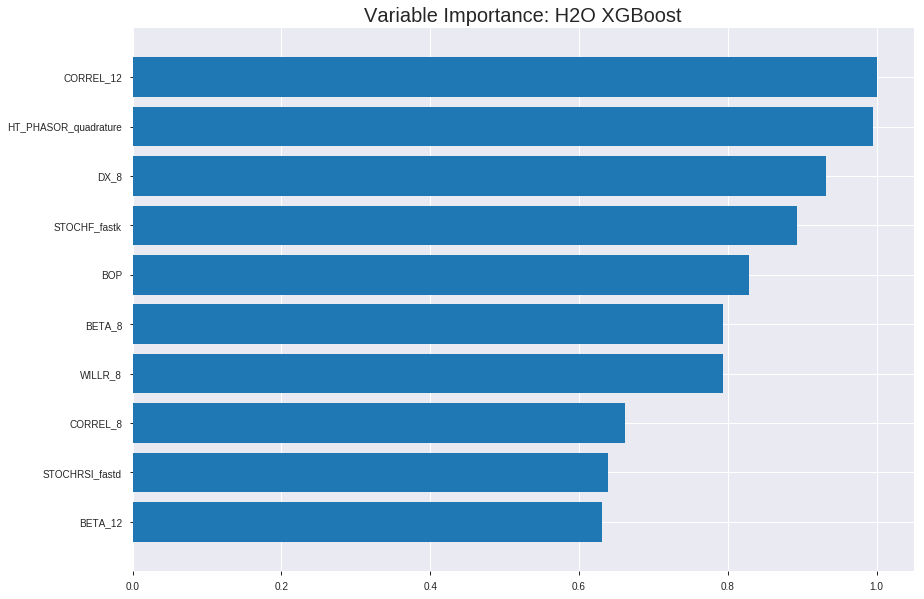

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190725_041455_model_3


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.17808339434348727
RMSE: 0.4219992823968866
LogLoss: 0.5451034839523871
Mean Per-Class Error: 0.12674437202607058
AUC: 0.9461451020489766
pr_auc: 0.9530666668738568
Gini: 0.8922902040979532
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5042225122451782: 


,0,1,Error,Rate
0,469.0,93.0,0.1655,(93.0/562.0)
1,58.0,565.0,0.0931,(58.0/623.0)
Total,527.0,658.0,0.1274,(151.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5042225,0.8821233,218.0
max f2,0.4748561,0.9155364,246.0
max f0point5,0.5592944,0.8967503,161.0
max accuracy,0.5148576,0.8734177,206.0
max precision,0.7699384,1.0,0.0
max recall,0.3957510,1.0,322.0
max specificity,0.7699384,1.0,0.0
max absolute_mcc,0.5148576,0.7462683,206.0
max min_per_class_accuracy,0.5160836,0.8718861,205.0
max mean_per_class_accuracy,0.5148576,0.8732556,206.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 51.99 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.7465862,1.9020867,1.9020867,1.0,0.7562309,1.0,0.7562309,0.0192616,0.0192616,90.2086677,90.2086677
,2,0.0202532,0.7253925,1.9020867,1.9020867,1.0,0.7341689,1.0,0.7451999,0.0192616,0.0385233,90.2086677,90.2086677
,3,0.0303797,0.7145656,1.9020867,1.9020867,1.0,0.7205249,1.0,0.7369749,0.0192616,0.0577849,90.2086677,90.2086677
,4,0.0405063,0.7024897,1.9020867,1.9020867,1.0,0.7087243,1.0,0.7299123,0.0192616,0.0770465,90.2086677,90.2086677
,5,0.0506329,0.6942836,1.9020867,1.9020867,1.0,0.6984129,1.0,0.7236124,0.0192616,0.0963082,90.2086677,90.2086677
,6,0.1004219,0.6649051,1.9020867,1.9020867,1.0,0.6796550,1.0,0.7018184,0.0947030,0.1910112,90.2086677,90.2086677
,7,0.1502110,0.6446381,1.9020867,1.9020867,1.0,0.6541731,1.0,0.6860259,0.0947030,0.2857143,90.2086677,90.2086677
,8,0.2,0.6270559,1.8376092,1.8860353,0.9661017,0.6369371,0.9915612,0.6738055,0.0914928,0.3772071,83.7609163,88.6035313
,9,0.3004219,0.5886028,1.8701188,1.8807149,0.9831933,0.6084677,0.9887640,0.6519650,0.1878010,0.5650080,87.0118834,88.0714917
,10,0.4,0.5532636,1.5474603,1.7977528,0.8135593,0.5704751,0.9451477,0.6316785,0.1540931,0.7191011,54.7460348,79.7752809




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.2584459227917909
RMSE: 0.5083757692807466
LogLoss: 0.7109178901514168
Mean Per-Class Error: 0.440271193530396
AUC: 0.5211238148354712
pr_auc: 0.5105803630829339
Gini: 0.04224762967094242
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.32913368940353394: 


,0,1,Error,Rate
0,0.0,176.0,1.0,(176.0/176.0)
1,0.0,163.0,0.0,(0.0/163.0)
Total,0.0,339.0,0.5192,(176.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3291337,0.6494024,338.0
max f2,0.3291337,0.8224016,338.0
max f0point5,0.3291337,0.5365372,338.0
max accuracy,0.5793954,0.5663717,109.0
max precision,0.6310081,0.625,47.0
max recall,0.3291337,1.0,338.0
max specificity,0.7787239,0.9943182,0.0
max absolute_mcc,0.5793954,0.1274823,109.0
max min_per_class_accuracy,0.5414056,0.5337423,168.0
max mean_per_class_accuracy,0.5793954,0.5597288,109.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 54.32 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.7395927,0.5199387,0.5199387,0.25,0.7577516,0.25,0.7577516,0.0061350,0.0061350,-48.0061350,-48.0061350
,2,0.0206490,0.7102533,1.3865031,0.8913234,0.6666667,0.7195975,0.4285714,0.7413999,0.0122699,0.0184049,38.6503067,-10.8676599
,3,0.0324484,0.6893185,1.5598160,1.1344116,0.75,0.7008887,0.5454545,0.7266685,0.0184049,0.0368098,55.9815951,13.4411601
,4,0.0412979,0.6784242,0.6932515,1.0398773,0.3333333,0.6818395,0.5,0.7170623,0.0061350,0.0429448,-30.6748466,3.9877301
,5,0.0501475,0.6735730,1.3865031,1.1010466,0.6666667,0.6765057,0.5294118,0.7099053,0.0122699,0.0552147,38.6503067,10.1046554
,6,0.1002950,0.6423507,1.3457236,1.2233851,0.6470588,0.6579856,0.5882353,0.6839454,0.0674847,0.1226994,34.5723565,22.3385060
,7,0.1504425,0.6242045,1.3457236,1.2641646,0.6470588,0.6347508,0.6078431,0.6675472,0.0674847,0.1901840,34.5723565,26.4164562
,8,0.2005900,0.6108960,0.7340310,1.1316312,0.3529412,0.6162239,0.5441176,0.6547164,0.0368098,0.2269939,-26.5968964,13.1631180
,9,0.3008850,0.5846030,1.2233851,1.1622158,0.5882353,0.5971296,0.5588235,0.6355208,0.1226994,0.3496933,22.3385060,16.2215807
,10,0.4011799,0.5630639,0.9175388,1.1010466,0.4411765,0.5732434,0.5294118,0.6199515,0.0920245,0.4417178,-8.2461205,10.1046554



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 04:14:59,1.016 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4742616,0.5,0.6931472,0.5,0.0,1.0,0.5191740
,2019-07-25 04:14:59,1.072 sec,5.0,0.4892806,0.6718847,0.7386512,0.7583511,1.9020867,0.3451477,0.5008057,0.6947613,0.4953639,0.4773749,1.5598160,0.5132743
,2019-07-25 04:14:59,1.108 sec,10.0,0.4803575,0.6544391,0.8024997,0.8112832,1.9020867,0.2911392,0.5019285,0.6970388,0.4942659,0.4624815,1.0398773,0.5162242
,2019-07-25 04:14:59,1.150 sec,15.0,0.4700902,0.6346428,0.8609672,0.8726754,1.9020867,0.2210970,0.5020077,0.6972189,0.5025620,0.4711707,0.5199387,0.5103245
,2019-07-25 04:14:59,1.195 sec,20.0,0.4629821,0.6211103,0.8863109,0.8976491,1.9020867,0.2033755,0.5018219,0.6968673,0.5229364,0.5010169,0.5199387,0.5044248
,2019-07-25 04:14:59,1.238 sec,25.0,0.4555525,0.6070069,0.8965530,0.9080181,1.9020867,0.2084388,0.5009143,0.6950093,0.5395984,0.5182324,1.0398773,0.5132743
,2019-07-25 04:14:59,1.292 sec,30.0,0.4488045,0.5943679,0.9077975,0.9172859,1.9020867,0.1772152,0.5026639,0.6986269,0.5345789,0.5181266,1.0398773,0.5162242
,2019-07-25 04:14:59,1.338 sec,35.0,0.4422647,0.5822054,0.9212983,0.9303412,1.9020867,0.1662447,0.5035830,0.7005940,0.5351715,0.5181237,0.5199387,0.5132743
,2019-07-25 04:14:59,1.387 sec,40.0,0.4346966,0.5682379,0.9317317,0.9381495,1.9020867,0.1594937,0.5050478,0.7037154,0.5351018,0.5243000,0.5199387,0.5191740
,2019-07-25 04:14:59,1.441 sec,45.0,0.4277658,0.5556014,0.9405928,0.9482883,1.9020867,0.1392405,0.5076298,0.7092514,0.5215770,0.5132022,0.5199387,0.5191740


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CORREL_12,209.9582520,1.0,0.0511473
HT_PHASOR_quadrature,208.8403931,0.9946758,0.0508750
DX_8,195.6945038,0.9320639,0.0476725
STOCHF_fastk,187.5296936,0.8931761,0.0456835
BOP,173.9161835,0.8283370,0.0423672
---,---,---,---
weekday,17.3797760,0.0827773,0.0042338
HT_TRENDMODE,15.4351053,0.0735151,0.0037601
quarter,10.4994984,0.0500076,0.0025578
CDLDOJI,6.5997610,0.0314337,0.0016077



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5823529411764706)

('F1', 0.6448979591836734)

('auc', 0.5245833333333333)

('logloss', 0.7129911877540349)

('mean_per_class_error', 0.42638888888888893)

('rmse', 0.509457524433088)

('mse', 0.25954696920149045)

xgboost prediction progress: |████████████████████████████████████████████| 100%


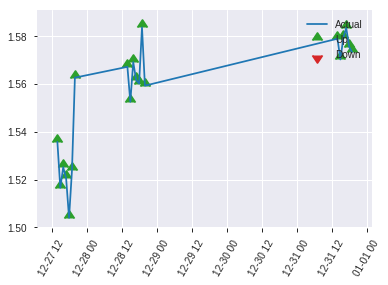


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.25954696920149045
RMSE: 0.509457524433088
LogLoss: 0.7129911877540349
Mean Per-Class Error: 0.42638888888888893
AUC: 0.5245833333333333
pr_auc: 0.5006237160450265
Gini: 0.04916666666666658
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40993863344192505: 


,0,1,Error,Rate
0,4.0,86.0,0.9556,(86.0/90.0)
1,1.0,79.0,0.0125,(1.0/80.0)
Total,5.0,165.0,0.5118,(87.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4099386,0.6448980,164.0
max f2,0.3336742,0.8163265,169.0
max f0point5,0.5831959,0.5379747,58.0
max accuracy,0.5863512,0.5823529,54.0
max precision,0.7882162,1.0,0.0
max recall,0.3336742,1.0,169.0
max specificity,0.7882162,1.0,0.0
max absolute_mcc,0.5831959,0.1543662,58.0
max min_per_class_accuracy,0.5539628,0.525,83.0
max mean_per_class_accuracy,0.5831959,0.5736111,58.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 55.28 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.7533351,1.0625,1.0625,0.5,0.7734905,0.5,0.7734905,0.0125,0.0125,6.25,6.25
,2,0.0235294,0.7311185,1.0625,1.0625,0.5,0.7444339,0.5,0.7589622,0.0125,0.025,6.25,6.25
,3,0.0352941,0.7142322,1.0625,1.0625,0.5,0.7173823,0.5,0.7451022,0.0125,0.0375,6.25,6.25
,4,0.0411765,0.6944077,0.0,0.9107143,0.0,0.7063104,0.4285714,0.7395605,0.0,0.0375,-100.0,-8.9285714
,5,0.0529412,0.6871731,2.125,1.1805556,1.0,0.6889541,0.5555556,0.7283147,0.025,0.0625,112.5,18.0555556
,6,0.1,0.6478996,1.328125,1.25,0.625,0.6646884,0.5882353,0.6983729,0.0625,0.125,32.8125,25.0
,7,0.1529412,0.6353803,0.7083333,1.0625,0.3333333,0.6428636,0.5,0.6791581,0.0375,0.1625,-29.1666667,6.25
,8,0.2,0.6149308,1.328125,1.125,0.625,0.6215983,0.5294118,0.6656147,0.0625,0.225,32.8125,12.5
,9,0.3,0.5890853,1.375,1.2083333,0.6470588,0.6012127,0.5686275,0.6441473,0.1375,0.3625,37.5,20.8333333
,10,0.4,0.5758800,0.875,1.125,0.4117647,0.5829129,0.5294118,0.6288387,0.0875,0.45,-12.5,12.5


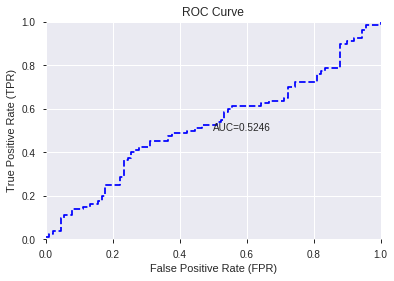

This function is available for GLM models only


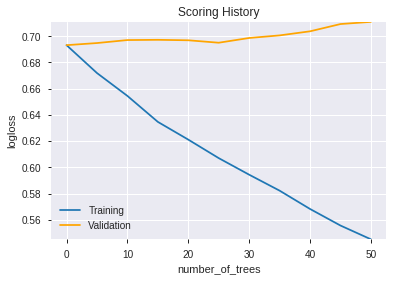

--2019-07-25 04:15:09--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.16.88
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.16.88|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.ge

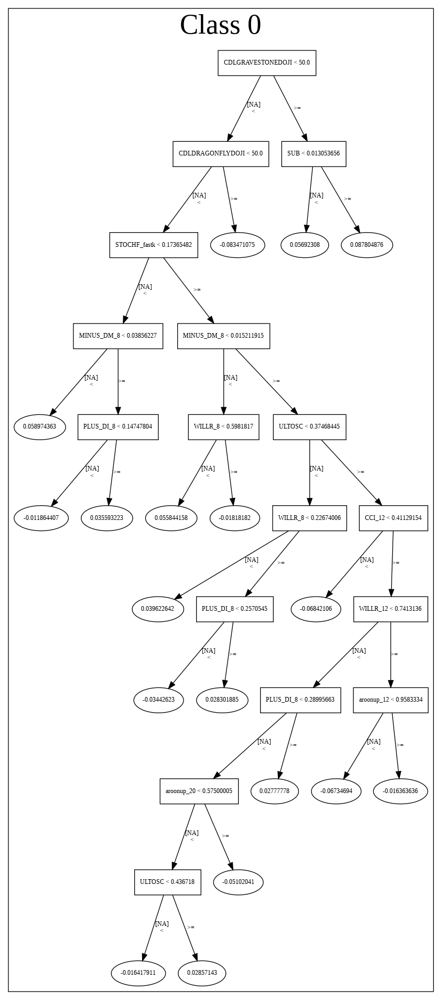

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190725_041455_model_3',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190725_041455_model_3',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_26_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['CORREL_12',
 'HT_PHASOR_quadrature',
 'DX_8',
 'STOCHF_fastk',
 'BOP',
 'BETA_8',
 'WILLR_8',
 'CORREL_8',
 'STOCHRSI_fastd',
 'BETA_12',
 'ADXR_14',
 'HT_DCPERIOD',
 'MACDFIX_hist_20',
 'MACDEXT_hist',
 'MACDFIX_hist_12',
 'STOCH_slowk',
 'day',
 'MFI_12',
 'BETA_14',
 'DX_24',
 'ADX_20',
 'STOCHRSI_fastk',
 'SAREXT',
 'CORREL_30',
 'week',
 'DX_30',
 'aroondown_30',
 'AROONOSC_30',
 'CMO_14',
 'aroonup_14',
 'aroondown_20',
 'AROONOSC_12',
 'AROONOSC_24',
 'AROONOSC_20',
 'hour',
 'dayofweek',
 'aroonup_20',
 'weekday_name',
 'STOCHF_fastd',
 'AROONOSC_14',
 'days_in_month',
 'aroonup_24',
 'weekday',
 'HT_TRENDMODE',
 'quarter',
 'CDLDOJI',
 'CEIL']

In [13]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190725_041518_model_1,0.523056,0.70623,0.452083,0.506439,0.25648


,variable,relative_importance,scaled_importance,percentage
0,CDLGAPSIDESIDEWHITE,8.308442e-03,1.000000,1.240776e-02
1,CDL3OUTSIDE,8.305434e-03,0.999638,1.240327e-02
2,CDLSEPARATINGLINES,7.685628e-03,0.925038,1.147766e-02
3,CDLINVERTEDHAMMER,7.324950e-03,0.881627,1.093903e-02
4,CDLSTALLEDPATTERN,7.198587e-03,0.866418,1.075032e-02
5,CDLBELTHOLD,6.901392e-03,0.830648,1.030649e-02
6,CORREL_12,6.870104e-03,0.826882,1.025976e-02
7,CDLSHOOTINGSTAR,6.854596e-03,0.825016,1.023660e-02
8,CDLXSIDEGAP3METHODS,6.797714e-03,0.818170,1.015165e-02
9,CDLHIKKAKE,6.596989e-03,0.794010,9.851894e-03


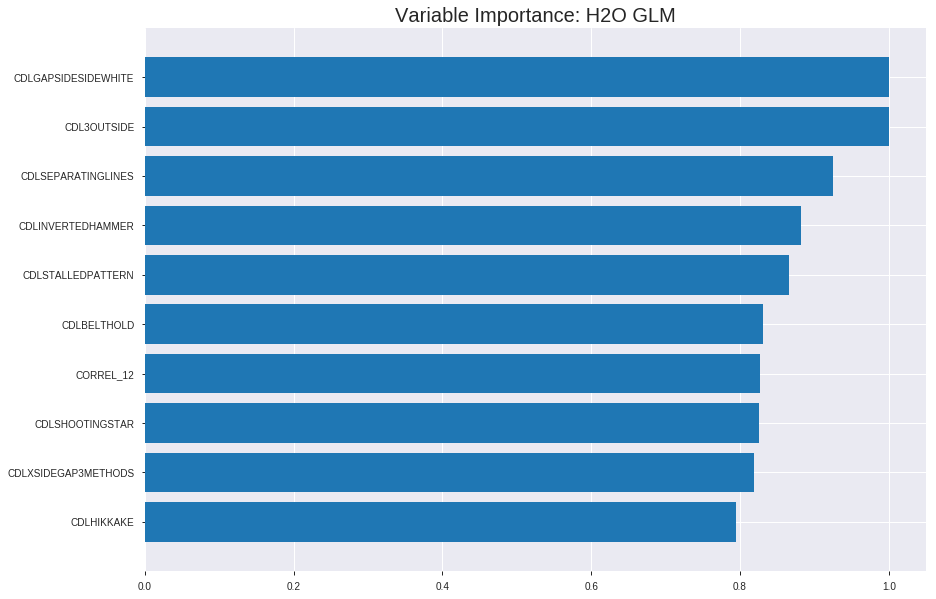

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190725_041518_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.2459630617207227
RMSE: 0.49594663192799554
LogLoss: 0.6850328578119914
Null degrees of freedom: 1184
Residual degrees of freedom: 152
Null deviance: 1639.617345269403
Residual deviance: 1623.5278730144198
AIC: 3689.52787301442
AUC: 0.593557747782227
pr_auc: 0.5970484210897683
Gini: 0.18711549556445406
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49581364402501593: 


,0,1,Error,Rate
0,77.0,485.0,0.863,(485.0/562.0)
1,33.0,590.0,0.053,(33.0/623.0)
Total,110.0,1075.0,0.4371,(518.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4958136,0.6949352,347.0
max f2,0.4725437,0.8483115,395.0
max f0point5,0.5078718,0.6055937,295.0
max accuracy,0.5150218,0.5780591,259.0
max precision,0.6427833,1.0,0.0
max recall,0.4725437,1.0,395.0
max specificity,0.6427833,1.0,0.0
max absolute_mcc,0.5078718,0.1515079,295.0
max min_per_class_accuracy,0.5228342,0.5658363,220.0
max mean_per_class_accuracy,0.5198521,0.5741319,235.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 52.57 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.6052700,1.2680578,1.2680578,0.6666667,0.6141572,0.6666667,0.6141572,0.0128411,0.0128411,26.8057785,26.8057785
,2,0.0202532,0.5978110,1.5850722,1.4265650,0.8333333,0.6022207,0.75,0.6081889,0.0160514,0.0288925,58.5072231,42.6565008
,3,0.0303797,0.5903191,1.4265650,1.4265650,0.75,0.5936685,0.75,0.6033488,0.0144462,0.0433387,42.6565008,42.6565008
,4,0.0405063,0.5823542,1.1095506,1.3473114,0.5833333,0.5858416,0.7083333,0.5989720,0.0112360,0.0545746,10.9550562,34.7311396
,5,0.0506329,0.5745723,0.7925361,1.2363563,0.4166667,0.5790467,0.65,0.5949869,0.0080257,0.0626003,-20.7463884,23.6356340
,6,0.1004219,0.5570736,1.1928340,1.2147780,0.6271186,0.5650819,0.6386555,0.5801601,0.0593900,0.1219904,19.2834018,21.4778046
,7,0.1502110,0.5480653,1.0638790,1.1647609,0.5593220,0.5517478,0.6123596,0.5707425,0.0529695,0.1749599,6.3878989,16.4760943
,8,0.2,0.5426863,1.2895503,1.1958266,0.6779661,0.5451314,0.6286920,0.5643667,0.0642055,0.2391653,28.9550290,19.5826645
,9,0.3004219,0.5343506,1.1348584,1.1754468,0.5966387,0.5379591,0.6179775,0.5555395,0.1139647,0.3531300,13.4858438,17.5446823
,10,0.4,0.5288119,1.0316402,1.1396469,0.5423729,0.5316021,0.5991561,0.5495804,0.1027287,0.4558587,3.1640232,13.9646870




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2557968253111657
RMSE: 0.5057636061552528
LogLoss: 0.7048878860099458
Null degrees of freedom: 338
Residual degrees of freedom: -694
Null deviance: 472.19286403265005
Residual deviance: 477.91398671474326
AIC: 2543.9139867147433
AUC: 0.5382041271611824
pr_auc: 0.4923746847292841
Gini: 0.07640825432236475
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5077627307003674: 


,0,1,Error,Rate
0,1.0,175.0,0.9943,(175.0/176.0)
1,0.0,163.0,0.0,(0.0/163.0)
Total,1.0,338.0,0.5162,(175.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5077627,0.6506986,337.0
max f2,0.5077627,0.8232323,337.0
max f0point5,0.5487505,0.5630027,238.0
max accuracy,0.5487832,0.5575221,236.0
max precision,0.6281699,1.0,0.0
max recall,0.5077627,1.0,337.0
max specificity,0.6281699,1.0,0.0
max absolute_mcc,0.5487505,0.1434802,238.0
max min_per_class_accuracy,0.5595782,0.5340909,169.0
max mean_per_class_accuracy,0.5487505,0.5654803,238.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 56.29 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.6238348,1.5598160,1.5598160,0.75,0.6270535,0.75,0.6270535,0.0184049,0.0184049,55.9815951,55.9815951
,2,0.0206490,0.6117379,0.0,0.8913234,0.0,0.6156129,0.4285714,0.6221504,0.0,0.0184049,-100.0,-10.8676599
,3,0.0324484,0.6088975,0.5199387,0.7562744,0.25,0.6102873,0.3636364,0.6178365,0.0061350,0.0245399,-48.0061350,-24.3725600
,4,0.0412979,0.6055441,1.3865031,0.8913234,0.6666667,0.6066029,0.4285714,0.6154293,0.0122699,0.0368098,38.6503067,-10.8676599
,5,0.0501475,0.6042990,0.6932515,0.8563695,0.3333333,0.6052103,0.4117647,0.6136260,0.0061350,0.0429448,-30.6748466,-14.3630458
,6,0.1002950,0.5964153,0.9787080,0.9175388,0.4705882,0.6004315,0.4411765,0.6070288,0.0490798,0.0920245,-2.1291952,-8.2461205
,7,0.1504425,0.5890507,0.8563695,0.8971490,0.4117647,0.5931614,0.4313725,0.6024063,0.0429448,0.1349693,-14.3630458,-10.2850956
,8,0.2005900,0.5835964,0.9787080,0.9175388,0.4705882,0.5864031,0.4411765,0.5984055,0.0490798,0.1840491,-2.1291952,-8.2461205
,9,0.3008850,0.5749271,1.2845543,1.0398773,0.6176471,0.5784295,0.5,0.5917469,0.1288344,0.3128834,28.4554313,3.9877301
,10,0.4011799,0.5671571,1.1010466,1.0551696,0.5294118,0.5719063,0.5073529,0.5867867,0.1104294,0.4233129,10.1046554,5.5169614



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-07-25 04:15:20,0.000 sec,2,.29E1,1033,1.3700657,1.4097758
,2019-07-25 04:15:21,1.316 sec,4,.21E1,1033,1.3669113,1.4129084
,2019-07-25 04:15:22,2.630 sec,6,.15E1,1033,1.3631438,1.4165843
,2019-07-25 04:15:24,3.938 sec,8,.11E1,1033,1.3586998,1.4210763
,2019-07-25 04:15:25,5.268 sec,10,.81E0,1033,1.3536021,1.4264425


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5529411764705883)

('F1', 0.6553191489361703)

('auc', 0.5230555555555556)

('logloss', 0.7062299531225238)

('mean_per_class_error', 0.4520833333333333)

('rmse', 0.5064386045150248)

('mse', 0.2564800601431257)

glm prediction progress: |████████████████████████████████████████████████| 100%


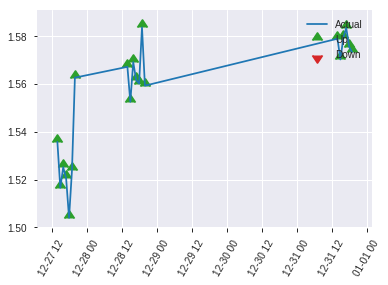


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.2564800601431257
RMSE: 0.5064386045150248
LogLoss: 0.7062299531225238
Null degrees of freedom: 169
Residual degrees of freedom: -863
Null deviance: 237.15156222668182
Residual deviance: 240.1181840616581
AIC: 2306.118184061658
AUC: 0.5230555555555556
pr_auc: 0.47195934780405047
Gini: 0.046111111111111214
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5363010910447127: 


,0,1,Error,Rate
0,12.0,78.0,0.8667,(78.0/90.0)
1,3.0,77.0,0.0375,(3.0/80.0)
Total,15.0,155.0,0.4765,(81.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5363011,0.6553191,154.0
max f2,0.5264343,0.8213552,166.0
max f0point5,0.5363011,0.55,154.0
max accuracy,0.5650720,0.5529412,55.0
max precision,0.6291693,1.0,0.0
max recall,0.5264343,1.0,166.0
max specificity,0.6291693,1.0,0.0
max absolute_mcc,0.5363011,0.1686442,154.0
max min_per_class_accuracy,0.5556465,0.5222222,84.0
max mean_per_class_accuracy,0.5363011,0.5479167,154.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 55.99 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.6144392,1.0625,1.0625,0.5,0.6223787,0.5,0.6223787,0.0125,0.0125,6.25,6.25
,2,0.0235294,0.6067570,1.0625,1.0625,0.5,0.6112457,0.5,0.6168122,0.0125,0.025,6.25,6.25
,3,0.0352941,0.6003339,1.0625,1.0625,0.5,0.6021351,0.5,0.6119198,0.0125,0.0375,6.25,6.25
,4,0.0411765,0.5973334,0.0,0.9107143,0.0,0.5985469,0.4285714,0.6100094,0.0,0.0375,-100.0,-8.9285714
,5,0.0529412,0.5960369,1.0625,0.9444444,0.5,0.5967448,0.4444444,0.6070617,0.0125,0.05,6.25,-5.5555556
,6,0.1,0.5881853,0.796875,0.875,0.375,0.5924220,0.4117647,0.6001725,0.0375,0.0875,-20.3125,-12.5
,7,0.1529412,0.5835656,0.9444444,0.8990385,0.4444444,0.5856871,0.4230769,0.5951583,0.05,0.1375,-5.5555556,-10.0961538
,8,0.2,0.5790703,1.0625,0.9375,0.5,0.5815973,0.4411765,0.5919675,0.05,0.1875,6.25,-6.25
,9,0.3,0.5679585,1.5000000,1.125,0.7058824,0.5737306,0.5294118,0.5858885,0.15,0.3375,50.0000000,12.5
,10,0.4,0.5606833,1.0,1.09375,0.4705882,0.5641652,0.5147059,0.5804577,0.1,0.4375,0.0,9.375


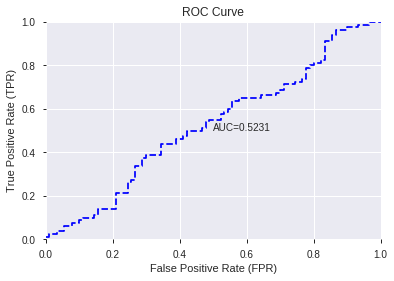

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


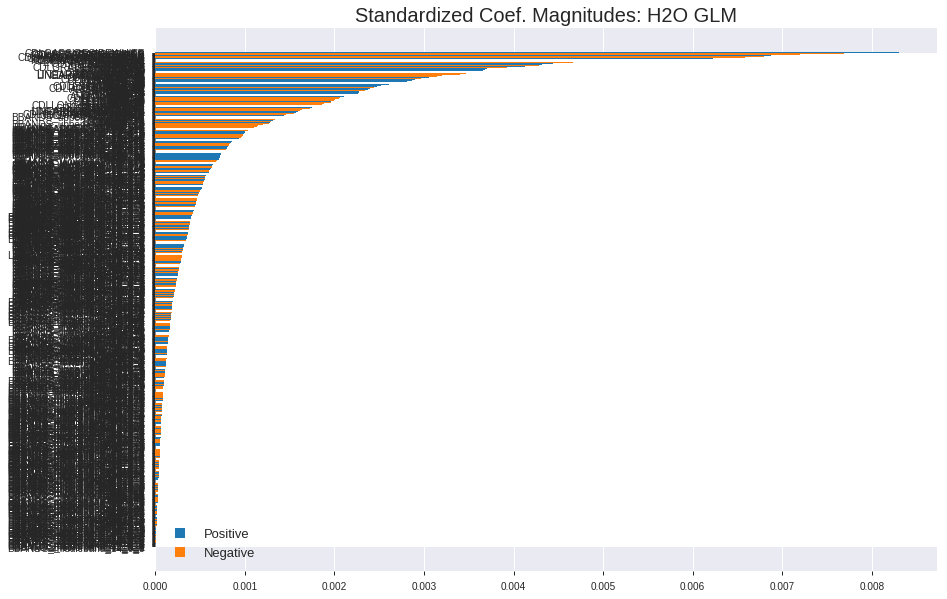

'log_likelihood'
--2019-07-25 04:15:49--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.97.147
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.97.147|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


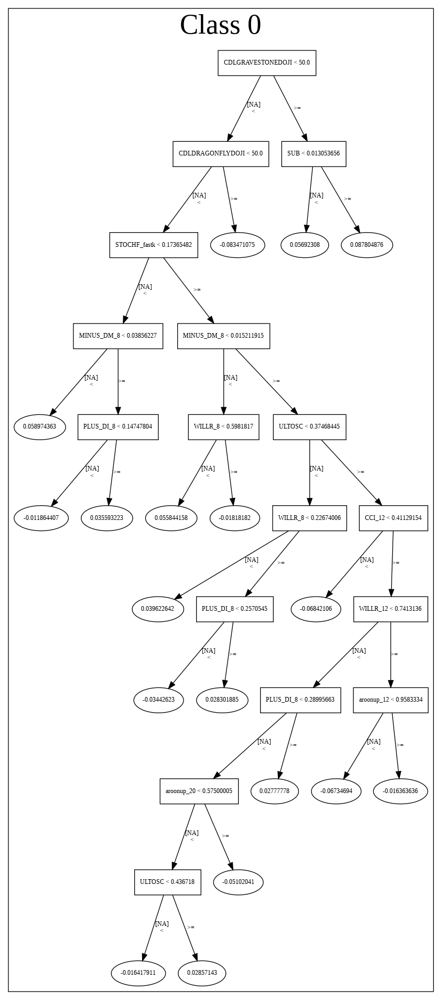

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190725_041518_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190725_041518_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_34_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_34_s

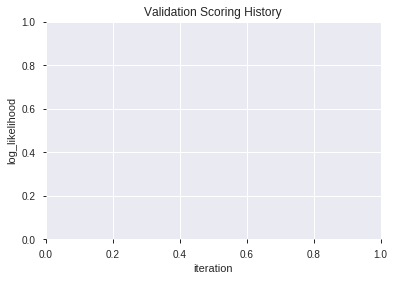

In [14]:
# GLM
glm_features = model_train(feature_name='All',model_algo="GLM")

In [15]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [16]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [17]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_1_AutoML_20190725_041557,0.535972,0.737719,0.483333,0.520387,0.270803
1,XGBoost_grid_1_AutoML_20190725_041557_model_2,0.523333,0.723740,0.500000,0.514531,0.264742
2,XGBoost_grid_1_AutoML_20190725_041557_model_7,0.521806,0.747615,0.500000,0.524457,0.275055
3,XGBoost_grid_1_AutoML_20190725_041557_model_4,0.504028,0.714331,0.500000,0.510177,0.260280
4,XGBoost_grid_1_AutoML_20190725_041557_model_5,0.497639,0.776955,0.462500,0.534054,0.285214
5,XGBoost_2_AutoML_20190725_041557,0.486528,0.727789,0.488889,0.516366,0.266634
6,XGBoost_3_AutoML_20190725_041557,0.482500,0.755683,0.469444,0.527390,0.278140
7,XGBoost_grid_1_AutoML_20190725_041557_model_3,0.480972,0.766311,0.494444,0.532332,0.283377
8,XGBoost_grid_1_AutoML_20190725_041557_model_1,0.474861,0.741118,0.500000,0.522186,0.272678
9,XGBoost_grid_1_AutoML_20190725_041557_model_6,0.460278,0.721374,0.479167,0.513514,0.263696


,variable,relative_importance,scaled_importance,percentage
0,Volume,123.654221,1.000000,0.020507
1,CORREL_20,112.500847,0.909802,0.018657
2,HT_PHASOR_quadrature,104.749466,0.847116,0.017372
3,BETA_24,98.321571,0.795133,0.016306
4,DIV,81.756096,0.661167,0.013558
5,BETA_8,81.107422,0.655921,0.013451
6,CORREL_12,80.242249,0.648924,0.013307
7,BETA_12,79.028343,0.639108,0.013106
8,BOP,76.128548,0.615657,0.012625
9,TRANGE,72.619148,0.587276,0.012043


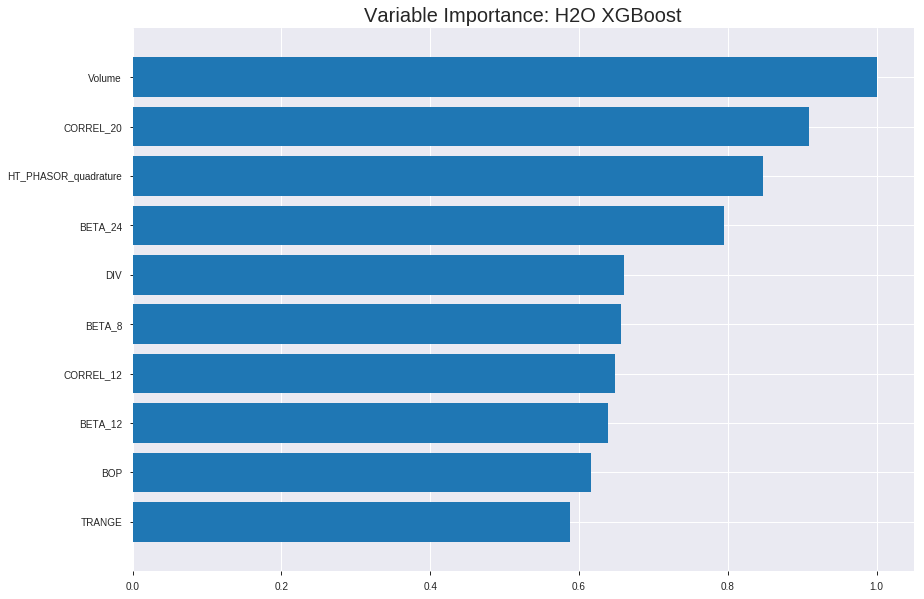

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_20190725_041557


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.14149968098102542
RMSE: 0.37616443343440303
LogLoss: 0.46530791013688116
Mean Per-Class Error: 0.07508725430273677
AUC: 0.9764399102037551
pr_auc: 0.9763903647185425
Gini: 0.9528798204075102
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5115488568941752: 


,0,1,Error,Rate
0,520.0,42.0,0.0747,(42.0/562.0)
1,47.0,576.0,0.0754,(47.0/623.0)
Total,567.0,618.0,0.0751,(89.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5115489,0.9282836,203.0
max f2,0.4428332,0.9501702,248.0
max f0point5,0.5400133,0.9348633,187.0
max accuracy,0.5115489,0.9248945,203.0
max precision,0.8453867,1.0,0.0
max recall,0.3910019,1.0,284.0
max specificity,0.8453867,1.0,0.0
max absolute_mcc,0.5115489,0.8494859,203.0
max min_per_class_accuracy,0.5115489,0.9245586,203.0
max mean_per_class_accuracy,0.5115489,0.9249127,203.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 52.34 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.8194616,1.9020867,1.9020867,1.0,0.8302640,1.0,0.8302640,0.0192616,0.0192616,90.2086677,90.2086677
,2,0.0202532,0.7945419,1.9020867,1.9020867,1.0,0.8082771,1.0,0.8192706,0.0192616,0.0385233,90.2086677,90.2086677
,3,0.0303797,0.7795906,1.9020867,1.9020867,1.0,0.7885393,1.0,0.8090268,0.0192616,0.0577849,90.2086677,90.2086677
,4,0.0405063,0.7684033,1.9020867,1.9020867,1.0,0.7755158,1.0,0.8006491,0.0192616,0.0770465,90.2086677,90.2086677
,5,0.0506329,0.7596226,1.9020867,1.9020867,1.0,0.7639509,1.0,0.7933094,0.0192616,0.0963082,90.2086677,90.2086677
,6,0.1004219,0.7318969,1.9020867,1.9020867,1.0,0.7449564,1.0,0.7693361,0.0947030,0.1910112,90.2086677,90.2086677
,7,0.1502110,0.7062524,1.9020867,1.9020867,1.0,0.7195630,1.0,0.7528383,0.0947030,0.2857143,90.2086677,90.2086677
,8,0.2,0.6867180,1.8698479,1.8940610,0.9830508,0.6956960,0.9957806,0.7386130,0.0930979,0.3788122,86.9847920,89.4060995
,9,0.3004219,0.6418577,1.9020867,1.8967437,1.0,0.6633192,0.9971910,0.7134446,0.1910112,0.5698234,90.2086677,89.6743737
,10,0.4,0.5969051,1.7570123,1.8619583,0.9237288,0.6200926,0.9789030,0.6902050,0.1749599,0.7447833,75.7012270,86.1958266




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.26772255548220103
RMSE: 0.5174191294127045
LogLoss: 0.7314718609751296
Mean Per-Class Error: 0.4512165365309537
AUC: 0.5237381483547128
pr_auc: 0.5101084827495895
Gini: 0.04747629670942555
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3317350149154663: 


,0,1,Error,Rate
0,0.0,176.0,1.0,(176.0/176.0)
1,0.0,163.0,0.0,(0.0/163.0)
Total,0.0,339.0,0.5192,(176.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3317350,0.6494024,338.0
max f2,0.3317350,0.8224016,338.0
max f0point5,0.5592808,0.5470980,221.0
max accuracy,0.5592808,0.5427729,221.0
max precision,0.8411567,1.0,0.0
max recall,0.3317350,1.0,338.0
max specificity,0.8411567,1.0,0.0
max absolute_mcc,0.7812170,0.1271377,4.0
max min_per_class_accuracy,0.6030626,0.4969325,168.0
max mean_per_class_accuracy,0.5592808,0.5487835,221.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 59.42 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.7836684,2.0797546,2.0797546,1.0,0.8087337,1.0,0.8087337,0.0245399,0.0245399,107.9754601,107.9754601
,2,0.0206490,0.7762716,0.6932515,1.4855390,0.3333333,0.7785674,0.7142857,0.7958053,0.0061350,0.0306748,-30.6748466,48.5539001
,3,0.0324484,0.7612803,1.0398773,1.3234802,0.5,0.7680758,0.6363636,0.7857219,0.0122699,0.0429448,3.9877301,32.3480201
,4,0.0412979,0.7560904,0.6932515,1.1884312,0.3333333,0.7589886,0.5714286,0.7799933,0.0061350,0.0490798,-30.6748466,18.8431201
,5,0.0501475,0.7515357,0.6932515,1.1010466,0.3333333,0.7547022,0.5294118,0.7755302,0.0061350,0.0552147,-30.6748466,10.1046554
,6,0.1002950,0.7176544,1.1010466,1.1010466,0.5294118,0.7328222,0.5294118,0.7541762,0.0552147,0.1104294,10.1046554,10.1046554
,7,0.1504425,0.6958382,0.8563695,1.0194875,0.4117647,0.7066939,0.4901961,0.7383488,0.0429448,0.1533742,-14.3630458,1.9487550
,8,0.2005900,0.6726687,0.9787080,1.0092927,0.4705882,0.6835478,0.4852941,0.7246485,0.0490798,0.2024540,-2.1291952,0.9292674
,9,0.3008850,0.6476920,1.0398773,1.0194875,0.5,0.6586182,0.4901961,0.7026384,0.1042945,0.3067485,3.9877301,1.9487550
,10,0.4011799,0.6244679,0.9787080,1.0092927,0.4705882,0.6355047,0.4852941,0.6858550,0.0981595,0.4049080,-2.1291952,0.9292674



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 04:15:57,0.007 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4742616,0.5,0.6931472,0.5,0.0,1.0,0.5191740
,2019-07-25 04:15:58,0.720 sec,5.0,0.4832105,0.6600389,0.8181469,0.8214239,1.9020867,0.2599156,0.4995301,0.6922037,0.5394939,0.5202221,1.5598160,0.5073746
,2019-07-25 04:15:58,0.936 sec,10.0,0.4683155,0.6313446,0.8768401,0.8841398,1.9020867,0.2092827,0.5025206,0.6981924,0.4969325,0.5205104,1.5598160,0.5162242
,2019-07-25 04:15:58,1.127 sec,15.0,0.4532637,0.6029324,0.9098068,0.9138395,1.9020867,0.1670886,0.5023185,0.6978334,0.5363044,0.5277348,1.5598160,0.5132743
,2019-07-25 04:15:59,1.312 sec,20.0,0.4391476,0.5767988,0.9299181,0.9351787,1.9020867,0.1417722,0.5027861,0.6987919,0.5337075,0.5276388,2.0797546,0.5103245
,2019-07-25 04:15:59,1.498 sec,25.0,0.4270670,0.5548512,0.9442815,0.9460754,1.9020867,0.1156118,0.5046629,0.7028102,0.5365310,0.5236240,2.0797546,0.5162242
,2019-07-25 04:15:59,1.693 sec,30.0,0.4149252,0.5330528,0.9561686,0.9571815,1.9020867,0.1029536,0.5092930,0.7128511,0.5355898,0.5196947,1.5598160,0.5191740
,2019-07-25 04:15:59,1.857 sec,35.0,0.4051681,0.5157303,0.9621022,0.9606890,1.9020867,0.0987342,0.5111347,0.7167670,0.5292457,0.5225140,2.0797546,0.5191740
,2019-07-25 04:15:59,2.013 sec,40.0,0.3962564,0.5001235,0.9681529,0.9683065,1.9020867,0.0894515,0.5136508,0.7224548,0.5230061,0.5098422,2.0797546,0.5191740
,2019-07-25 04:15:59,2.175 sec,45.0,0.3860424,0.4824073,0.9736438,0.9735638,1.9020867,0.0835443,0.5149201,0.7258217,0.5316857,0.5126985,1.5598160,0.5191740


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
Volume,123.6542206,1.0,0.0205067
CORREL_20,112.5008469,0.9098019,0.0186570
HT_PHASOR_quadrature,104.7494659,0.8471160,0.0173716
BETA_24,98.3215714,0.7951332,0.0163056
DIV,81.7560959,0.6611670,0.0135584
---,---,---,---
CMO_24,0.7465553,0.0060374,0.0001238
BBANDS_upperband_24_3_3,0.6454811,0.0052200,0.0001070
BBANDS_upperband_8_2_2,0.3292046,0.0026623,0.0000546
BBANDS_lowerband_8_6_4,0.2895241,0.0023414,0.0000480



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5529411764705883)

('F1', 0.6477732793522267)

('auc', 0.5359722222222222)

('logloss', 0.7377190018515014)

('mean_per_class_error', 0.4555555555555555)

('rmse', 0.5203871370160662)

('mse', 0.270802772371778)

xgboost prediction progress: |████████████████████████████████████████████| 100%


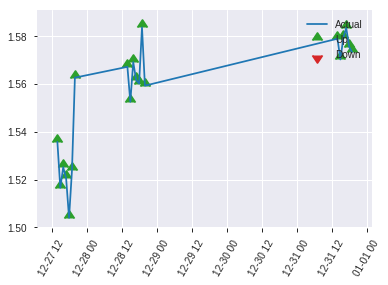


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.270802772371778
RMSE: 0.5203871370160662
LogLoss: 0.7377190018515014
Mean Per-Class Error: 0.4555555555555555
AUC: 0.5359722222222222
pr_auc: 0.496436073469727
Gini: 0.07194444444444437
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40289783477783203: 


,0,1,Error,Rate
0,3.0,87.0,0.9667,(87.0/90.0)
1,0.0,80.0,0.0,(0.0/80.0)
Total,3.0,167.0,0.5118,(87.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4028978,0.6477733,166.0
max f2,0.4028978,0.8213552,166.0
max f0point5,0.5398665,0.5414013,136.0
max accuracy,0.6698731,0.5529412,41.0
max precision,0.7869630,1.0,0.0
max recall,0.4028978,1.0,166.0
max specificity,0.7869630,1.0,0.0
max absolute_mcc,0.4028978,0.1263648,166.0
max min_per_class_accuracy,0.6228635,0.525,83.0
max mean_per_class_accuracy,0.6302611,0.5444444,76.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 61.10 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.7707869,2.125,2.125,1.0,0.7855168,1.0,0.7855168,0.025,0.025,112.5,112.5
,2,0.0235294,0.7618105,1.0625,1.59375,0.5,0.7646494,0.75,0.7750831,0.0125,0.0375,6.25,59.375
,3,0.0352941,0.7425463,0.0,1.0625,0.0,0.7500287,0.5,0.7667316,0.0,0.0375,-100.0,6.25
,4,0.0411765,0.7409559,2.125,1.2142857,1.0,0.7418036,0.5714286,0.7631705,0.0125,0.05,112.5,21.4285714
,5,0.0529412,0.7396527,0.0,0.9444444,0.0,0.7402602,0.4444444,0.7580793,0.0,0.05,-100.0,-5.5555556
,6,0.1,0.7194137,1.328125,1.125,0.625,0.7310669,0.5294118,0.7453676,0.0625,0.1125,32.8125,12.5
,7,0.1529412,0.6936637,0.9444444,1.0625,0.4444444,0.7087093,0.5,0.7326782,0.05,0.1625,-5.5555556,6.25
,8,0.2,0.6801703,0.796875,1.0,0.375,0.6839817,0.4705882,0.7212202,0.0375,0.2,-20.3125,0.0
,9,0.3,0.6542299,1.375,1.125,0.6470588,0.6671300,0.5294118,0.7031901,0.1375,0.3375,37.5,12.5
,10,0.4,0.6371921,1.0,1.09375,0.4705882,0.6469574,0.5147059,0.6891319,0.1,0.4375,0.0,9.375


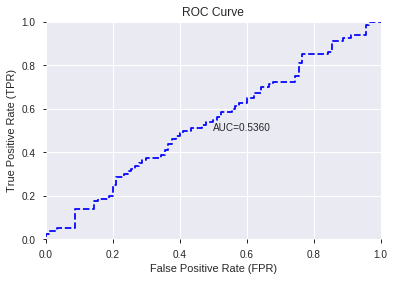

This function is available for GLM models only


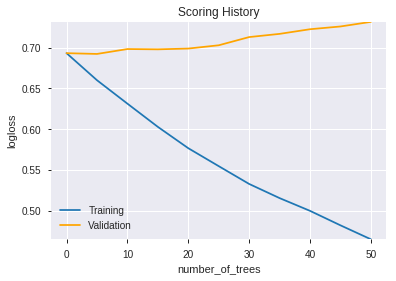

--2019-07-25 04:16:33--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.81.112
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.81.112|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMode

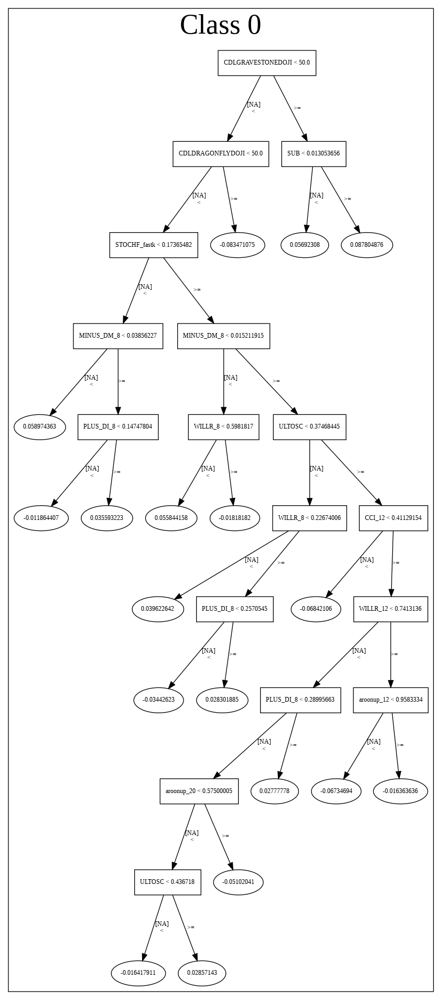

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_1_AutoML_20190725_041557',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_1_AutoML_20190725_041557',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_42_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_42_sid_8832',
   'type

In [18]:
# XGBoost
xgb_features = model_train(feature_name='All',model_algo="XGBoost")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190725_041641_model_4,0.549167,1.121280,0.489583,0.592825,0.351441
1,DeepLearning_grid_1_AutoML_20190725_041641_model_7,0.528750,0.929408,0.458333,0.567594,0.322163
2,DeepLearning_grid_1_AutoML_20190725_041641_model_8,0.526944,0.696820,0.500000,0.501828,0.251832
3,DeepLearning_grid_1_AutoML_20190725_041641_model_1,0.505278,1.628960,0.477778,0.634171,0.402173
4,DeepLearning_grid_1_AutoML_20190725_041641_model_9,0.477500,0.694605,0.500000,0.500728,0.250728
5,DeepLearning_grid_1_AutoML_20190725_041641_model_5,0.476528,0.700532,0.494444,0.503637,0.253650
6,DeepLearning_grid_1_AutoML_20190725_041641_model_6,0.451250,0.716348,0.500000,0.511210,0.261335
7,DeepLearning_1_AutoML_20190725_041641,0.443333,0.838569,0.500000,0.555153,0.308194
8,DeepLearning_grid_1_AutoML_20190725_041641_model_2,0.442639,1.366919,0.484028,0.641786,0.411889
9,DeepLearning_grid_1_AutoML_20190725_041641_model_3,0.435694,1.263592,0.500000,0.630267,0.397236


,variable,relative_importance,scaled_importance,percentage
0,CDLGAPSIDESIDEWHITE,1.000000,1.000000,0.047203
1,CDLMORNINGDOJISTAR,0.875249,0.875249,0.041314
2,CDLDOJI,0.486078,0.486078,0.022944
3,FLOOR,0.465201,0.465201,0.021959
4,days_in_month,0.448685,0.448685,0.021179
5,BOP,0.445520,0.445520,0.021030
6,CEIL,0.441725,0.441725,0.020851
7,BETA_12,0.437046,0.437046,0.020630
8,hour,0.433406,0.433406,0.020458
9,HT_PHASOR_quadrature,0.430609,0.430609,0.020326


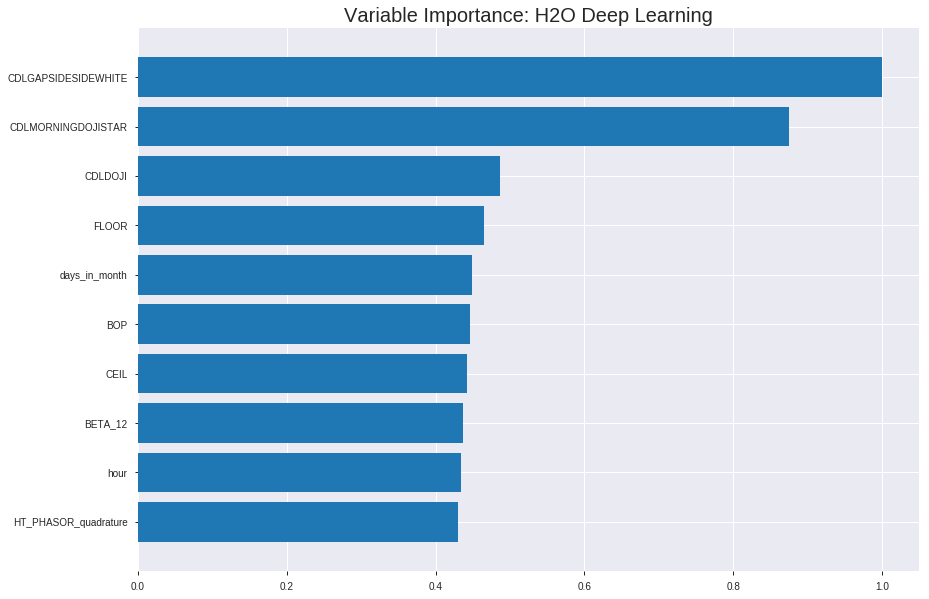

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190725_041641_model_4


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.1960035781425332
RMSE: 0.44272291350520043
LogLoss: 0.6263693910522947
Mean Per-Class Error: 0.2542784597544884
AUC: 0.8130930008054243
pr_auc: 0.8301569742699697
Gini: 0.6261860016108487
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.13382523427218432: 


,0,1,Error,Rate
0,306.0,256.0,0.4555,(256.0/562.0)
1,80.0,543.0,0.1284,(80.0/623.0)
Total,386.0,799.0,0.2835,(336.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1338252,0.7637131,317.0
max f2,0.0093150,0.8521476,392.0
max f0point5,0.5363666,0.7746479,176.0
max accuracy,0.4002766,0.7426160,222.0
max precision,0.9990374,1.0,0.0
max recall,0.0001554,1.0,399.0
max specificity,0.9990374,1.0,0.0
max absolute_mcc,0.4002766,0.4930383,222.0
max min_per_class_accuracy,0.3139663,0.7367576,249.0
max mean_per_class_accuracy,0.4002766,0.7457215,222.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 39.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.9912884,1.7435795,1.7435795,0.9166667,0.9950216,0.9166667,0.9950216,0.0176565,0.0176565,74.3579454,74.3579454
,2,0.0202532,0.9819532,1.9020867,1.8228331,1.0,0.9869960,0.9583333,0.9910088,0.0192616,0.0369181,90.2086677,82.2833066
,3,0.0303797,0.9727596,1.9020867,1.8492509,1.0,0.9781364,0.9722222,0.9867180,0.0192616,0.0561798,90.2086677,84.9250936
,4,0.0405063,0.9635216,1.7435795,1.8228331,0.9166667,0.9693849,0.9583333,0.9823847,0.0176565,0.0738363,74.3579454,82.2833066
,5,0.0506329,0.9519469,1.9020867,1.8386838,1.0,0.9571532,0.9666667,0.9773384,0.0192616,0.0930979,90.2086677,83.8683788
,6,0.1004219,0.8977591,1.8376092,1.8381510,0.9661017,0.9298419,0.9663866,0.9537897,0.0914928,0.1845907,83.7609163,83.8150991
,7,0.1502110,0.8486456,1.7086541,1.7952279,0.8983051,0.8719081,0.9438202,0.9266492,0.0850722,0.2696629,70.8654134,79.5227875
,8,0.2,0.7760176,1.5152216,1.7255217,0.7966102,0.8126310,0.9071730,0.8982649,0.0754414,0.3451043,51.5221590,72.5521669
,9,0.3004219,0.6144925,1.5024886,1.6509685,0.7899160,0.6995554,0.8679775,0.8318424,0.1508828,0.4959872,50.2488636,65.0968492
,10,0.4,0.4719283,1.2895503,1.5609952,0.6779661,0.5495761,0.8206751,0.7615735,0.1284109,0.6243981,28.9550290,56.0995185




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.3299033697450125
RMSE: 0.574372152654542
LogLoss: 1.0325173726992514
Mean Per-Class Error: 0.44712074735080876
AUC: 0.5536112660345789
pr_auc: 0.5259043213283573
Gini: 0.10722253206915777
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.01773825488603551: 


,0,1,Error,Rate
0,6.0,170.0,0.9659,(170.0/176.0)
1,2.0,161.0,0.0123,(2.0/163.0)
Total,8.0,331.0,0.5074,(172.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0177383,0.6518219,330.0
max f2,0.0068489,0.8232323,337.0
max f0point5,0.4339655,0.5471125,205.0
max accuracy,0.8751433,0.5545723,67.0
max precision,0.9954274,1.0,0.0
max recall,0.0068489,1.0,337.0
max specificity,0.9954274,1.0,0.0
max absolute_mcc,0.4339655,0.1082196,205.0
max min_per_class_accuracy,0.5336938,0.5454545,168.0
max mean_per_class_accuracy,0.4339655,0.5528793,205.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 51.34 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.9907479,1.0398773,1.0398773,0.5,0.9933543,0.5,0.9933543,0.0122699,0.0122699,3.9877301,3.9877301
,2,0.0206490,0.9850786,2.0797546,1.4855390,1.0,0.9875038,0.7142857,0.9908470,0.0184049,0.0306748,107.9754601,48.5539001
,3,0.0324484,0.9753514,1.0398773,1.3234802,0.5,0.9814380,0.6363636,0.9874255,0.0122699,0.0429448,3.9877301,32.3480201
,4,0.0412979,0.9706327,0.6932515,1.1884312,0.3333333,0.9728159,0.5714286,0.9842949,0.0061350,0.0490798,-30.6748466,18.8431201
,5,0.0501475,0.9674182,1.3865031,1.2233851,0.6666667,0.9694997,0.5882353,0.9816840,0.0122699,0.0613497,38.6503067,22.3385060
,6,0.1002950,0.9445983,1.1010466,1.1622158,0.5294118,0.9586748,0.5588235,0.9701794,0.0552147,0.1165644,10.1046554,16.2215807
,7,0.1504425,0.9168835,0.9787080,1.1010466,0.4705882,0.9313126,0.5294118,0.9572238,0.0490798,0.1656442,-2.1291952,10.1046554
,8,0.2005900,0.8751157,1.5904006,1.2233851,0.7647059,0.8955936,0.5882353,0.9418162,0.0797546,0.2453988,59.0400577,22.3385060
,9,0.3008850,0.7729008,0.9175388,1.1214363,0.4411765,0.8257008,0.5392157,0.9031111,0.0920245,0.3374233,-8.2461205,12.1436305
,10,0.4011799,0.6633868,0.9787080,1.0857542,0.4705882,0.7112530,0.5220588,0.8551466,0.0981595,0.4355828,-2.1291952,8.5754240



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 04:18:20,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-07-25 04:18:28,8.538 sec,369 obs/sec,2.4379747,1,2889.0,0.6817628,2.5488577,-0.8641418,0.5450024,0.5682525,1.4265650,0.4742616,0.6578253,2.7889530,-0.7334859,0.5250976,0.5259551,2.0797546,0.4985251
,2019-07-25 04:18:35,15.105 sec,419 obs/sec,4.8734177,2,5775.0,0.5815633,1.2307740,-0.3564580,0.5848237,0.5775866,1.5850722,0.4582278,0.6272715,1.4934084,-0.5761962,0.4721138,0.4458738,1.0398773,0.4719764
,2019-07-25 04:18:45,25.869 sec,484 obs/sec,9.7814346,4,11591.0,0.5366585,0.9341445,-0.1550702,0.6409635,0.6514208,1.4265650,0.4202532,0.5942056,1.1205952,-0.4144014,0.4988846,0.4618307,0.5199387,0.4955752
,2019-07-25 04:18:54,34.858 sec,538 obs/sec,14.6860759,6,17403.0,0.5447998,0.9914463,-0.1903818,0.7104942,0.7193498,1.7435795,0.3476793,0.5927513,1.1086974,-0.4074863,0.5304308,0.5159359,1.0398773,0.5103245
,2019-07-25 04:19:02,42.851 sec,585 obs/sec,19.5881857,8,23212.0,0.4942370,0.7500719,0.0203231,0.7793037,0.7840769,1.9020867,0.3088608,0.6508639,1.5174548,-0.6969908,0.5227621,0.5121445,1.0398773,0.5162242
,2019-07-25 04:19:10,50.158 sec,624 obs/sec,24.4978903,10,29030.0,0.4427229,0.6263694,0.2139026,0.8130930,0.8301570,1.7435795,0.2835443,0.5743722,1.0325174,-0.3215569,0.5536113,0.5259043,1.0398773,0.5073746
,2019-07-25 04:19:16,56.721 sec,663 obs/sec,29.4135021,12,34855.0,0.3911889,0.4711029,0.3862586,0.8611300,0.8795388,1.9020867,0.2227848,0.5880738,1.0870612,-0.3853603,0.5444785,0.5230779,1.0398773,0.5162242
,2019-07-25 04:19:17,57.239 sec,663 obs/sec,29.4135021,12,34855.0,0.4427229,0.6263694,0.2139026,0.8130930,0.8301570,1.7435795,0.2835443,0.5743722,1.0325174,-0.3215569,0.5536113,0.5259043,1.0398773,0.5073746


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGAPSIDESIDEWHITE,1.0,1.0,0.0472026
CDLMORNINGDOJISTAR,0.8752488,0.8752488,0.0413140
CDLDOJI,0.4860782,0.4860782,0.0229441
FLOOR,0.4652008,0.4652008,0.0219587
days_in_month,0.4486852,0.4486852,0.0211791
---,---,---,---
aroonup_24,0.3775663,0.3775663,0.0178221
MACDFIX_hist_20,0.3769974,0.3769974,0.0177953
aroonup_20,0.3756167,0.3756167,0.0177301
MACDFIX_hist_12,0.3714127,0.3714127,0.0175316



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5705882352941176)

('F1', 0.6422764227642276)

('auc', 0.5491666666666666)

('logloss', 1.1212796847607445)

('mean_per_class_error', 0.4222222222222223)

('rmse', 0.5928246500899436)

('mse', 0.35144106575426404)

deeplearning prediction progress: |███████████████████████████████████████| 100%


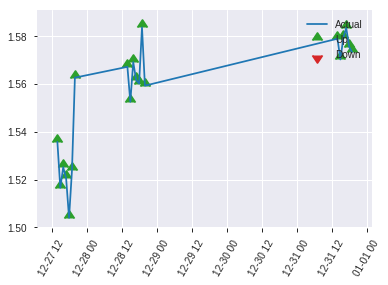


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.35144106575426404
RMSE: 0.5928246500899436
LogLoss: 1.1212796847607445
Mean Per-Class Error: 0.4222222222222223
AUC: 0.5491666666666666
pr_auc: 0.5180021246599715
Gini: 0.09833333333333316
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.062342153837463235: 


,0,1,Error,Rate
0,3.0,87.0,0.9667,(87.0/90.0)
1,1.0,79.0,0.0125,(1.0/80.0)
Total,4.0,166.0,0.5176,(88.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0623422,0.6422764,165.0
max f2,0.0448140,0.8163265,169.0
max f0point5,0.6308496,0.5600000,104.0
max accuracy,0.6308496,0.5705882,104.0
max precision,0.9988637,1.0,0.0
max recall,0.0448140,1.0,169.0
max specificity,0.9988637,1.0,0.0
max absolute_mcc,0.6308496,0.1597719,104.0
max min_per_class_accuracy,0.7752243,0.5,83.0
max mean_per_class_accuracy,0.6308496,0.5777778,104.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 67.66 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.9980361,2.125,2.125,1.0,0.9985838,1.0,0.9985838,0.025,0.025,112.5,112.5
,2,0.0235294,0.9972460,1.0625,1.59375,0.5,0.9976728,0.75,0.9981283,0.0125,0.0375,6.25,59.375
,3,0.0352941,0.9920186,1.0625,1.4166667,0.5,0.9945350,0.6666667,0.9969305,0.0125,0.05,6.25,41.6666667
,4,0.0411765,0.9903860,0.0,1.2142857,0.0,0.9906238,0.5714286,0.9960296,0.0,0.05,-100.0,21.4285714
,5,0.0529412,0.9889913,1.0625,1.1805556,0.5,0.9899564,0.5555556,0.9946800,0.0125,0.0625,6.25,18.0555556
,6,0.1,0.9800180,1.59375,1.375,0.75,0.9834580,0.6470588,0.9893991,0.075,0.1375,59.375,37.5
,7,0.1529412,0.9621679,0.7083333,1.1442308,0.3333333,0.9695571,0.5384615,0.9825307,0.0375,0.175,-29.1666667,14.4230769
,8,0.2,0.9411471,1.0625,1.125,0.5,0.9509777,0.5294118,0.9751065,0.05,0.225,6.25,12.5
,9,0.3,0.9137503,1.125,1.125,0.5294118,0.9306854,0.5294118,0.9602994,0.1125,0.3375,12.5,12.5
,10,0.4,0.8625827,1.0,1.09375,0.4705882,0.8847816,0.5147059,0.9414200,0.1,0.4375,0.0,9.375


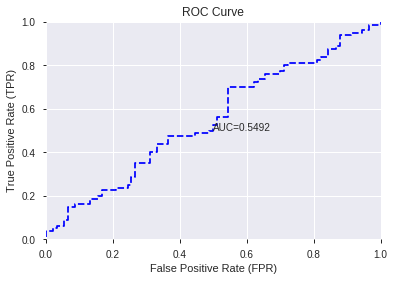

This function is available for GLM models only


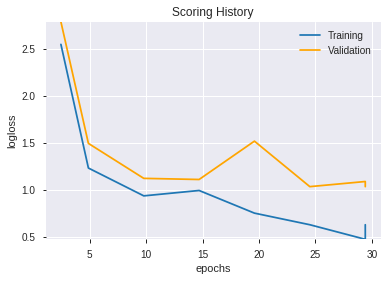

--2019-07-25 04:24:10--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.129.107
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.129.107|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


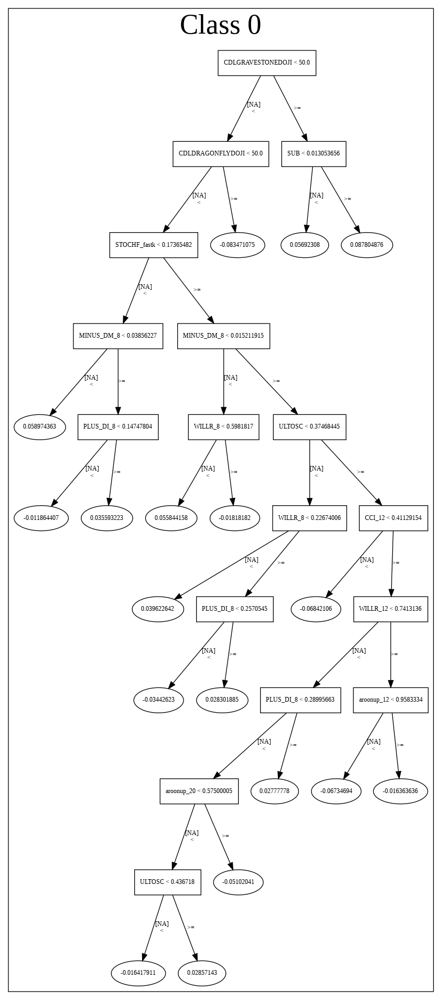

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190725_041641_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190725_041641_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_50_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['CDLGAPSIDESIDEWHITE',
 'CDLMORNINGDOJISTAR',
 'CDLDOJI',
 'FLOOR',
 'days_in_month',
 'BOP',
 'CEIL',
 'BETA_12',
 'hour',
 'HT_PHASOR_quadrature',
 'STOCHRSI_fastk',
 'CORREL_12',
 'HT_TRENDMODE',
 'DX_8',
 'weekday_name',
 'CORREL_8',
 'WILLR_8',
 'ADX_20',
 'AROONOSC_14',
 'STOCHF_fastd',
 'HT_DCPERIOD',
 'BETA_14',
 'dayofweek',
 'BETA_8',
 'quarter',
 'STOCH_slowk',
 'ADXR_14',
 'day',
 'MFI_12',
 'CORREL_30',
 'AROONOSC_12',
 'DX_24',
 'aroondown_20',
 'STOCHRSI_fastd',
 'SAREXT',
 'week',
 'DX_30',
 'CMO_14',
 'aroonup_14',
 'STOCHF_fastk',
 'MACDEXT_hist',
 'AROONOSC_24',
 'AROONOSC_20',
 'aroondown_30',
 'weekday',
 'aroonup_24',
 'MACDFIX_hist_20',
 'aroonup_20',
 'MACDFIX_hist_12',
 'AROONOSC_30']

In [19]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190725_042422_model_1,0.532361,0.698449,0.434028,0.502636,0.252642


,variable,relative_importance,scaled_importance,percentage
0,CDLGAPSIDESIDEWHITE,0.009078,1.000000,0.072251
1,CORREL_12,0.008827,0.972341,0.070252
2,HT_PHASOR_quadrature,0.007366,0.811464,0.058629
3,CDLMORNINGDOJISTAR,0.007019,0.773196,0.055864
4,day,0.006773,0.746096,0.053906
5,BETA_12,0.006248,0.688292,0.049730
6,BETA_14,0.005784,0.637090,0.046030
7,quarter,0.005080,0.559558,0.040428
8,STOCHF_fastd,0.004408,0.485623,0.035087
9,STOCH_slowk,0.004400,0.484673,0.035018


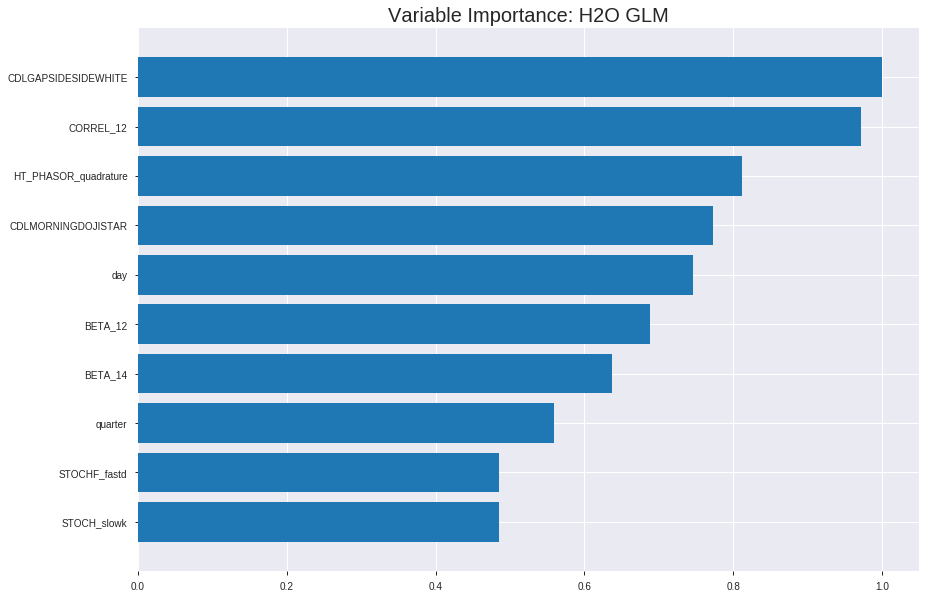

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190725_042422_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24843104595457213
RMSE: 0.4984285765830167
LogLoss: 0.6900026913466478
Null degrees of freedom: 1184
Residual degrees of freedom: 1134
Null deviance: 1639.617345269403
Residual deviance: 1635.3063784915548
AIC: 1737.3063784915548
AUC: 0.5571337175759584
pr_auc: 0.5649085762819608
Gini: 0.11426743515191684
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5047603957349488: 


,0,1,Error,Rate
0,10.0,552.0,0.9822,(552.0/562.0)
1,1.0,622.0,0.0016,(1.0/623.0)
Total,11.0,1174.0,0.4667,(553.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5047604,0.6922649,388.0
max f2,0.5047604,0.8483361,388.0
max f0point5,0.5191182,0.5896951,278.0
max accuracy,0.5232133,0.5603376,227.0
max precision,0.5827794,1.0,0.0
max recall,0.5026012,1.0,394.0
max specificity,0.5827794,1.0,0.0
max absolute_mcc,0.5232133,0.1126595,227.0
max min_per_class_accuracy,0.5257528,0.5498221,195.0
max mean_per_class_accuracy,0.5232133,0.5552058,227.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 52.57 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.5450157,1.4265650,1.4265650,0.75,0.5551143,0.75,0.5551143,0.0144462,0.0144462,42.6565008,42.6565008
,2,0.0202532,0.5426583,0.7925361,1.1095506,0.4166667,0.5436951,0.5833333,0.5494047,0.0080257,0.0224719,-20.7463884,10.9550562
,3,0.0303797,0.5420027,0.7925361,1.0038791,0.4166667,0.5424642,0.5277778,0.5470912,0.0080257,0.0304976,-20.7463884,0.3879080
,4,0.0405063,0.5408501,1.4265650,1.1095506,0.75,0.5412595,0.5833333,0.5456333,0.0144462,0.0449438,42.6565008,10.9550562
,5,0.0506329,0.5396583,0.6340289,1.0144462,0.3333333,0.5402442,0.5333333,0.5445555,0.0064205,0.0513644,-36.5971108,1.4446228
,6,0.1004219,0.5367904,1.0961177,1.0549388,0.5762712,0.5380397,0.5546218,0.5413250,0.0545746,0.1059390,9.6117746,5.4938829
,7,0.1502110,0.5349018,0.9349240,1.0151586,0.4915254,0.5357257,0.5337079,0.5394690,0.0465490,0.1524880,-6.5076040,1.5158620
,8,0.2,0.5334037,1.2250728,1.0674157,0.6440678,0.5341194,0.5611814,0.5381373,0.0609952,0.2134831,22.5072775,6.7415730
,9,0.3004219,0.5307657,1.2147780,1.1166745,0.6386555,0.5321821,0.5870787,0.5361466,0.1219904,0.3354735,21.4778046,11.6674482
,10,0.4,0.5283063,1.0155209,1.0914928,0.5338983,0.5295868,0.5738397,0.5345136,0.1011236,0.4365971,1.5520853,9.1492777




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.252161386902186
RMSE: 0.5021567353946236
LogLoss: 0.6974805889714535
Null degrees of freedom: 338
Residual degrees of freedom: 288
Null deviance: 472.19286403265005
Residual deviance: 472.8918393226454
AIC: 574.8918393226454
AUC: 0.5097950362520914
pr_auc: 0.4749818362871784
Gini: 0.019590072504182876
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5191963911566297: 


,0,1,Error,Rate
0,8.0,168.0,0.9545,(168.0/176.0)
1,2.0,161.0,0.0123,(2.0/163.0)
Total,10.0,329.0,0.5015,(170.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5191964,0.6544715,328.0
max f2,0.5087952,0.8240647,336.0
max f0point5,0.5283197,0.5546002,249.0
max accuracy,0.5299109,0.5427729,231.0
max precision,0.5488551,0.6666667,2.0
max recall,0.5087952,1.0,336.0
max specificity,0.5497447,0.9943182,0.0
max absolute_mcc,0.5283197,0.1179904,249.0
max min_per_class_accuracy,0.5342677,0.4723926,168.0
max mean_per_class_accuracy,0.5283197,0.5519555,249.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 53.35 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.5488138,1.0398773,1.0398773,0.5,0.5492142,0.5,0.5492142,0.0122699,0.0122699,3.9877301,3.9877301
,2,0.0206490,0.5473917,0.6932515,0.8913234,0.3333333,0.5484436,0.4285714,0.5488839,0.0061350,0.0184049,-30.6748466,-10.8676599
,3,0.0324484,0.5463851,0.5199387,0.7562744,0.25,0.5469049,0.3636364,0.5481643,0.0061350,0.0245399,-48.0061350,-24.3725600
,4,0.0412979,0.5459060,1.3865031,0.8913234,0.6666667,0.5461893,0.4285714,0.5477411,0.0122699,0.0368098,38.6503067,-10.8676599
,5,0.0501475,0.5453196,1.3865031,0.9787080,0.6666667,0.5457868,0.4705882,0.5473962,0.0122699,0.0490798,38.6503067,-2.1291952
,6,0.1002950,0.5429676,1.1010466,1.0398773,0.5294118,0.5442764,0.5,0.5458363,0.0552147,0.1042945,10.1046554,3.9877301
,7,0.1504425,0.5417722,0.6116925,0.8971490,0.2941176,0.5423844,0.4313725,0.5446857,0.0306748,0.1349693,-38.8307470,-10.2850956
,8,0.2005900,0.5404904,0.9787080,0.9175388,0.4705882,0.5410540,0.4411765,0.5437778,0.0490798,0.1840491,-2.1291952,-8.2461205
,9,0.3008850,0.5380940,1.0398773,0.9583183,0.5,0.5390393,0.4607843,0.5421983,0.1042945,0.2883436,3.9877301,-4.1681703
,10,0.4011799,0.5360312,0.7952003,0.9175388,0.3823529,0.5370185,0.4411765,0.5409033,0.0797546,0.3680982,-20.4799711,-8.2461205



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-07-25 04:24:23,0.000 sec,2,.27E1,51,1.3800054,1.3949612
,2019-07-25 04:24:23,0.008 sec,4,.17E1,51,1.3784418,1.3962046
,2019-07-25 04:24:23,0.016 sec,6,.11E1,51,1.3764254,1.3982660
,2019-07-25 04:24:23,0.027 sec,8,.66E0,51,1.3739585,1.4015433
,2019-07-25 04:24:23,0.034 sec,10,.41E0,51,1.3711200,1.4063710


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5705882352941176)

('F1', 0.6484018264840182)

('auc', 0.5323611111111112)

('logloss', 0.6984487201555327)

('mean_per_class_error', 0.4256944444444445)

('rmse', 0.5026355489276381)

('mse', 0.252642495045788)

glm prediction progress: |████████████████████████████████████████████████| 100%


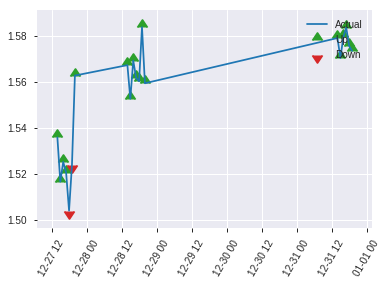


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.252642495045788
RMSE: 0.5026355489276381
LogLoss: 0.6984487201555327
Null degrees of freedom: 169
Residual degrees of freedom: 119
Null deviance: 237.15156222668182
Residual deviance: 237.47256485288113
AIC: 339.47256485288113
AUC: 0.5323611111111112
pr_auc: 0.4643851707602533
Gini: 0.06472222222222235
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5211943971875052: 


,0,1,Error,Rate
0,22.0,68.0,0.7556,(68.0/90.0)
1,9.0,71.0,0.1125,(9.0/80.0)
Total,31.0,139.0,0.4529,(77.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5211944,0.6484018,138.0
max f2,0.5111337,0.8163265,169.0
max f0point5,0.5211944,0.5581761,138.0
max accuracy,0.5284345,0.5705882,92.0
max precision,0.5284345,0.5376344,92.0
max recall,0.5111337,1.0,169.0
max specificity,0.5772749,0.9888889,0.0
max absolute_mcc,0.5211944,0.1705568,138.0
max min_per_class_accuracy,0.5298049,0.5375,82.0
max mean_per_class_accuracy,0.5281986,0.5743056,94.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 52.98 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.5484475,0.0,0.0,0.0,0.5629884,0.0,0.5629884,0.0,0.0,-100.0,-100.0
,2,0.0235294,0.5460398,1.0625,0.53125,0.5,0.5475565,0.25,0.5552724,0.0125,0.0125,6.25,-46.875
,3,0.0352941,0.5447791,1.0625,0.7083333,0.5,0.5448103,0.3333333,0.5517850,0.0125,0.025,6.25,-29.1666667
,4,0.0411765,0.5443565,2.125,0.9107143,1.0,0.5446619,0.4285714,0.5507674,0.0125,0.0375,112.5,-8.9285714
,5,0.0529412,0.5436449,0.0,0.7083333,0.0,0.5439626,0.3333333,0.5492553,0.0,0.0375,-100.0,-29.1666667
,6,0.1,0.5402396,0.796875,0.7500000,0.375,0.5425948,0.3529412,0.5461209,0.0375,0.075,-20.3125,-25.0000000
,7,0.1529412,0.5384756,0.7083333,0.7355769,0.3333333,0.5394880,0.3461538,0.5438249,0.0375,0.1125,-29.1666667,-26.4423077
,8,0.2,0.5374178,0.796875,0.7500000,0.375,0.5379740,0.3529412,0.5424482,0.0375,0.15,-20.3125,-25.0000000
,9,0.3,0.5338514,1.5000000,1.0,0.7058824,0.5355024,0.4705882,0.5401329,0.15,0.3,50.0000000,0.0
,10,0.4,0.5319426,1.375,1.09375,0.6470588,0.5328846,0.5147059,0.5383208,0.1375,0.4375,37.5,9.375


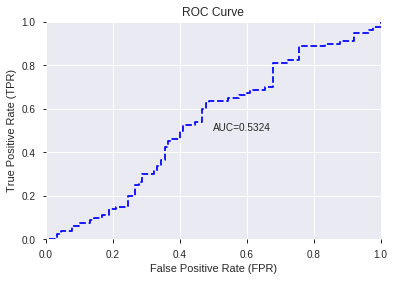

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


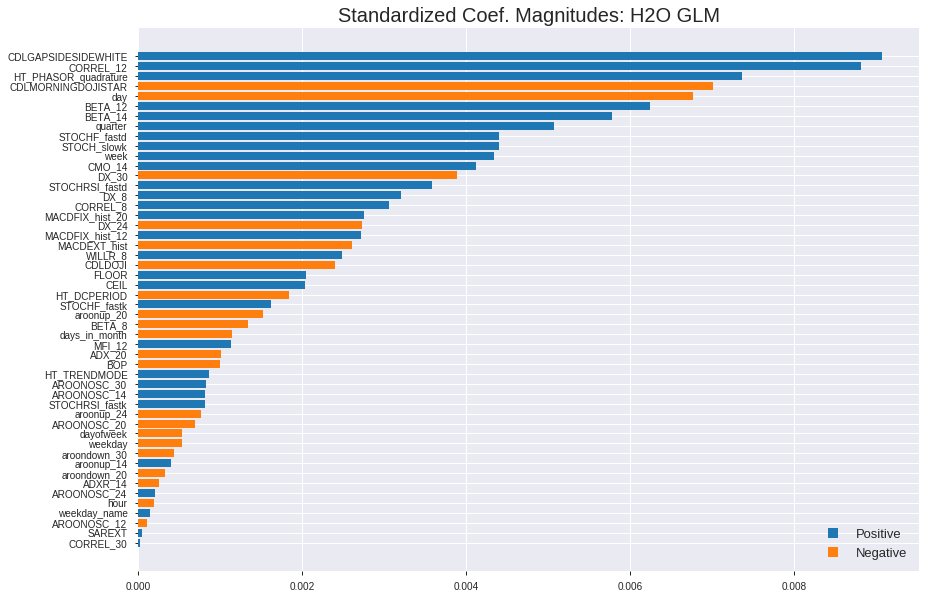

'log_likelihood'
--2019-07-25 04:24:30--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.0.19
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.0.19|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


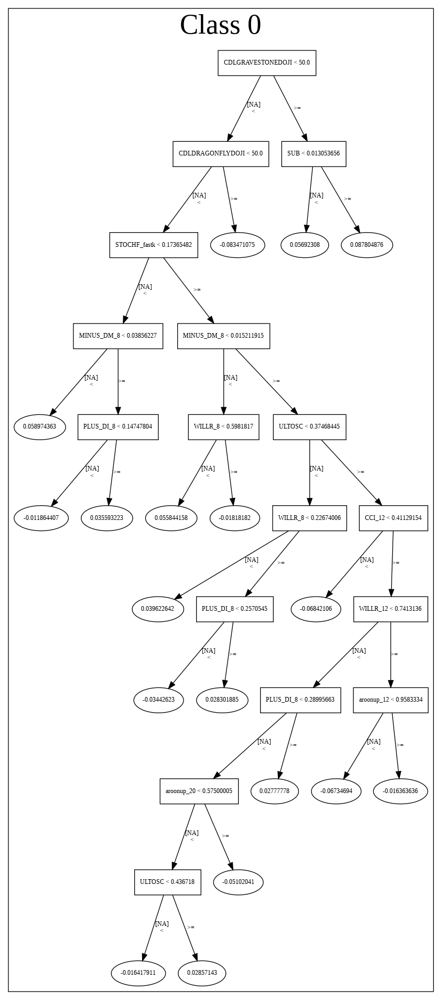

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190725_042422_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190725_042422_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_58_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_58_s

['CDLGAPSIDESIDEWHITE',
 'CORREL_12',
 'HT_PHASOR_quadrature',
 'CDLMORNINGDOJISTAR',
 'day',
 'BETA_12',
 'BETA_14',
 'quarter',
 'STOCHF_fastd',
 'STOCH_slowk',
 'week',
 'CMO_14',
 'DX_30',
 'STOCHRSI_fastd',
 'DX_8',
 'CORREL_8',
 'MACDFIX_hist_20',
 'DX_24',
 'MACDFIX_hist_12',
 'MACDEXT_hist',
 'WILLR_8',
 'CDLDOJI',
 'FLOOR',
 'CEIL',
 'HT_DCPERIOD',
 'STOCHF_fastk',
 'aroonup_20',
 'BETA_8',
 'days_in_month',
 'MFI_12',
 'ADX_20',
 'BOP',
 'HT_TRENDMODE',
 'AROONOSC_30',
 'AROONOSC_14',
 'STOCHRSI_fastk',
 'aroonup_24',
 'AROONOSC_20',
 'dayofweek',
 'weekday',
 'aroondown_30',
 'aroonup_14',
 'aroondown_20',
 'ADXR_14',
 'AROONOSC_24',
 'hour',
 'weekday_name',
 'AROONOSC_12',
 'SAREXT',
 'CORREL_30']

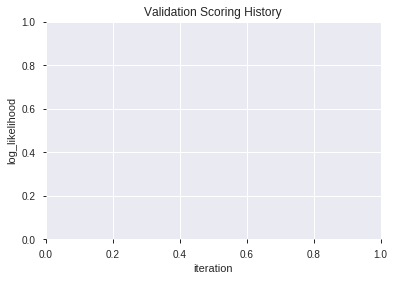

In [20]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190725_042440_model_3,0.524583,0.712991,0.484028,0.509458,0.259547
1,XGBoost_3_AutoML_20190725_042440,0.518889,0.706288,0.488889,0.506403,0.256444
2,XGBoost_grid_1_AutoML_20190725_042440_model_1,0.509028,0.711220,0.488889,0.508555,0.258628
3,XGBoost_grid_1_AutoML_20190725_042440_model_4,0.504097,0.706688,0.477778,0.506587,0.256630
4,XGBoost_2_AutoML_20190725_042440,0.499306,0.711040,0.488889,0.508588,0.258662
5,XGBoost_1_AutoML_20190725_042440,0.495556,0.721407,0.489583,0.513200,0.263375
6,XGBoost_grid_1_AutoML_20190725_042440_model_7,0.494583,0.734088,0.483333,0.518889,0.269246
7,XGBoost_grid_1_AutoML_20190725_042440_model_5,0.492639,0.750570,0.488889,0.525072,0.275701
8,XGBoost_grid_1_AutoML_20190725_042440_model_2,0.489583,0.710529,0.484028,0.508428,0.258499
9,XGBoost_grid_1_AutoML_20190725_042440_model_6,0.456111,0.722895,0.494444,0.514278,0.264482


,variable,relative_importance,scaled_importance,percentage
0,CORREL_12,209.958252,1.000000,0.051147
1,HT_PHASOR_quadrature,208.840393,0.994676,0.050875
2,DX_8,195.694504,0.932064,0.047673
3,STOCHF_fastk,187.529694,0.893176,0.045684
4,BOP,173.916183,0.828337,0.042367
5,BETA_8,166.673035,0.793839,0.040603
6,WILLR_8,166.491333,0.792974,0.040558
7,CORREL_8,138.891342,0.661519,0.033835
8,STOCHRSI_fastd,134.031708,0.638373,0.032651
9,BETA_12,132.553101,0.631331,0.032291


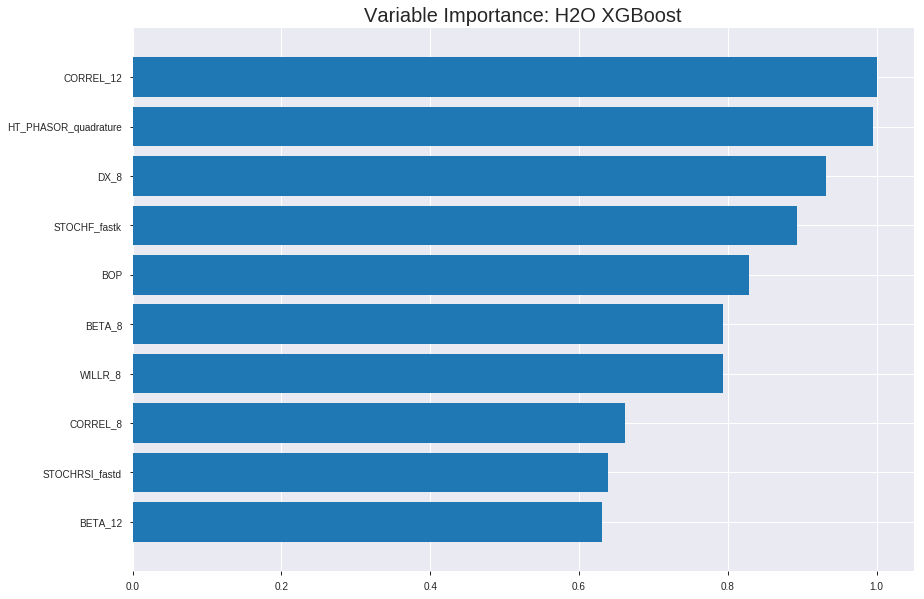

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190725_042440_model_3


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.17808339434348727
RMSE: 0.4219992823968866
LogLoss: 0.5451034839523871
Mean Per-Class Error: 0.12674437202607058
AUC: 0.9461451020489766
pr_auc: 0.9530666668738568
Gini: 0.8922902040979532
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5042225122451782: 


,0,1,Error,Rate
0,469.0,93.0,0.1655,(93.0/562.0)
1,58.0,565.0,0.0931,(58.0/623.0)
Total,527.0,658.0,0.1274,(151.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5042225,0.8821233,218.0
max f2,0.4748561,0.9155364,246.0
max f0point5,0.5592944,0.8967503,161.0
max accuracy,0.5148576,0.8734177,206.0
max precision,0.7699384,1.0,0.0
max recall,0.3957510,1.0,322.0
max specificity,0.7699384,1.0,0.0
max absolute_mcc,0.5148576,0.7462683,206.0
max min_per_class_accuracy,0.5160836,0.8718861,205.0
max mean_per_class_accuracy,0.5148576,0.8732556,206.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 51.99 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.7465862,1.9020867,1.9020867,1.0,0.7562309,1.0,0.7562309,0.0192616,0.0192616,90.2086677,90.2086677
,2,0.0202532,0.7253925,1.9020867,1.9020867,1.0,0.7341689,1.0,0.7451999,0.0192616,0.0385233,90.2086677,90.2086677
,3,0.0303797,0.7145656,1.9020867,1.9020867,1.0,0.7205249,1.0,0.7369749,0.0192616,0.0577849,90.2086677,90.2086677
,4,0.0405063,0.7024897,1.9020867,1.9020867,1.0,0.7087243,1.0,0.7299123,0.0192616,0.0770465,90.2086677,90.2086677
,5,0.0506329,0.6942836,1.9020867,1.9020867,1.0,0.6984129,1.0,0.7236124,0.0192616,0.0963082,90.2086677,90.2086677
,6,0.1004219,0.6649051,1.9020867,1.9020867,1.0,0.6796550,1.0,0.7018184,0.0947030,0.1910112,90.2086677,90.2086677
,7,0.1502110,0.6446381,1.9020867,1.9020867,1.0,0.6541731,1.0,0.6860259,0.0947030,0.2857143,90.2086677,90.2086677
,8,0.2,0.6270559,1.8376092,1.8860353,0.9661017,0.6369371,0.9915612,0.6738055,0.0914928,0.3772071,83.7609163,88.6035313
,9,0.3004219,0.5886028,1.8701188,1.8807149,0.9831933,0.6084677,0.9887640,0.6519650,0.1878010,0.5650080,87.0118834,88.0714917
,10,0.4,0.5532636,1.5474603,1.7977528,0.8135593,0.5704751,0.9451477,0.6316785,0.1540931,0.7191011,54.7460348,79.7752809




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.2584459227917909
RMSE: 0.5083757692807466
LogLoss: 0.7109178901514168
Mean Per-Class Error: 0.440271193530396
AUC: 0.5211238148354712
pr_auc: 0.5105803630829339
Gini: 0.04224762967094242
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.32913368940353394: 


,0,1,Error,Rate
0,0.0,176.0,1.0,(176.0/176.0)
1,0.0,163.0,0.0,(0.0/163.0)
Total,0.0,339.0,0.5192,(176.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3291337,0.6494024,338.0
max f2,0.3291337,0.8224016,338.0
max f0point5,0.3291337,0.5365372,338.0
max accuracy,0.5793954,0.5663717,109.0
max precision,0.6310081,0.625,47.0
max recall,0.3291337,1.0,338.0
max specificity,0.7787239,0.9943182,0.0
max absolute_mcc,0.5793954,0.1274823,109.0
max min_per_class_accuracy,0.5414056,0.5337423,168.0
max mean_per_class_accuracy,0.5793954,0.5597288,109.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 54.32 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.7395927,0.5199387,0.5199387,0.25,0.7577516,0.25,0.7577516,0.0061350,0.0061350,-48.0061350,-48.0061350
,2,0.0206490,0.7102533,1.3865031,0.8913234,0.6666667,0.7195975,0.4285714,0.7413999,0.0122699,0.0184049,38.6503067,-10.8676599
,3,0.0324484,0.6893185,1.5598160,1.1344116,0.75,0.7008887,0.5454545,0.7266685,0.0184049,0.0368098,55.9815951,13.4411601
,4,0.0412979,0.6784242,0.6932515,1.0398773,0.3333333,0.6818395,0.5,0.7170623,0.0061350,0.0429448,-30.6748466,3.9877301
,5,0.0501475,0.6735730,1.3865031,1.1010466,0.6666667,0.6765057,0.5294118,0.7099053,0.0122699,0.0552147,38.6503067,10.1046554
,6,0.1002950,0.6423507,1.3457236,1.2233851,0.6470588,0.6579856,0.5882353,0.6839454,0.0674847,0.1226994,34.5723565,22.3385060
,7,0.1504425,0.6242045,1.3457236,1.2641646,0.6470588,0.6347508,0.6078431,0.6675472,0.0674847,0.1901840,34.5723565,26.4164562
,8,0.2005900,0.6108960,0.7340310,1.1316312,0.3529412,0.6162239,0.5441176,0.6547164,0.0368098,0.2269939,-26.5968964,13.1631180
,9,0.3008850,0.5846030,1.2233851,1.1622158,0.5882353,0.5971296,0.5588235,0.6355208,0.1226994,0.3496933,22.3385060,16.2215807
,10,0.4011799,0.5630639,0.9175388,1.1010466,0.4411765,0.5732434,0.5294118,0.6199515,0.0920245,0.4417178,-8.2461205,10.1046554



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 04:24:44,1.036 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4742616,0.5,0.6931472,0.5,0.0,1.0,0.5191740
,2019-07-25 04:24:44,1.093 sec,5.0,0.4892806,0.6718847,0.7386512,0.7583511,1.9020867,0.3451477,0.5008057,0.6947613,0.4953639,0.4773749,1.5598160,0.5132743
,2019-07-25 04:24:44,1.130 sec,10.0,0.4803575,0.6544391,0.8024997,0.8112832,1.9020867,0.2911392,0.5019285,0.6970388,0.4942659,0.4624815,1.0398773,0.5162242
,2019-07-25 04:24:44,1.178 sec,15.0,0.4700902,0.6346428,0.8609672,0.8726754,1.9020867,0.2210970,0.5020077,0.6972189,0.5025620,0.4711707,0.5199387,0.5103245
,2019-07-25 04:24:44,1.217 sec,20.0,0.4629821,0.6211103,0.8863109,0.8976491,1.9020867,0.2033755,0.5018219,0.6968673,0.5229364,0.5010169,0.5199387,0.5044248
,2019-07-25 04:24:44,1.259 sec,25.0,0.4555525,0.6070069,0.8965530,0.9080181,1.9020867,0.2084388,0.5009143,0.6950093,0.5395984,0.5182324,1.0398773,0.5132743
,2019-07-25 04:24:44,1.301 sec,30.0,0.4488045,0.5943679,0.9077975,0.9172859,1.9020867,0.1772152,0.5026639,0.6986269,0.5345789,0.5181266,1.0398773,0.5162242
,2019-07-25 04:24:45,1.345 sec,35.0,0.4422647,0.5822054,0.9212983,0.9303412,1.9020867,0.1662447,0.5035830,0.7005940,0.5351715,0.5181237,0.5199387,0.5132743
,2019-07-25 04:24:45,1.404 sec,40.0,0.4346966,0.5682379,0.9317317,0.9381495,1.9020867,0.1594937,0.5050478,0.7037154,0.5351018,0.5243000,0.5199387,0.5191740
,2019-07-25 04:24:45,1.461 sec,45.0,0.4277658,0.5556014,0.9405928,0.9482883,1.9020867,0.1392405,0.5076298,0.7092514,0.5215770,0.5132022,0.5199387,0.5191740


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CORREL_12,209.9582520,1.0,0.0511473
HT_PHASOR_quadrature,208.8403931,0.9946758,0.0508750
DX_8,195.6945038,0.9320639,0.0476725
STOCHF_fastk,187.5296936,0.8931761,0.0456835
BOP,173.9161835,0.8283370,0.0423672
---,---,---,---
weekday,17.3797760,0.0827773,0.0042338
HT_TRENDMODE,15.4351053,0.0735151,0.0037601
quarter,10.4994984,0.0500076,0.0025578
CDLDOJI,6.5997610,0.0314337,0.0016077



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5823529411764706)

('F1', 0.6448979591836734)

('auc', 0.5245833333333333)

('logloss', 0.7129911877540349)

('mean_per_class_error', 0.42638888888888893)

('rmse', 0.509457524433088)

('mse', 0.25954696920149045)

xgboost prediction progress: |████████████████████████████████████████████| 100%


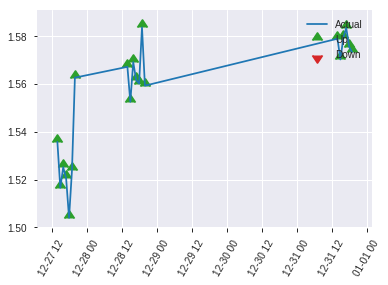


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.25954696920149045
RMSE: 0.509457524433088
LogLoss: 0.7129911877540349
Mean Per-Class Error: 0.42638888888888893
AUC: 0.5245833333333333
pr_auc: 0.5006237160450265
Gini: 0.04916666666666658
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40993863344192505: 


,0,1,Error,Rate
0,4.0,86.0,0.9556,(86.0/90.0)
1,1.0,79.0,0.0125,(1.0/80.0)
Total,5.0,165.0,0.5118,(87.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4099386,0.6448980,164.0
max f2,0.3336742,0.8163265,169.0
max f0point5,0.5831959,0.5379747,58.0
max accuracy,0.5863512,0.5823529,54.0
max precision,0.7882162,1.0,0.0
max recall,0.3336742,1.0,169.0
max specificity,0.7882162,1.0,0.0
max absolute_mcc,0.5831959,0.1543662,58.0
max min_per_class_accuracy,0.5539628,0.525,83.0
max mean_per_class_accuracy,0.5831959,0.5736111,58.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 55.28 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.7533351,1.0625,1.0625,0.5,0.7734905,0.5,0.7734905,0.0125,0.0125,6.25,6.25
,2,0.0235294,0.7311185,1.0625,1.0625,0.5,0.7444339,0.5,0.7589622,0.0125,0.025,6.25,6.25
,3,0.0352941,0.7142322,1.0625,1.0625,0.5,0.7173823,0.5,0.7451022,0.0125,0.0375,6.25,6.25
,4,0.0411765,0.6944077,0.0,0.9107143,0.0,0.7063104,0.4285714,0.7395605,0.0,0.0375,-100.0,-8.9285714
,5,0.0529412,0.6871731,2.125,1.1805556,1.0,0.6889541,0.5555556,0.7283147,0.025,0.0625,112.5,18.0555556
,6,0.1,0.6478996,1.328125,1.25,0.625,0.6646884,0.5882353,0.6983729,0.0625,0.125,32.8125,25.0
,7,0.1529412,0.6353803,0.7083333,1.0625,0.3333333,0.6428636,0.5,0.6791581,0.0375,0.1625,-29.1666667,6.25
,8,0.2,0.6149308,1.328125,1.125,0.625,0.6215983,0.5294118,0.6656147,0.0625,0.225,32.8125,12.5
,9,0.3,0.5890853,1.375,1.2083333,0.6470588,0.6012127,0.5686275,0.6441473,0.1375,0.3625,37.5,20.8333333
,10,0.4,0.5758800,0.875,1.125,0.4117647,0.5829129,0.5294118,0.6288387,0.0875,0.45,-12.5,12.5


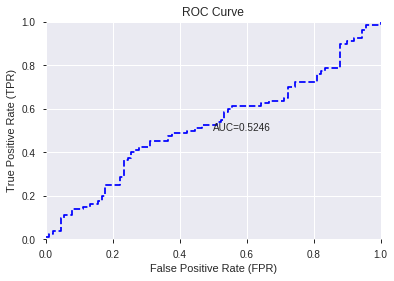

This function is available for GLM models only


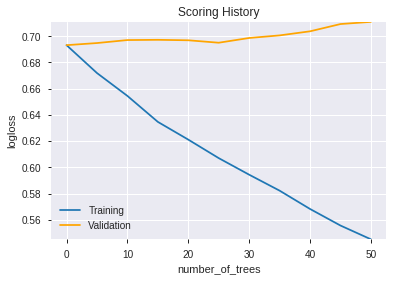

--2019-07-25 04:24:53--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.38.228
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.38.228|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.

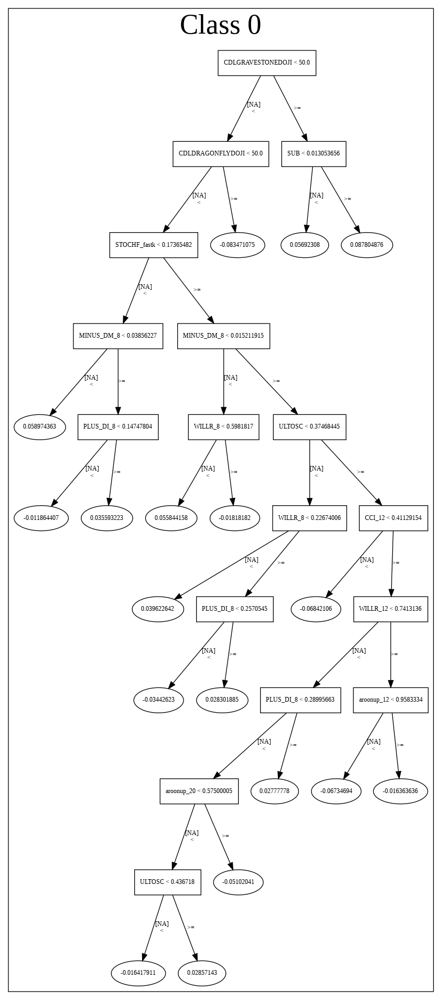

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190725_042440_model_3',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190725_042440_model_3',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_66_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['CORREL_12',
 'HT_PHASOR_quadrature',
 'DX_8',
 'STOCHF_fastk',
 'BOP',
 'BETA_8',
 'WILLR_8',
 'CORREL_8',
 'STOCHRSI_fastd',
 'BETA_12',
 'ADXR_14',
 'HT_DCPERIOD',
 'MACDFIX_hist_20',
 'MACDEXT_hist',
 'MACDFIX_hist_12',
 'STOCH_slowk',
 'day',
 'MFI_12',
 'BETA_14',
 'DX_24',
 'ADX_20',
 'STOCHRSI_fastk',
 'SAREXT',
 'CORREL_30',
 'week',
 'DX_30',
 'aroondown_30',
 'AROONOSC_30',
 'CMO_14',
 'aroonup_14',
 'aroondown_20',
 'AROONOSC_12',
 'AROONOSC_24',
 'AROONOSC_20',
 'hour',
 'dayofweek',
 'aroonup_20',
 'weekday_name',
 'STOCHF_fastd',
 'AROONOSC_14',
 'days_in_month',
 'aroonup_24',
 'weekday',
 'HT_TRENDMODE',
 'quarter',
 'CDLDOJI',
 'CEIL']

In [21]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del xgb_features,glm_features,dl_features
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [23]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [24]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [25]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [27]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [28]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [29]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [31]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [32]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [33]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [35]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [36]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [37]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [39]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [40]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [41]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [43]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [44]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [45]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [46]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:114: UserWarning: Features [ 12  13 914 917 926 932] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:721: RuntimeWarning: invalid value encountered in less
  return (self.pvalues_ < self.alpha / len(self.pvalues_))


0

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190725_042504_model_4,0.541111,1.064820,0.488889,0.590813,0.349060
1,DeepLearning_grid_1_AutoML_20190725_042504_model_5,0.521250,0.695437,0.500000,0.501143,0.251145
2,DeepLearning_grid_1_AutoML_20190725_042504_model_7,0.518472,0.767829,0.488889,0.529507,0.280378
3,DeepLearning_grid_1_AutoML_20190725_042504_model_9,0.495903,0.691566,0.500000,0.499209,0.249210
4,DeepLearning_grid_1_AutoML_20190725_042504_model_2,0.487361,0.849800,0.488889,0.561486,0.315266
5,DeepLearning_grid_1_AutoML_20190725_042504_model_8,0.481528,0.718505,0.500000,0.511501,0.261633
6,DeepLearning_grid_1_AutoML_20190725_042504_model_6,0.477917,0.692199,0.500000,0.499526,0.249526
7,DeepLearning_grid_1_AutoML_20190725_042504_model_1,0.467222,7.552674,0.463194,0.720895,0.519689
8,DeepLearning_grid_1_AutoML_20190725_042504_model_3,0.466389,1.670028,0.488889,0.666146,0.443751
9,DeepLearning_1_AutoML_20190725_042504,0.407639,2.549183,0.488889,0.689313,0.475152


,variable,relative_importance,scaled_importance,percentage
0,CDLEVENINGDOJISTAR,1.000000,1.000000,0.002608
1,CDLTASUKIGAP,0.985002,0.985002,0.002569
2,CDL3WHITESOLDIERS,0.963674,0.963674,0.002514
3,CDLHOMINGPIGEON,0.953781,0.953781,0.002488
4,CDLPIERCING,0.952474,0.952474,0.002484
5,CDLSTALLEDPATTERN,0.943328,0.943328,0.002461
6,CDLGAPSIDESIDEWHITE,0.941042,0.941042,0.002455
7,CDLMORNINGDOJISTAR,0.885087,0.885087,0.002309
8,CDLTHRUSTING,0.851781,0.851781,0.002222
9,CDL3LINESTRIKE,0.845163,0.845163,0.002205


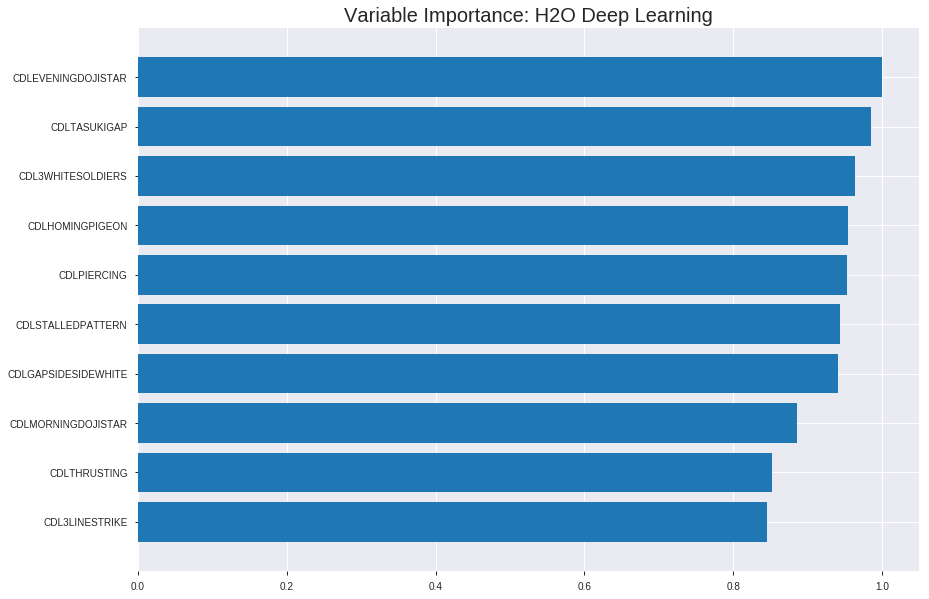

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190725_042504_model_4


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.15523471408254272
RMSE: 0.3939983681216747
LogLoss: 0.5107067153879855
Mean Per-Class Error: 0.19836001896460131
AUC: 0.8816126194569955
pr_auc: 0.8813214709308068
Gini: 0.7632252389139911
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2856716213213071: 


,0,1,Error,Rate
0,434.0,128.0,0.2278,(128.0/562.0)
1,110.0,513.0,0.1766,(110.0/623.0)
Total,544.0,641.0,0.2008,(238.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2856716,0.8117089,265.0
max f2,0.0100043,0.8796692,386.0
max f0point5,0.5686779,0.8531317,165.0
max accuracy,0.3135050,0.8016878,254.0
max precision,0.9993533,1.0,0.0
max recall,0.0012780,1.0,397.0
max specificity,0.9993533,1.0,0.0
max absolute_mcc,0.5603384,0.6099743,168.0
max min_per_class_accuracy,0.3149007,0.8007117,253.0
max mean_per_class_accuracy,0.3135050,0.8016400,254.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 41.32 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.9990596,1.9020867,1.9020867,1.0,0.9994144,1.0,0.9994144,0.0192616,0.0192616,90.2086677,90.2086677
,2,0.0202532,0.9978064,1.9020867,1.9020867,1.0,0.9984286,1.0,0.9989215,0.0192616,0.0385233,90.2086677,90.2086677
,3,0.0303797,0.9960099,1.9020867,1.9020867,1.0,0.9971968,1.0,0.9983466,0.0192616,0.0577849,90.2086677,90.2086677
,4,0.0405063,0.9927937,1.9020867,1.9020867,1.0,0.9940833,1.0,0.9972808,0.0192616,0.0770465,90.2086677,90.2086677
,5,0.0506329,0.9891625,1.9020867,1.9020867,1.0,0.9910337,1.0,0.9960314,0.0192616,0.0963082,90.2086677,90.2086677
,6,0.1004219,0.9627840,1.9020867,1.9020867,1.0,0.9765037,1.0,0.9863496,0.0947030,0.1910112,90.2086677,90.2086677
,7,0.1502110,0.9226830,1.8376092,1.8807149,0.9661017,0.9429549,0.9887640,0.9719660,0.0914928,0.2825040,83.7609163,88.0714917
,8,0.2,0.8533919,1.7731316,1.8539326,0.9322034,0.8888815,0.9746835,0.9512825,0.0882825,0.3707865,77.3131648,85.3932584
,9,0.3004219,0.6893318,1.7102796,1.8059138,0.8991597,0.7710260,0.9494382,0.8910282,0.1717496,0.5425361,71.0279617,80.5913755
,10,0.4,0.4940882,1.2895503,1.6773676,0.6779661,0.5870046,0.8818565,0.8153430,0.1284109,0.6709470,28.9550290,67.7367576




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.2916486175535067
RMSE: 0.5400450143770487
LogLoss: 0.8341364885665918
Mean Per-Class Error: 0.4450815672058004
AUC: 0.5504740658114892
pr_auc: 0.5196615939021395
Gini: 0.10094813162297833
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.009228208907013433: 


,0,1,Error,Rate
0,0.0,176.0,1.0,(176.0/176.0)
1,0.0,163.0,0.0,(0.0/163.0)
Total,0.0,339.0,0.5192,(176.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0092282,0.6494024,338.0
max f2,0.0092282,0.8224016,338.0
max f0point5,0.3026141,0.5524079,223.0
max accuracy,0.4923388,0.5516224,138.0
max precision,0.9600528,1.0,0.0
max recall,0.0092282,1.0,338.0
max specificity,0.9600528,1.0,0.0
max absolute_mcc,0.3026141,0.1159112,223.0
max min_per_class_accuracy,0.4302296,0.5397727,168.0
max mean_per_class_accuracy,0.3026141,0.5549184,223.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 43.45 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.9319083,1.5598160,1.5598160,0.75,0.9442581,0.75,0.9442581,0.0184049,0.0184049,55.9815951,55.9815951
,2,0.0206490,0.8925093,1.3865031,1.4855390,0.6666667,0.9153599,0.7142857,0.9318732,0.0122699,0.0306748,38.6503067,48.5539001
,3,0.0324484,0.8728046,0.5199387,1.1344116,0.25,0.8791551,0.5454545,0.9127030,0.0061350,0.0368098,-48.0061350,13.4411601
,4,0.0412979,0.8644101,2.0797546,1.3369851,1.0,0.8675748,0.6428571,0.9030326,0.0184049,0.0552147,107.9754601,33.6985101
,5,0.0501475,0.8554771,0.0,1.1010466,0.0,0.8621394,0.5294118,0.8958162,0.0,0.0552147,-100.0,10.1046554
,6,0.1002950,0.7917546,1.3457236,1.2233851,0.6470588,0.8309984,0.5882353,0.8634073,0.0674847,0.1226994,34.5723565,22.3385060
,7,0.1504425,0.7257912,0.6116925,1.0194875,0.2941176,0.7522354,0.4901961,0.8263500,0.0306748,0.1533742,-38.8307470,1.9487550
,8,0.2005900,0.6764867,1.1010466,1.0398773,0.5294118,0.6992404,0.5,0.7945726,0.0552147,0.2085890,10.1046554,3.9877301
,9,0.3008850,0.5858691,1.2233851,1.1010466,0.5882353,0.6281315,0.5294118,0.7390922,0.1226994,0.3312883,22.3385060,10.1046554
,10,0.4011799,0.4981575,1.1010466,1.1010466,0.5294118,0.5432070,0.5294118,0.6901209,0.1104294,0.4417178,10.1046554,10.1046554



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 04:30:19,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-07-25 04:30:25,7.751 sec,144 obs/sec,0.6514768,1,772.0,0.6335828,3.4896267,-0.6099751,0.5319956,0.4179569,1.1095506,0.4590717,0.7205362,13.9510575,-1.0797482,0.5067101,0.0568479,0.0,0.4896755
,2019-07-25 04:30:47,29.906 sec,150 obs/sec,3.2303797,5,3828.0,0.5719641,1.1119362,-0.3120485,0.5981347,0.6217616,1.7435795,0.4717300,0.6614419,1.8895671,-0.7525987,0.5472323,0.5261214,1.5598160,0.5044248
,2019-07-25 04:31:11,54.162 sec,159 obs/sec,6.4033755,10,7588.0,0.6018066,1.3667293,-0.4525338,0.6123281,0.6238334,1.7435795,0.4590717,0.6124155,1.5193528,-0.5024206,0.5639640,0.5412813,2.0797546,0.5191740
,2019-07-25 04:31:36,1 min 18.412 sec,163 obs/sec,9.5991561,15,11375.0,0.5502016,1.2302379,-0.2141043,0.6721652,0.6860504,1.2680578,0.4742616,0.6370930,2.7527447,-0.6259409,0.5497595,0.5243737,1.5598160,0.5162242
,2019-07-25 04:31:58,1 min 40.588 sec,168 obs/sec,12.8033755,20,15172.0,0.5266978,0.9447087,-0.1125905,0.6856532,0.6819397,1.5850722,0.4075949,0.6290450,2.0372955,-0.5851215,0.5573585,0.5223569,2.0797546,0.4837758
,2019-07-25 04:32:19,2 min 1.821 sec,174 obs/sec,16.0059072,25,18967.0,0.4633278,0.6398286,0.1390281,0.7597479,0.7404274,1.9020867,0.3037975,0.6215701,1.4117518,-0.5476733,0.5368098,0.5249812,2.0797546,0.5162242
,2019-07-25 04:32:43,2 min 26.297 sec,179 obs/sec,19.8548523,31,23528.0,0.5084701,0.8828463,-0.0369152,0.7199908,0.7527901,1.9020867,0.3468354,0.6210050,1.5203234,-0.5448607,0.5326617,0.5192415,1.5598160,0.4867257
,2019-07-25 04:33:07,2 min 50.124 sec,183 obs/sec,23.6776371,37,28058.0,0.4774739,0.7571704,0.0856520,0.7958092,0.8048152,1.9020867,0.2751055,0.6092331,1.3504380,-0.4868462,0.5432236,0.5207553,1.0398773,0.5191740
,2019-07-25 04:33:31,3 min 13.332 sec,187 obs/sec,27.5105485,43,32600.0,0.4437591,0.5977284,0.2102188,0.8587366,0.8732949,1.9020867,0.2379747,0.6260374,1.4990770,-0.5700000,0.5381693,0.5215092,1.0398773,0.5191740


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLEVENINGDOJISTAR,1.0,1.0,0.0026084
CDLTASUKIGAP,0.9850015,0.9850015,0.0025693
CDL3WHITESOLDIERS,0.9636738,0.9636738,0.0025136
CDLHOMINGPIGEON,0.9537815,0.9537815,0.0024878
CDLPIERCING,0.9524741,0.9524741,0.0024844
---,---,---,---
KAMA_24,0.3289023,0.3289023,0.0008579
BBANDS_middleband_14_0_2,0.3278608,0.3278608,0.0008552
MA_14_0,0.3255949,0.3255949,0.0008493
MA_24_7,0.3240973,0.3240973,0.0008454



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5705882352941176)

('F1', 0.6451612903225806)

('auc', 0.5411111111111111)

('logloss', 1.064820306954813)

('mean_per_class_error', 0.4312499999999999)

('rmse', 0.5908132551905966)

('mse', 0.34906030250890896)

deeplearning prediction progress: |███████████████████████████████████████| 100%


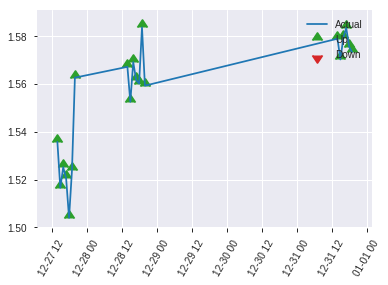


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.34906030250890896
RMSE: 0.5908132551905966
LogLoss: 1.064820306954813
Mean Per-Class Error: 0.4312499999999999
AUC: 0.5411111111111111
pr_auc: 0.4743314736684886
Gini: 0.0822222222222222
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.02364282616078653: 


,0,1,Error,Rate
0,2.0,88.0,0.9778,(88.0/90.0)
1,0.0,80.0,0.0,(0.0/80.0)
Total,2.0,168.0,0.5176,(88.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0236428,0.6451613,167.0
max f2,0.0236428,0.8196721,167.0
max f0point5,0.6881981,0.5545113,112.0
max accuracy,0.7845599,0.5705882,78.0
max precision,0.7845599,0.5443038,78.0
max recall,0.0236428,1.0,167.0
max specificity,0.9992392,0.9888889,0.0
max absolute_mcc,0.6881981,0.1453759,112.0
max min_per_class_accuracy,0.7681209,0.5555556,84.0
max mean_per_class_accuracy,0.6881981,0.5687500,112.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 70.99 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.9832931,1.0625,1.0625,0.5,0.9935008,0.5,0.9935008,0.0125,0.0125,6.25,6.25
,2,0.0235294,0.9760879,0.0,0.53125,0.0,0.9791035,0.25,0.9863022,0.0,0.0125,-100.0,-46.875
,3,0.0352941,0.9682894,1.0625,0.7083333,0.5,0.9715937,0.3333333,0.9813994,0.0125,0.025,6.25,-29.1666667
,4,0.0411765,0.9657721,0.0,0.6071429,0.0,0.9660216,0.2857143,0.9792025,0.0,0.025,-100.0,-39.2857143
,5,0.0529412,0.9635254,1.0625,0.7083333,0.5,0.9650531,0.3333333,0.9760582,0.0125,0.0375,6.25,-29.1666667
,6,0.1,0.9489588,0.796875,0.7500000,0.375,0.9581827,0.3529412,0.9676462,0.0375,0.075,-20.3125,-25.0000000
,7,0.1529412,0.9355729,0.9444444,0.8173077,0.4444444,0.9441580,0.3846154,0.9595157,0.05,0.125,-5.5555556,-18.2692308
,8,0.2,0.9146595,1.59375,1.0,0.75,0.9236277,0.4705882,0.9510715,0.075,0.2,59.375,0.0
,9,0.3,0.8811874,1.375,1.125,0.6470588,0.8982735,0.5294118,0.9334721,0.1375,0.3375,37.5,12.5
,10,0.4,0.8256623,1.0,1.09375,0.4705882,0.8514225,0.5147059,0.9129597,0.1,0.4375,0.0,9.375


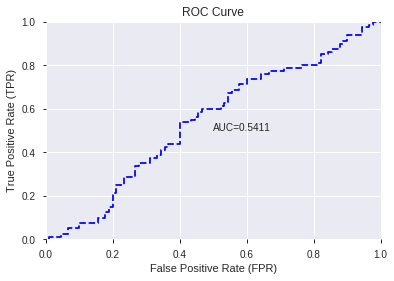

This function is available for GLM models only


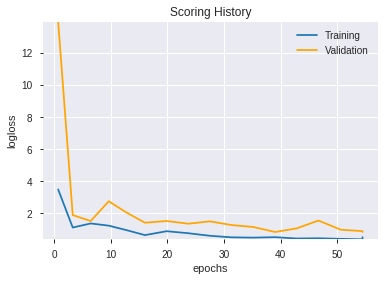

--2019-07-25 04:51:37--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.168.115
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.168.115|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


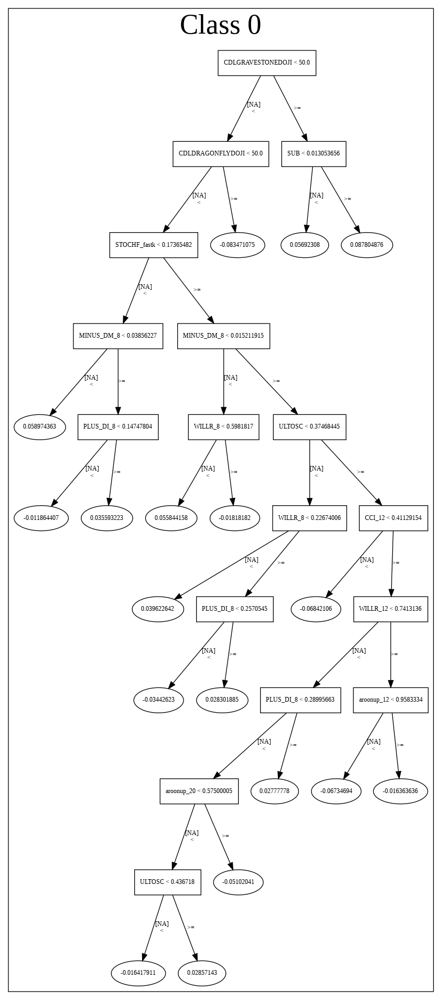

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190725_042504_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190725_042504_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_74_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['CDLEVENINGDOJISTAR',
 'CDLTASUKIGAP',
 'CDL3WHITESOLDIERS',
 'CDLHOMINGPIGEON',
 'CDLPIERCING',
 'CDLSTALLEDPATTERN',
 'CDLGAPSIDESIDEWHITE',
 'CDLMORNINGDOJISTAR',
 'CDLTHRUSTING',
 'CDL3LINESTRIKE',
 'CDLEVENINGSTAR',
 'CDLDARKCLOUDCOVER',
 'CDL3INSIDE',
 'CDLMORNINGSTAR',
 'CDLINVERTEDHAMMER',
 'CDLHARAMICROSS',
 'CDLSEPARATINGLINES',
 'CDLXSIDEGAP3METHODS',
 'CDLADVANCEBLOCK',
 'CDLGRAVESTONEDOJI',
 'CDLHANGINGMAN',
 'CDLSHOOTINGSTAR',
 'CDLMATCHINGLOW',
 'hour',
 'CDLTAKURI',
 'is_month_start',
 'CDLRICKSHAWMAN',
 'CDLHAMMER',
 'CDLLONGLEGGEDDOJI',
 'CDLDOJISTAR',
 'BOP',
 'CDLDRAGONFLYDOJI',
 'CDLDOJI',
 'days_in_month',
 'TAN',
 'CDLHARAMI',
 'HT_TRENDMODE',
 'is_month_end',
 'CORREL_8',
 'CDLHIGHWAVE',
 'weekday_name',
 'CDL3OUTSIDE',
 'STOCHRSI_fastk',
 'STOCHF_fastd',
 'HT_PHASOR_quadrature',
 'CDLENGULFING',
 'weekday',
 'STOCHF_fastk',
 'dayofweek',
 'CDLBELTHOLD',
 'aroonup_8',
 'CDLMARUBOZU',
 'CDLSHORTLINE',
 'CORREL_12',
 'STOCH_slowk',
 'aroondown_14',
 'BETA_8',
 'C

In [47]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190725_045149_model_1,0.523056,0.70623,0.452083,0.506439,0.25648


,variable,relative_importance,scaled_importance,percentage
0,CDLGAPSIDESIDEWHITE,8.308442e-03,1.000000,1.240776e-02
1,CDL3OUTSIDE,8.305434e-03,0.999638,1.240327e-02
2,CDLSEPARATINGLINES,7.685628e-03,0.925038,1.147766e-02
3,CDLINVERTEDHAMMER,7.324950e-03,0.881627,1.093903e-02
4,CDLSTALLEDPATTERN,7.198587e-03,0.866418,1.075032e-02
5,CDLBELTHOLD,6.901392e-03,0.830648,1.030649e-02
6,CORREL_12,6.870104e-03,0.826882,1.025976e-02
7,CDLSHOOTINGSTAR,6.854596e-03,0.825016,1.023660e-02
8,CDLXSIDEGAP3METHODS,6.797714e-03,0.818170,1.015165e-02
9,CDLHIKKAKE,6.596989e-03,0.794010,9.851894e-03


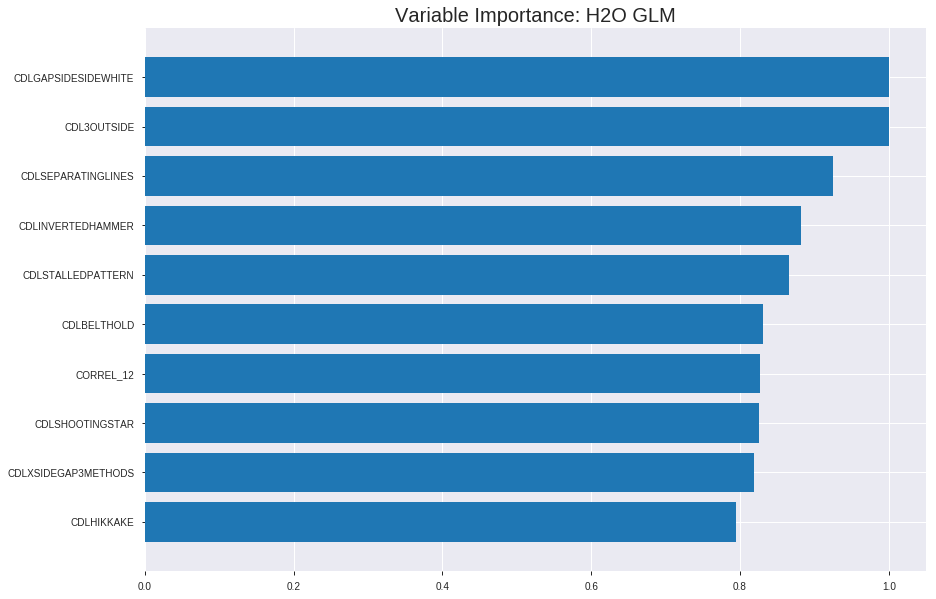

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190725_045149_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.2459630617207227
RMSE: 0.49594663192799554
LogLoss: 0.6850328578119914
Null degrees of freedom: 1184
Residual degrees of freedom: 152
Null deviance: 1639.617345269403
Residual deviance: 1623.5278730144198
AIC: 3689.52787301442
AUC: 0.593557747782227
pr_auc: 0.5970484210897683
Gini: 0.18711549556445406
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49581364402501593: 


,0,1,Error,Rate
0,77.0,485.0,0.863,(485.0/562.0)
1,33.0,590.0,0.053,(33.0/623.0)
Total,110.0,1075.0,0.4371,(518.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4958136,0.6949352,347.0
max f2,0.4725437,0.8483115,395.0
max f0point5,0.5078718,0.6055937,295.0
max accuracy,0.5150218,0.5780591,259.0
max precision,0.6427833,1.0,0.0
max recall,0.4725437,1.0,395.0
max specificity,0.6427833,1.0,0.0
max absolute_mcc,0.5078718,0.1515079,295.0
max min_per_class_accuracy,0.5228342,0.5658363,220.0
max mean_per_class_accuracy,0.5198521,0.5741319,235.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 52.57 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.6052700,1.2680578,1.2680578,0.6666667,0.6141572,0.6666667,0.6141572,0.0128411,0.0128411,26.8057785,26.8057785
,2,0.0202532,0.5978110,1.5850722,1.4265650,0.8333333,0.6022207,0.75,0.6081889,0.0160514,0.0288925,58.5072231,42.6565008
,3,0.0303797,0.5903191,1.4265650,1.4265650,0.75,0.5936685,0.75,0.6033488,0.0144462,0.0433387,42.6565008,42.6565008
,4,0.0405063,0.5823542,1.1095506,1.3473114,0.5833333,0.5858416,0.7083333,0.5989720,0.0112360,0.0545746,10.9550562,34.7311396
,5,0.0506329,0.5745723,0.7925361,1.2363563,0.4166667,0.5790467,0.65,0.5949869,0.0080257,0.0626003,-20.7463884,23.6356340
,6,0.1004219,0.5570736,1.1928340,1.2147780,0.6271186,0.5650819,0.6386555,0.5801601,0.0593900,0.1219904,19.2834018,21.4778046
,7,0.1502110,0.5480653,1.0638790,1.1647609,0.5593220,0.5517478,0.6123596,0.5707425,0.0529695,0.1749599,6.3878989,16.4760943
,8,0.2,0.5426863,1.2895503,1.1958266,0.6779661,0.5451314,0.6286920,0.5643667,0.0642055,0.2391653,28.9550290,19.5826645
,9,0.3004219,0.5343506,1.1348584,1.1754468,0.5966387,0.5379591,0.6179775,0.5555395,0.1139647,0.3531300,13.4858438,17.5446823
,10,0.4,0.5288119,1.0316402,1.1396469,0.5423729,0.5316021,0.5991561,0.5495804,0.1027287,0.4558587,3.1640232,13.9646870




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2557968253111657
RMSE: 0.5057636061552528
LogLoss: 0.7048878860099458
Null degrees of freedom: 338
Residual degrees of freedom: -694
Null deviance: 472.19286403265005
Residual deviance: 477.91398671474326
AIC: 2543.9139867147433
AUC: 0.5382041271611824
pr_auc: 0.4923746847292841
Gini: 0.07640825432236475
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5077627307003674: 


,0,1,Error,Rate
0,1.0,175.0,0.9943,(175.0/176.0)
1,0.0,163.0,0.0,(0.0/163.0)
Total,1.0,338.0,0.5162,(175.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5077627,0.6506986,337.0
max f2,0.5077627,0.8232323,337.0
max f0point5,0.5487505,0.5630027,238.0
max accuracy,0.5487832,0.5575221,236.0
max precision,0.6281699,1.0,0.0
max recall,0.5077627,1.0,337.0
max specificity,0.6281699,1.0,0.0
max absolute_mcc,0.5487505,0.1434802,238.0
max min_per_class_accuracy,0.5595782,0.5340909,169.0
max mean_per_class_accuracy,0.5487505,0.5654803,238.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 56.29 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.6238348,1.5598160,1.5598160,0.75,0.6270535,0.75,0.6270535,0.0184049,0.0184049,55.9815951,55.9815951
,2,0.0206490,0.6117379,0.0,0.8913234,0.0,0.6156129,0.4285714,0.6221504,0.0,0.0184049,-100.0,-10.8676599
,3,0.0324484,0.6088975,0.5199387,0.7562744,0.25,0.6102873,0.3636364,0.6178365,0.0061350,0.0245399,-48.0061350,-24.3725600
,4,0.0412979,0.6055441,1.3865031,0.8913234,0.6666667,0.6066029,0.4285714,0.6154293,0.0122699,0.0368098,38.6503067,-10.8676599
,5,0.0501475,0.6042990,0.6932515,0.8563695,0.3333333,0.6052103,0.4117647,0.6136260,0.0061350,0.0429448,-30.6748466,-14.3630458
,6,0.1002950,0.5964153,0.9787080,0.9175388,0.4705882,0.6004315,0.4411765,0.6070288,0.0490798,0.0920245,-2.1291952,-8.2461205
,7,0.1504425,0.5890507,0.8563695,0.8971490,0.4117647,0.5931614,0.4313725,0.6024063,0.0429448,0.1349693,-14.3630458,-10.2850956
,8,0.2005900,0.5835964,0.9787080,0.9175388,0.4705882,0.5864031,0.4411765,0.5984055,0.0490798,0.1840491,-2.1291952,-8.2461205
,9,0.3008850,0.5749271,1.2845543,1.0398773,0.6176471,0.5784295,0.5,0.5917469,0.1288344,0.3128834,28.4554313,3.9877301
,10,0.4011799,0.5671571,1.1010466,1.0551696,0.5294118,0.5719063,0.5073529,0.5867867,0.1104294,0.4233129,10.1046554,5.5169614



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-07-25 04:51:51,0.000 sec,2,.29E1,1033,1.3700657,1.4097758
,2019-07-25 04:51:52,1.392 sec,4,.21E1,1033,1.3669113,1.4129084
,2019-07-25 04:51:54,2.726 sec,6,.15E1,1033,1.3631438,1.4165843
,2019-07-25 04:51:55,4.073 sec,8,.11E1,1033,1.3586998,1.4210763
,2019-07-25 04:51:56,5.424 sec,10,.81E0,1033,1.3536021,1.4264425


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5529411764705883)

('F1', 0.6553191489361703)

('auc', 0.5230555555555556)

('logloss', 0.7062299531225238)

('mean_per_class_error', 0.4520833333333333)

('rmse', 0.5064386045150248)

('mse', 0.2564800601431257)

glm prediction progress: |████████████████████████████████████████████████| 100%


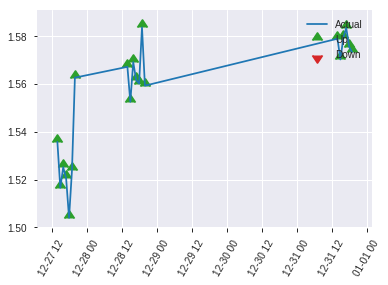


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.2564800601431257
RMSE: 0.5064386045150248
LogLoss: 0.7062299531225238
Null degrees of freedom: 169
Residual degrees of freedom: -863
Null deviance: 237.15156222668182
Residual deviance: 240.1181840616581
AIC: 2306.118184061658
AUC: 0.5230555555555556
pr_auc: 0.47195934780405047
Gini: 0.046111111111111214
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5363010910447127: 


,0,1,Error,Rate
0,12.0,78.0,0.8667,(78.0/90.0)
1,3.0,77.0,0.0375,(3.0/80.0)
Total,15.0,155.0,0.4765,(81.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5363011,0.6553191,154.0
max f2,0.5264343,0.8213552,166.0
max f0point5,0.5363011,0.55,154.0
max accuracy,0.5650720,0.5529412,55.0
max precision,0.6291693,1.0,0.0
max recall,0.5264343,1.0,166.0
max specificity,0.6291693,1.0,0.0
max absolute_mcc,0.5363011,0.1686442,154.0
max min_per_class_accuracy,0.5556465,0.5222222,84.0
max mean_per_class_accuracy,0.5363011,0.5479167,154.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 55.99 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.6144392,1.0625,1.0625,0.5,0.6223787,0.5,0.6223787,0.0125,0.0125,6.25,6.25
,2,0.0235294,0.6067570,1.0625,1.0625,0.5,0.6112457,0.5,0.6168122,0.0125,0.025,6.25,6.25
,3,0.0352941,0.6003339,1.0625,1.0625,0.5,0.6021351,0.5,0.6119198,0.0125,0.0375,6.25,6.25
,4,0.0411765,0.5973334,0.0,0.9107143,0.0,0.5985469,0.4285714,0.6100094,0.0,0.0375,-100.0,-8.9285714
,5,0.0529412,0.5960369,1.0625,0.9444444,0.5,0.5967448,0.4444444,0.6070617,0.0125,0.05,6.25,-5.5555556
,6,0.1,0.5881853,0.796875,0.875,0.375,0.5924220,0.4117647,0.6001725,0.0375,0.0875,-20.3125,-12.5
,7,0.1529412,0.5835656,0.9444444,0.8990385,0.4444444,0.5856871,0.4230769,0.5951583,0.05,0.1375,-5.5555556,-10.0961538
,8,0.2,0.5790703,1.0625,0.9375,0.5,0.5815973,0.4411765,0.5919675,0.05,0.1875,6.25,-6.25
,9,0.3,0.5679585,1.5000000,1.125,0.7058824,0.5737306,0.5294118,0.5858885,0.15,0.3375,50.0000000,12.5
,10,0.4,0.5606833,1.0,1.09375,0.4705882,0.5641652,0.5147059,0.5804577,0.1,0.4375,0.0,9.375


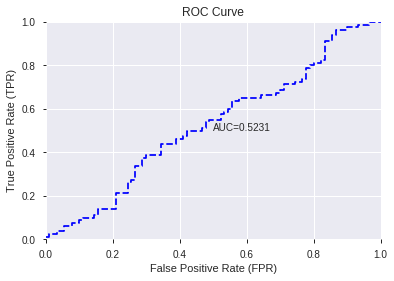

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


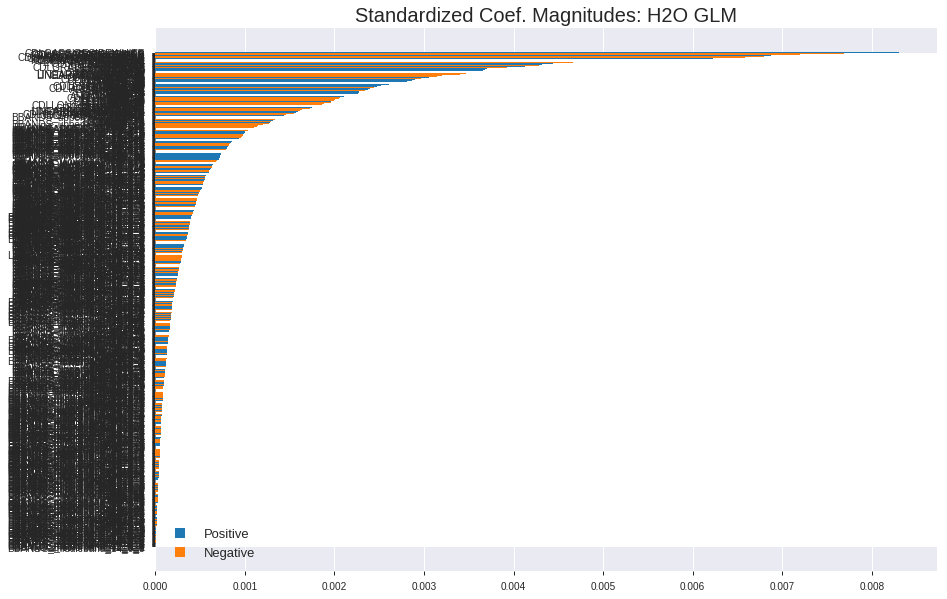

'log_likelihood'
--2019-07-25 04:52:20--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.98.227
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.98.227|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


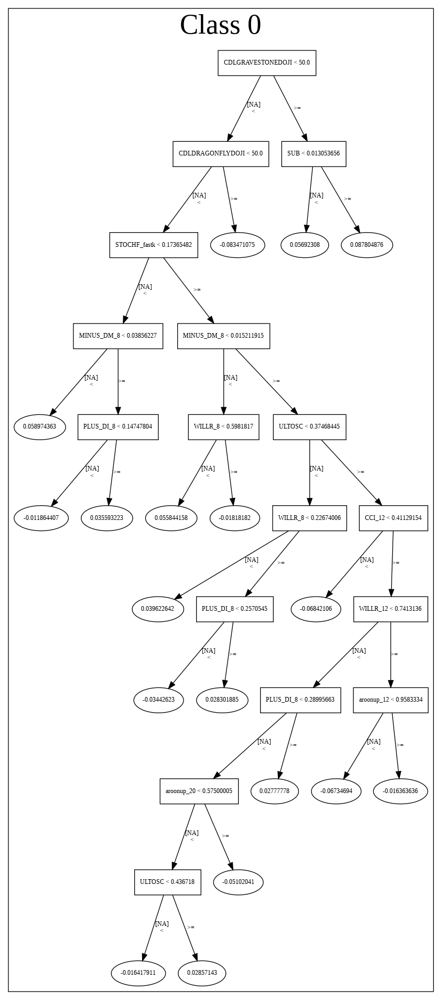

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190725_045149_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190725_045149_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_82_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_82_s

['CDLGAPSIDESIDEWHITE',
 'CDL3OUTSIDE',
 'CDLSEPARATINGLINES',
 'CDLINVERTEDHAMMER',
 'CDLSTALLEDPATTERN',
 'CDLBELTHOLD',
 'CORREL_12',
 'CDLSHOOTINGSTAR',
 'CDLXSIDEGAP3METHODS',
 'CDLHIKKAKE',
 'CDLHOMINGPIGEON',
 'CDLMORNINGDOJISTAR',
 'BETA_12',
 'CDLEVENINGDOJISTAR',
 'HT_PHASOR_quadrature',
 'CDL3WHITESOLDIERS',
 'BETA_14',
 'Volume',
 'aroonup_8',
 'TAN',
 'CDLHARAMI',
 'CDLHARAMICROSS',
 'CDLHIGHWAVE',
 'STDDEV_12',
 'DX_30',
 'quarter',
 'CDLTASUKIGAP',
 'day',
 'CDLGRAVESTONEDOJI',
 'month',
 'is_month_end',
 'MINUS_DI_8',
 'CDLSHORTLINE',
 'ROCR100_30',
 'ROCR_30',
 'ROCP_30',
 'ROC_30',
 'weekofyear',
 'week',
 'dayofyear',
 'AROONOSC_8',
 'is_month_start',
 'LINEARREG_ANGLE_8',
 'LINEARREG_SLOPE_8',
 'MACDEXT_hist',
 'CDLMORNINGSTAR',
 'MINUS_DI_12',
 'DX_24',
 'aroonup_20',
 'CDLENGULFING',
 'MINUS_DI_14',
 'NATR_30',
 'ATR_30',
 'VAR_12',
 'CDL3LINESTRIKE',
 'BETA_30',
 'NATR_24',
 'CORREL_14',
 'ATR_24',
 'CDLMARUBOZU',
 'PLUS_DM_8',
 'NATR_20',
 'BETA_24',
 'PLUS_DI_8

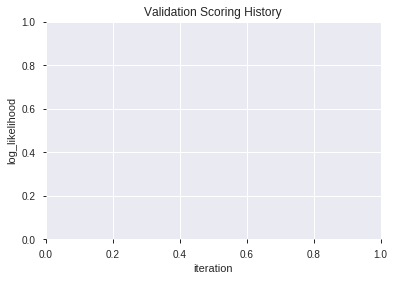

In [48]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_1_AutoML_20190725_045228,0.535972,0.737719,0.483333,0.520387,0.270803
1,XGBoost_grid_1_AutoML_20190725_045228_model_2,0.523333,0.723740,0.500000,0.514531,0.264742
2,XGBoost_grid_1_AutoML_20190725_045228_model_7,0.521806,0.747615,0.500000,0.524457,0.275055
3,XGBoost_grid_1_AutoML_20190725_045228_model_4,0.504028,0.714331,0.500000,0.510177,0.260280
4,XGBoost_grid_1_AutoML_20190725_045228_model_5,0.497639,0.776955,0.462500,0.534054,0.285214
5,XGBoost_2_AutoML_20190725_045228,0.486528,0.727789,0.488889,0.516366,0.266634
6,XGBoost_3_AutoML_20190725_045228,0.482500,0.755683,0.469444,0.527390,0.278140
7,XGBoost_grid_1_AutoML_20190725_045228_model_3,0.480972,0.766311,0.494444,0.532332,0.283377
8,XGBoost_grid_1_AutoML_20190725_045228_model_1,0.474861,0.741118,0.500000,0.522186,0.272678
9,XGBoost_grid_1_AutoML_20190725_045228_model_6,0.460278,0.721374,0.479167,0.513514,0.263696


,variable,relative_importance,scaled_importance,percentage
0,Volume,123.654221,1.000000,0.020507
1,CORREL_20,112.500847,0.909802,0.018657
2,HT_PHASOR_quadrature,104.749466,0.847116,0.017372
3,BETA_24,98.321571,0.795133,0.016306
4,DIV,81.756096,0.661167,0.013558
5,BETA_8,81.107422,0.655921,0.013451
6,CORREL_12,80.242249,0.648924,0.013307
7,BETA_12,79.028343,0.639108,0.013106
8,BOP,76.128548,0.615657,0.012625
9,TRANGE,72.619148,0.587276,0.012043


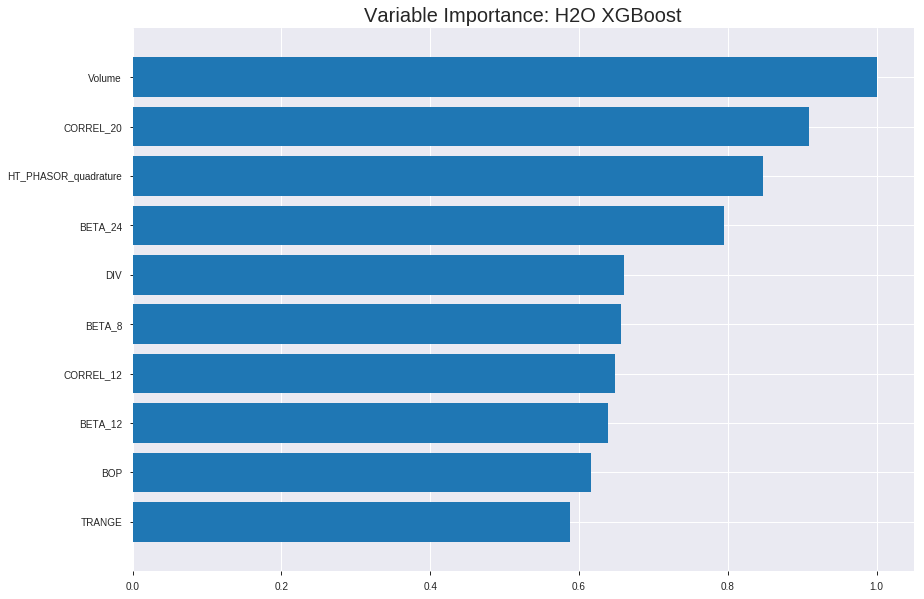

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_20190725_045228


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.14149968098102542
RMSE: 0.37616443343440303
LogLoss: 0.46530791013688116
Mean Per-Class Error: 0.07508725430273677
AUC: 0.9764399102037551
pr_auc: 0.9763903647185425
Gini: 0.9528798204075102
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5115488568941752: 


,0,1,Error,Rate
0,520.0,42.0,0.0747,(42.0/562.0)
1,47.0,576.0,0.0754,(47.0/623.0)
Total,567.0,618.0,0.0751,(89.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5115489,0.9282836,203.0
max f2,0.4428332,0.9501702,248.0
max f0point5,0.5400133,0.9348633,187.0
max accuracy,0.5115489,0.9248945,203.0
max precision,0.8453867,1.0,0.0
max recall,0.3910019,1.0,284.0
max specificity,0.8453867,1.0,0.0
max absolute_mcc,0.5115489,0.8494859,203.0
max min_per_class_accuracy,0.5115489,0.9245586,203.0
max mean_per_class_accuracy,0.5115489,0.9249127,203.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 52.34 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.8194616,1.9020867,1.9020867,1.0,0.8302640,1.0,0.8302640,0.0192616,0.0192616,90.2086677,90.2086677
,2,0.0202532,0.7945419,1.9020867,1.9020867,1.0,0.8082771,1.0,0.8192706,0.0192616,0.0385233,90.2086677,90.2086677
,3,0.0303797,0.7795906,1.9020867,1.9020867,1.0,0.7885393,1.0,0.8090268,0.0192616,0.0577849,90.2086677,90.2086677
,4,0.0405063,0.7684033,1.9020867,1.9020867,1.0,0.7755158,1.0,0.8006491,0.0192616,0.0770465,90.2086677,90.2086677
,5,0.0506329,0.7596226,1.9020867,1.9020867,1.0,0.7639509,1.0,0.7933094,0.0192616,0.0963082,90.2086677,90.2086677
,6,0.1004219,0.7318969,1.9020867,1.9020867,1.0,0.7449564,1.0,0.7693361,0.0947030,0.1910112,90.2086677,90.2086677
,7,0.1502110,0.7062524,1.9020867,1.9020867,1.0,0.7195630,1.0,0.7528383,0.0947030,0.2857143,90.2086677,90.2086677
,8,0.2,0.6867180,1.8698479,1.8940610,0.9830508,0.6956960,0.9957806,0.7386130,0.0930979,0.3788122,86.9847920,89.4060995
,9,0.3004219,0.6418577,1.9020867,1.8967437,1.0,0.6633192,0.9971910,0.7134446,0.1910112,0.5698234,90.2086677,89.6743737
,10,0.4,0.5969051,1.7570123,1.8619583,0.9237288,0.6200926,0.9789030,0.6902050,0.1749599,0.7447833,75.7012270,86.1958266




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.26772255548220103
RMSE: 0.5174191294127045
LogLoss: 0.7314718609751296
Mean Per-Class Error: 0.4512165365309537
AUC: 0.5237381483547128
pr_auc: 0.5101084827495895
Gini: 0.04747629670942555
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3317350149154663: 


,0,1,Error,Rate
0,0.0,176.0,1.0,(176.0/176.0)
1,0.0,163.0,0.0,(0.0/163.0)
Total,0.0,339.0,0.5192,(176.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3317350,0.6494024,338.0
max f2,0.3317350,0.8224016,338.0
max f0point5,0.5592808,0.5470980,221.0
max accuracy,0.5592808,0.5427729,221.0
max precision,0.8411567,1.0,0.0
max recall,0.3317350,1.0,338.0
max specificity,0.8411567,1.0,0.0
max absolute_mcc,0.7812170,0.1271377,4.0
max min_per_class_accuracy,0.6030626,0.4969325,168.0
max mean_per_class_accuracy,0.5592808,0.5487835,221.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 59.42 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.7836684,2.0797546,2.0797546,1.0,0.8087337,1.0,0.8087337,0.0245399,0.0245399,107.9754601,107.9754601
,2,0.0206490,0.7762716,0.6932515,1.4855390,0.3333333,0.7785674,0.7142857,0.7958053,0.0061350,0.0306748,-30.6748466,48.5539001
,3,0.0324484,0.7612803,1.0398773,1.3234802,0.5,0.7680758,0.6363636,0.7857219,0.0122699,0.0429448,3.9877301,32.3480201
,4,0.0412979,0.7560904,0.6932515,1.1884312,0.3333333,0.7589886,0.5714286,0.7799933,0.0061350,0.0490798,-30.6748466,18.8431201
,5,0.0501475,0.7515357,0.6932515,1.1010466,0.3333333,0.7547022,0.5294118,0.7755302,0.0061350,0.0552147,-30.6748466,10.1046554
,6,0.1002950,0.7176544,1.1010466,1.1010466,0.5294118,0.7328222,0.5294118,0.7541762,0.0552147,0.1104294,10.1046554,10.1046554
,7,0.1504425,0.6958382,0.8563695,1.0194875,0.4117647,0.7066939,0.4901961,0.7383488,0.0429448,0.1533742,-14.3630458,1.9487550
,8,0.2005900,0.6726687,0.9787080,1.0092927,0.4705882,0.6835478,0.4852941,0.7246485,0.0490798,0.2024540,-2.1291952,0.9292674
,9,0.3008850,0.6476920,1.0398773,1.0194875,0.5,0.6586182,0.4901961,0.7026384,0.1042945,0.3067485,3.9877301,1.9487550
,10,0.4011799,0.6244679,0.9787080,1.0092927,0.4705882,0.6355047,0.4852941,0.6858550,0.0981595,0.4049080,-2.1291952,0.9292674



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 04:52:28,0.006 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4742616,0.5,0.6931472,0.5,0.0,1.0,0.5191740
,2019-07-25 04:52:29,0.616 sec,5.0,0.4832105,0.6600389,0.8181469,0.8214239,1.9020867,0.2599156,0.4995301,0.6922037,0.5394939,0.5202221,1.5598160,0.5073746
,2019-07-25 04:52:29,0.807 sec,10.0,0.4683155,0.6313446,0.8768401,0.8841398,1.9020867,0.2092827,0.5025206,0.6981924,0.4969325,0.5205104,1.5598160,0.5162242
,2019-07-25 04:52:29,0.986 sec,15.0,0.4532637,0.6029324,0.9098068,0.9138395,1.9020867,0.1670886,0.5023185,0.6978334,0.5363044,0.5277348,1.5598160,0.5132743
,2019-07-25 04:52:29,1.172 sec,20.0,0.4391476,0.5767988,0.9299181,0.9351787,1.9020867,0.1417722,0.5027861,0.6987919,0.5337075,0.5276388,2.0797546,0.5103245
,2019-07-25 04:52:29,1.345 sec,25.0,0.4270670,0.5548512,0.9442815,0.9460754,1.9020867,0.1156118,0.5046629,0.7028102,0.5365310,0.5236240,2.0797546,0.5162242
,2019-07-25 04:52:30,1.517 sec,30.0,0.4149252,0.5330528,0.9561686,0.9571815,1.9020867,0.1029536,0.5092930,0.7128511,0.5355898,0.5196947,1.5598160,0.5191740
,2019-07-25 04:52:30,1.679 sec,35.0,0.4051681,0.5157303,0.9621022,0.9606890,1.9020867,0.0987342,0.5111347,0.7167670,0.5292457,0.5225140,2.0797546,0.5191740
,2019-07-25 04:52:30,1.869 sec,40.0,0.3962564,0.5001235,0.9681529,0.9683065,1.9020867,0.0894515,0.5136508,0.7224548,0.5230061,0.5098422,2.0797546,0.5191740
,2019-07-25 04:52:30,2.034 sec,45.0,0.3860424,0.4824073,0.9736438,0.9735638,1.9020867,0.0835443,0.5149201,0.7258217,0.5316857,0.5126985,1.5598160,0.5191740


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
Volume,123.6542206,1.0,0.0205067
CORREL_20,112.5008469,0.9098019,0.0186570
HT_PHASOR_quadrature,104.7494659,0.8471160,0.0173716
BETA_24,98.3215714,0.7951332,0.0163056
DIV,81.7560959,0.6611670,0.0135584
---,---,---,---
CMO_24,0.7465553,0.0060374,0.0001238
BBANDS_upperband_24_3_3,0.6454811,0.0052200,0.0001070
BBANDS_upperband_8_2_2,0.3292046,0.0026623,0.0000546
BBANDS_lowerband_8_6_4,0.2895241,0.0023414,0.0000480



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5529411764705883)

('F1', 0.6477732793522267)

('auc', 0.5359722222222222)

('logloss', 0.7377190018515014)

('mean_per_class_error', 0.4555555555555555)

('rmse', 0.5203871370160662)

('mse', 0.270802772371778)

xgboost prediction progress: |████████████████████████████████████████████| 100%


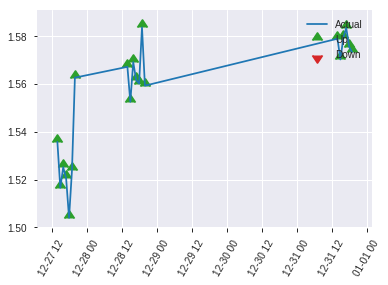


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.270802772371778
RMSE: 0.5203871370160662
LogLoss: 0.7377190018515014
Mean Per-Class Error: 0.4555555555555555
AUC: 0.5359722222222222
pr_auc: 0.496436073469727
Gini: 0.07194444444444437
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40289783477783203: 


,0,1,Error,Rate
0,3.0,87.0,0.9667,(87.0/90.0)
1,0.0,80.0,0.0,(0.0/80.0)
Total,3.0,167.0,0.5118,(87.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4028978,0.6477733,166.0
max f2,0.4028978,0.8213552,166.0
max f0point5,0.5398665,0.5414013,136.0
max accuracy,0.6698731,0.5529412,41.0
max precision,0.7869630,1.0,0.0
max recall,0.4028978,1.0,166.0
max specificity,0.7869630,1.0,0.0
max absolute_mcc,0.4028978,0.1263648,166.0
max min_per_class_accuracy,0.6228635,0.525,83.0
max mean_per_class_accuracy,0.6302611,0.5444444,76.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 61.10 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.7707869,2.125,2.125,1.0,0.7855168,1.0,0.7855168,0.025,0.025,112.5,112.5
,2,0.0235294,0.7618105,1.0625,1.59375,0.5,0.7646494,0.75,0.7750831,0.0125,0.0375,6.25,59.375
,3,0.0352941,0.7425463,0.0,1.0625,0.0,0.7500287,0.5,0.7667316,0.0,0.0375,-100.0,6.25
,4,0.0411765,0.7409559,2.125,1.2142857,1.0,0.7418036,0.5714286,0.7631705,0.0125,0.05,112.5,21.4285714
,5,0.0529412,0.7396527,0.0,0.9444444,0.0,0.7402602,0.4444444,0.7580793,0.0,0.05,-100.0,-5.5555556
,6,0.1,0.7194137,1.328125,1.125,0.625,0.7310669,0.5294118,0.7453676,0.0625,0.1125,32.8125,12.5
,7,0.1529412,0.6936637,0.9444444,1.0625,0.4444444,0.7087093,0.5,0.7326782,0.05,0.1625,-5.5555556,6.25
,8,0.2,0.6801703,0.796875,1.0,0.375,0.6839817,0.4705882,0.7212202,0.0375,0.2,-20.3125,0.0
,9,0.3,0.6542299,1.375,1.125,0.6470588,0.6671300,0.5294118,0.7031901,0.1375,0.3375,37.5,12.5
,10,0.4,0.6371921,1.0,1.09375,0.4705882,0.6469574,0.5147059,0.6891319,0.1,0.4375,0.0,9.375


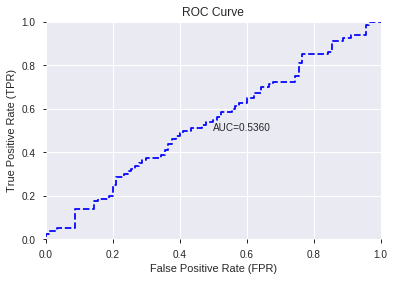

This function is available for GLM models only


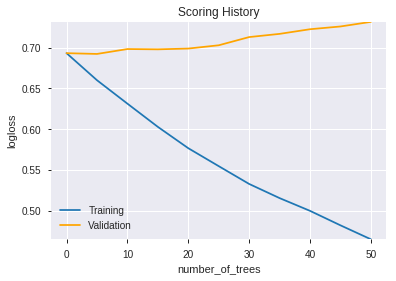

--2019-07-25 04:53:04--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.0.131
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.0.131|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.

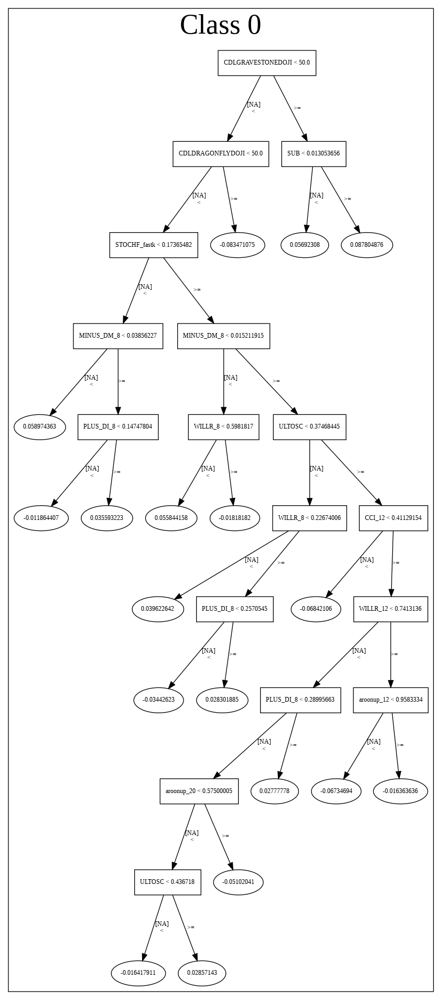

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_1_AutoML_20190725_045228',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_1_AutoML_20190725_045228',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_90_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_90_sid_8832',
   'type

['Volume',
 'CORREL_20',
 'HT_PHASOR_quadrature',
 'BETA_24',
 'DIV',
 'BETA_8',
 'CORREL_12',
 'BETA_12',
 'BOP',
 'TRANGE',
 'ADX_8',
 'SUB',
 'MFI_20',
 'STDDEV_8',
 'STOCHF_fastk',
 'MFI_14',
 'DX_12',
 'BETA_30',
 'HT_DCPERIOD',
 'STOCHRSI_fastk',
 'MFI_8',
 'MACDEXT_hist',
 'HT_PHASOR_inphase',
 'aroondown_14',
 'MINUS_DM_30',
 'DX_20',
 'DX_30',
 'CORREL_8',
 'MINUS_DI_14',
 'VAR_14',
 'STDDEV_24',
 'CDLBELTHOLD',
 'ROC_8',
 'MOM_24',
 'STOCHRSI_fastd',
 'CCI_8',
 'OBV',
 'MFI_24',
 'STDDEV_12',
 'BETA_14',
 'DX_24',
 'CORREL_14',
 'CORREL_24',
 'MFI_12',
 'AD',
 'MFI_30',
 'ADX_24',
 'MINUS_DM_14',
 'PLUS_DI_12',
 'BBANDS_upperband_20_5_5',
 'MOM_30',
 'TRIX_8',
 'ADOSC',
 'LINEARREG_ANGLE_8',
 'CCI_12',
 'MOM_8',
 'aroondown_30',
 'DX_8',
 'LINEARREG_ANGLE_20',
 'WILLR_24',
 'TRIX_12',
 'PLUS_DI_8',
 'VAR_8',
 'SAREXT',
 'MOM_12',
 'CDLHIKKAKE',
 'aroonup_8',
 'STOCH_slowk',
 'WILLR_20',
 'NATR_30',
 'ADX_14',
 'MINUS_DM_8',
 'MACDFIX_signal_12',
 'STDDEV_20',
 'PLUS_DM_14',
 

In [49]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [50]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=5).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

547

['BBANDS_upperband_12_7_4',
 'BBANDS_middleband_12_7_4',
 'BBANDS_lowerband_12_7_4',
 'BBANDS_upperband_12_7_5',
 'BBANDS_middleband_12_7_5',
 'BBANDS_lowerband_12_7_5',
 'DEMA_14',
 'EMA_14',
 'KAMA_14',
 'MIDPOINT_14',
 'MIDPRICE_14',
 'SAR_0.14',
 'SMA_14',
 'TEMA_14',
 'TRIMA_14',
 'WMA_14',
 'MA_14_0',
 'MAVP_14_0',
 'BBANDS_upperband_14_0_2',
 'BBANDS_middleband_14_0_2',
 'BBANDS_lowerband_14_0_2',
 'BBANDS_upperband_14_0_3',
 'BBANDS_middleband_14_0_3',
 'BBANDS_lowerband_14_0_3',
 'BBANDS_upperband_14_0_4',
 'BBANDS_middleband_14_0_4',
 'BBANDS_lowerband_14_0_4',
 'BBANDS_upperband_14_0_5',
 'BBANDS_middleband_14_0_5',
 'BBANDS_lowerband_14_0_5',
 'MA_14_1',
 'MAVP_14_1',
 'BBANDS_upperband_14_1_2',
 'BBANDS_middleband_14_1_2',
 'BBANDS_lowerband_14_1_2',
 'BBANDS_upperband_14_1_3',
 'BBANDS_middleband_14_1_3',
 'BBANDS_lowerband_14_1_3',
 'BBANDS_upperband_14_1_4',
 'BBANDS_middleband_14_1_4',
 'BBANDS_lowerband_14_1_4',
 'BBANDS_upperband_14_1_5',
 'BBANDS_middleband_14_1_5',

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190725_045400_model_6,0.557569,0.695791,0.483333,0.501318,0.251320
1,DeepLearning_1_AutoML_20190725_045400,0.494375,0.710268,0.477778,0.507415,0.257470
2,DeepLearning_grid_1_AutoML_20190725_045400_model_5,0.489028,0.704889,0.494444,0.505542,0.255573
3,DeepLearning_grid_1_AutoML_20190725_045400_model_9,0.486944,0.692202,0.466667,0.499528,0.249528
4,DeepLearning_grid_1_AutoML_20190725_045400_model_4,0.485556,1.484940,0.494444,0.635992,0.404486
5,DeepLearning_grid_1_AutoML_20190725_045400_model_8,0.476319,0.692483,0.473611,0.499668,0.249668
6,DeepLearning_grid_1_AutoML_20190725_045400_model_3,0.471667,1.272415,0.462500,0.632930,0.400600
7,DeepLearning_grid_1_AutoML_20190725_045400_model_7,0.461944,0.932718,0.488889,0.583627,0.340620
8,DeepLearning_grid_1_AutoML_20190725_045400_model_2,0.445556,0.785491,0.500000,0.538391,0.289865
9,DeepLearning_grid_1_AutoML_20190725_045400_model_1,0.442083,3.233835,0.500000,0.694759,0.482691


,variable,relative_importance,scaled_importance,percentage
0,HT_TRENDMODE,1.000000,1.000000,0.002476
1,CORREL_12,0.979211,0.979211,0.002425
2,BOP,0.966612,0.966612,0.002394
3,HT_PHASOR_quadrature,0.954060,0.954060,0.002363
4,STOCHRSI_fastk,0.940009,0.940009,0.002328
5,CDLLONGLEGGEDDOJI,0.919702,0.919702,0.002277
6,STDDEV_8,0.892642,0.892642,0.002210
7,BETA_30,0.891511,0.891511,0.002208
8,ADX_24,0.885246,0.885246,0.002192
9,DX_30,0.883536,0.883536,0.002188


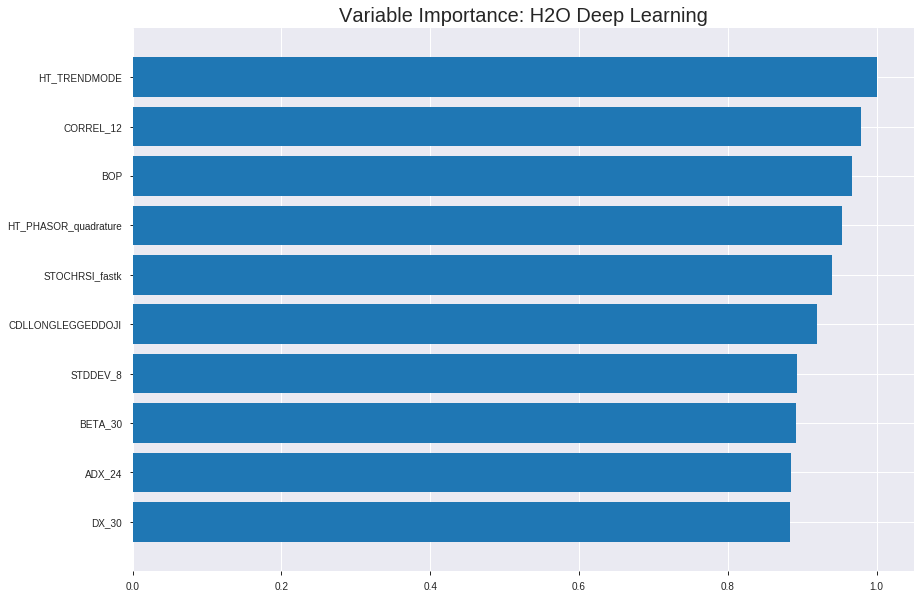

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190725_045400_model_6


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.2282237032457961
RMSE: 0.4777276454694621
LogLoss: 0.6452860227195324
Mean Per-Class Error: 0.38484288513278075
AUC: 0.6689448941238297
pr_auc: 0.6926431905610422
Gini: 0.3378897882476595
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49631733189524885: 


,0,1,Error,Rate
0,116.0,446.0,0.7936,(446.0/562.0)
1,29.0,594.0,0.0465,(29.0/623.0)
Total,145.0,1040.0,0.4008,(475.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4963173,0.7143716,286.0
max f2,0.4072782,0.8593966,339.0
max f0point5,0.5073670,0.6336155,255.0
max accuracy,0.5073670,0.6177215,255.0
max precision,0.9714692,1.0,0.0
max recall,0.2912239,1.0,361.0
max specificity,0.9714692,1.0,0.0
max absolute_mcc,0.4963173,0.2435805,286.0
max min_per_class_accuracy,0.5203436,0.6014235,217.0
max mean_per_class_accuracy,0.5229085,0.6151571,209.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 52.30 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.8207680,1.9020867,1.9020867,1.0,0.8696382,1.0,0.8696382,0.0192616,0.0192616,90.2086677,90.2086677
,2,0.0202532,0.7854098,1.7435795,1.8228331,0.9166667,0.8014614,0.9583333,0.8355498,0.0176565,0.0369181,74.3579454,82.2833066
,3,0.0303797,0.7537671,1.5850722,1.7435795,0.8333333,0.7661634,0.9166667,0.8124210,0.0160514,0.0529695,58.5072231,74.3579454
,4,0.0405063,0.6981510,1.7435795,1.7435795,0.9166667,0.7249045,0.9166667,0.7905419,0.0176565,0.0706260,74.3579454,74.3579454
,5,0.0506329,0.6806674,1.5850722,1.7118780,0.8333333,0.6862498,0.9,0.7696834,0.0160514,0.0866774,58.5072231,71.1878010
,6,0.1004219,0.6020311,1.4185053,1.5664243,0.7457627,0.6323482,0.8235294,0.7015929,0.0706260,0.1573034,41.8505319,56.6424323
,7,0.1502110,0.5601924,1.1605953,1.4319079,0.6101695,0.5784542,0.7528090,0.6607773,0.0577849,0.2150883,16.0595261,43.1907948
,8,0.2,0.5447225,1.3540278,1.4125201,0.7118644,0.5502997,0.7426160,0.6332744,0.0674157,0.2825040,35.4027804,41.2520064
,9,0.3004219,0.5310674,1.1188745,1.3143633,0.5882353,0.5359836,0.6910112,0.6007530,0.1123596,0.3948636,11.8874516,31.4363266
,10,0.4,0.5255802,1.0961177,1.2600321,0.5762712,0.5281954,0.6624473,0.5826902,0.1091493,0.5040128,9.6117746,26.0032103




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.2510422557942679
RMSE: 0.5010411717556432
LogLoss: 0.6952283556178072
Mean Per-Class Error: 0.44140407138873394
AUC: 0.5578290574456218
pr_auc: 0.5565534404921124
Gini: 0.11565811489124367
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5154841048276292: 


,0,1,Error,Rate
0,2.0,174.0,0.9886,(174.0/176.0)
1,0.0,163.0,0.0,(0.0/163.0)
Total,2.0,337.0,0.5133,(174.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5154841,0.652,294.0
max f2,0.5154841,0.8240647,294.0
max f0point5,0.5176315,0.5473026,278.0
max accuracy,0.5435619,0.5663717,57.0
max precision,0.5620370,1.0,0.0
max recall,0.5154841,1.0,294.0
max specificity,0.5620370,1.0,0.0
max absolute_mcc,0.5479602,0.1445685,20.0
max min_per_class_accuracy,0.5314189,0.5214724,168.0
max mean_per_class_accuracy,0.5387113,0.5585959,99.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 53.11 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.5578750,2.0797546,2.0797546,1.0,0.5602195,1.0,0.5602195,0.0245399,0.0245399,107.9754601,107.9754601
,2,0.0206490,0.5531886,1.3865031,1.7826468,0.6666667,0.5559805,0.8571429,0.5584028,0.0122699,0.0368098,38.6503067,78.2646801
,3,0.0324484,0.5515707,1.0398773,1.5125488,0.5,0.5522110,0.7272727,0.5561512,0.0122699,0.0490798,3.9877301,51.2548801
,4,0.0412979,0.5495136,1.3865031,1.4855390,0.6666667,0.5506053,0.7142857,0.5549628,0.0122699,0.0613497,38.6503067,48.5539001
,5,0.0501475,0.5490167,2.0797546,1.5904006,1.0,0.5493997,0.7647059,0.5539811,0.0184049,0.0797546,107.9754601,59.0400577
,6,0.1002950,0.5458512,1.2233851,1.4068928,0.5882353,0.5472036,0.6764706,0.5505924,0.0613497,0.1411043,22.3385060,40.6892818
,7,0.1504425,0.5438889,0.9787080,1.2641646,0.4705882,0.5447897,0.6078431,0.5486581,0.0490798,0.1901840,-2.1291952,26.4164562
,8,0.2005900,0.5422008,0.9787080,1.1928004,0.4705882,0.5431181,0.5735294,0.5472731,0.0490798,0.2392638,-2.1291952,19.2800433
,9,0.3008850,0.5378142,1.1622158,1.1826056,0.5588235,0.5400527,0.5686275,0.5448663,0.1165644,0.3558282,16.2215807,18.2605558
,10,0.4011799,0.5348271,0.8563695,1.1010466,0.4117647,0.5364349,0.5294118,0.5427585,0.0858896,0.4417178,-14.3630458,10.1046554



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 05:02:31,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-07-25 05:02:33,5 min 24.643 sec,488 obs/sec,0.9232068,1,1094.0,0.5929822,1.2239284,-0.4102486,0.5633172,0.5721033,1.5850722,0.4632911,0.7105252,2.8141074,-1.0223584,0.5271542,0.5087361,1.0398773,0.5132743
,2019-07-25 05:02:49,5 min 40.931 sec,633 obs/sec,9.1063291,10,10791.0,0.4942266,0.6815397,0.0203642,0.5912629,0.6095409,1.2680578,0.4675105,0.5064629,0.7091016,-0.0275296,0.5290365,0.4893761,0.0,0.5132743
,2019-07-25 05:03:05,5 min 56.462 sec,695 obs/sec,18.2497890,20,21626.0,0.4919675,0.6768508,0.0292998,0.5964053,0.6232180,1.7435795,0.4607595,0.5049626,0.7031810,-0.0214511,0.5050892,0.5085358,2.0797546,0.5162242
,2019-07-25 05:03:20,6 min 11.322 sec,728 obs/sec,27.3291139,30,32385.0,0.4873552,0.6671230,0.0474152,0.6432384,0.6627204,1.9020867,0.4329114,0.5066507,0.7067843,-0.0282920,0.5448794,0.5148975,0.5199387,0.5103245
,2019-07-25 05:03:35,6 min 27.050 sec,754 obs/sec,37.3713080,41,44285.0,0.4777276,0.6452860,0.0846797,0.6689449,0.6926432,1.9020867,0.4008439,0.5010412,0.6952284,-0.0056479,0.5578291,0.5565534,2.0797546,0.5132743
,2019-07-25 05:03:51,6 min 42.458 sec,772 obs/sec,47.3696203,52,56133.0,0.4748598,0.6379754,0.0956362,0.6712998,0.7105078,1.9020867,0.4025316,0.5021844,0.6975373,-0.0102423,0.5490275,0.5166358,0.5199387,0.5191740
,2019-07-25 05:04:06,6 min 57.659 sec,788 obs/sec,57.3940928,63,68012.0,0.4672835,0.6195444,0.1242638,0.6919295,0.7226544,1.9020867,0.3974684,0.5021927,0.6978423,-0.0102758,0.5508575,0.5132861,0.0,0.5191740
,2019-07-25 05:04:08,6 min 59.231 sec,787 obs/sec,57.3940928,63,68012.0,0.4777276,0.6452860,0.0846797,0.6689449,0.6926432,1.9020867,0.4008439,0.5010412,0.6952284,-0.0056479,0.5578291,0.5565534,2.0797546,0.5132743


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
HT_TRENDMODE,1.0,1.0,0.0024763
CORREL_12,0.9792110,0.9792110,0.0024248
BOP,0.9666120,0.9666120,0.0023936
HT_PHASOR_quadrature,0.9540600,0.9540600,0.0023625
STOCHRSI_fastk,0.9400091,0.9400091,0.0023278
---,---,---,---
BBANDS_lowerband_14_2_3,0.6631430,0.6631430,0.0016421
BBANDS_middleband_14_5_2,0.6619452,0.6619452,0.0016392
BBANDS_middleband_30_2_3,0.6617700,0.6617700,0.0016387
CDLMARUBOZU,0.6566355,0.6566355,0.0016260



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5588235294117647)

('F1', 0.6477732793522267)

('auc', 0.5575694444444445)

('logloss', 0.6957913422867297)

('mean_per_class_error', 0.4409722222222222)

('rmse', 0.501318344407635)

('mse', 0.2513200824396121)

deeplearning prediction progress: |███████████████████████████████████████| 100%


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


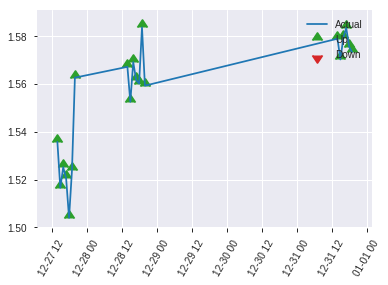


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.2513200824396121
RMSE: 0.501318344407635
LogLoss: 0.6957913422867297
Mean Per-Class Error: 0.4409722222222222
AUC: 0.5575694444444445
pr_auc: 0.5099115382953306
Gini: 0.1151388888888889
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5145026253460124: 


,0,1,Error,Rate
0,3.0,87.0,0.9667,(87.0/90.0)
1,0.0,80.0,0.0,(0.0/80.0)
Total,3.0,167.0,0.5118,(87.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5145026,0.6477733,145.0
max f2,0.5145026,0.8213552,145.0
max f0point5,0.5166704,0.5509868,131.0
max accuracy,0.5260504,0.5588235,50.0
max precision,0.5485217,0.6666667,5.0
max recall,0.5145026,1.0,145.0
max specificity,0.5773443,0.9888889,0.0
max absolute_mcc,0.5166704,0.1381125,131.0
max min_per_class_accuracy,0.5203556,0.5555556,84.0
max mean_per_class_accuracy,0.5203556,0.5590278,84.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 52.41 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.5621385,1.0625,1.0625,0.5,0.5737075,0.5,0.5737075,0.0125,0.0125,6.25,6.25
,2,0.0235294,0.5526498,1.0625,1.0625,0.5,0.5557961,0.5,0.5647518,0.0125,0.025,6.25,6.25
,3,0.0352941,0.5478882,2.125,1.4166667,1.0,0.5502858,0.6666667,0.5599298,0.025,0.05,112.5,41.6666667
,4,0.0411765,0.5393280,0.0,1.2142857,0.0,0.5394720,0.5714286,0.5570072,0.0,0.05,-100.0,21.4285714
,5,0.0529412,0.5391553,1.0625,1.1805556,0.5,0.5392423,0.5555556,0.5530595,0.0125,0.0625,6.25,18.0555556
,6,0.1,0.5378027,1.0625,1.125,0.5,0.5388736,0.5294118,0.5463838,0.05,0.1125,6.25,12.5
,7,0.1529412,0.5349282,0.7083333,0.9807692,0.3333333,0.5363176,0.4615385,0.5428993,0.0375,0.15,-29.1666667,-1.9230769
,8,0.2,0.5279852,1.59375,1.125,0.75,0.5328161,0.5294118,0.5405268,0.075,0.225,59.375,12.5
,9,0.3,0.5259667,1.25,1.1666667,0.5882353,0.5268348,0.5490196,0.5359628,0.125,0.35,25.0,16.6666667
,10,0.4,0.5229952,0.875,1.09375,0.4117647,0.5246323,0.5147059,0.5331302,0.0875,0.4375,-12.5,9.375


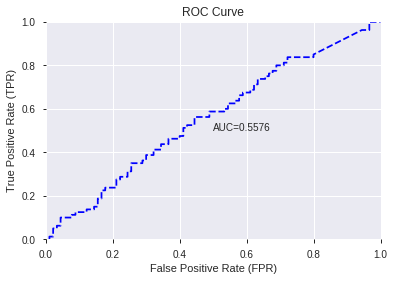

This function is available for GLM models only


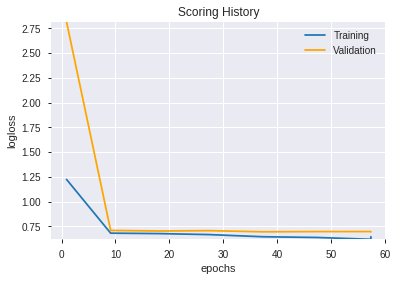

--2019-07-25 05:11:27--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.37.92
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.37.92|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


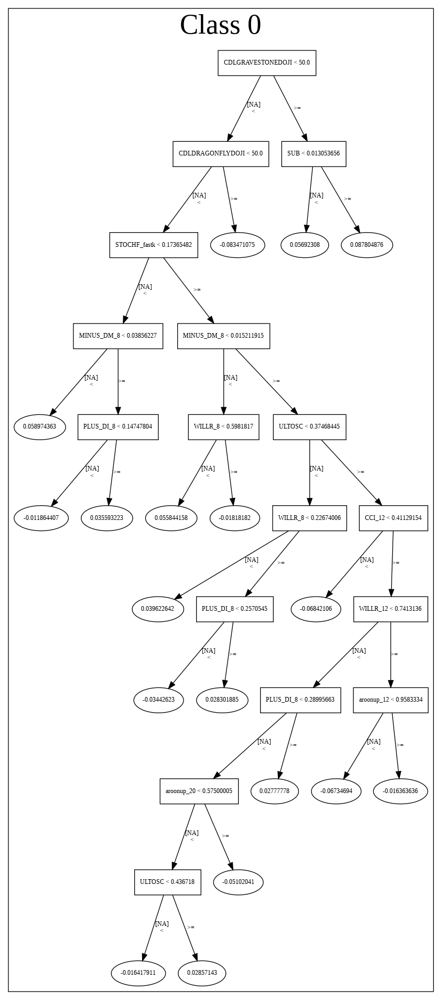

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190725_045400_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190725_045400_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_98_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['HT_TRENDMODE',
 'CORREL_12',
 'BOP',
 'HT_PHASOR_quadrature',
 'STOCHRSI_fastk',
 'CDLLONGLEGGEDDOJI',
 'STDDEV_8',
 'BETA_30',
 'ADX_24',
 'DX_30',
 'VAR_8',
 'STDDEV_12',
 'DX_8',
 'MACDEXT_hist',
 'BETA_12',
 'aroonup_14',
 'aroonup_12',
 'CDLRICKSHAWMAN',
 'CORREL_14',
 'ATR_20',
 'MFI_14',
 'CDLDOJI',
 'DX_20',
 'DX_14',
 'aroonup_8',
 'aroonup_24',
 'CORREL_8',
 'aroondown_30',
 'AROONOSC_12',
 'MFI_20',
 'NATR_30',
 'TRANGE',
 'STOCHRSI_fastd',
 'LINEARREG_ANGLE_8',
 'DX_12',
 'STOCHF_fastd',
 'aroonup_20',
 'LINEARREG_SLOPE_8',
 'aroondown_8',
 'CCI_8',
 'ADXR_12',
 'DX_24',
 'BETA_8',
 'ATR_30',
 'VAR_12',
 'AROONOSC_20',
 'AROONOSC_30',
 'CDLBELTHOLD',
 'aroonup_30',
 'ADX_20',
 'CEIL',
 'aroondown_12',
 'AD',
 'aroondown_20',
 'ADXR_14',
 'aroondown_14',
 'ROCP_30',
 'ROCP_8',
 'ROCR100_30',
 'CDLGAPSIDESIDEWHITE',
 'CORREL_24',
 'MFI_8',
 'AROONOSC_8',
 'ATR_14',
 'BETA_20',
 'MACDFIX_hist_14',
 'CDLSTALLEDPATTERN',
 'NATR_14',
 'ROCR_8',
 'AROONOSC_24',
 'MOM_8',
 'ADX_8

In [51]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190725_051138_model_1,0.517222,0.701247,0.457639,0.504002,0.254018


,variable,relative_importance,scaled_importance,percentage
0,CDLGAPSIDESIDEWHITE,8.356344e-03,1.000000,1.588972e-02
1,CDL3OUTSIDE,8.352589e-03,0.999551,1.588258e-02
2,CDLSEPARATINGLINES,7.652333e-03,0.915751,1.455103e-02
3,CDLINVERTEDHAMMER,7.319970e-03,0.875978,1.391904e-02
4,CDLSTALLEDPATTERN,7.189221e-03,0.860331,1.367042e-02
5,CORREL_12,7.021580e-03,0.840269,1.335165e-02
6,CDLBELTHOLD,6.901406e-03,0.825888,1.312313e-02
7,CDLSHOOTINGSTAR,6.866175e-03,0.821672,1.305614e-02
8,CDLXSIDEGAP3METHODS,6.745230e-03,0.807199,1.282616e-02
9,CDLHOMINGPIGEON,6.595158e-03,0.789240,1.254080e-02


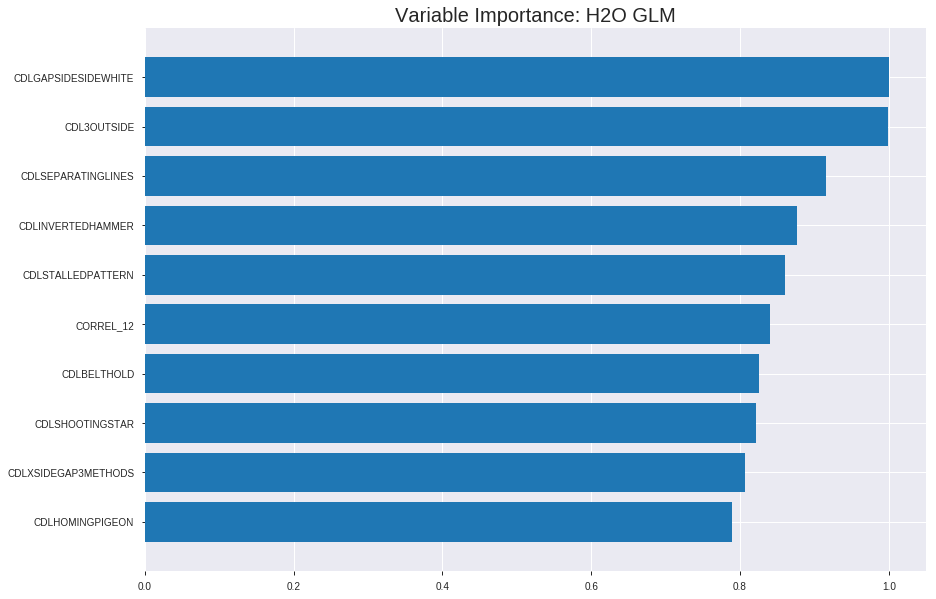

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190725_051138_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24640511854425903
RMSE: 0.4963921016134917
LogLoss: 0.6859241954929752
Null degrees of freedom: 1184
Residual degrees of freedom: 641
Null deviance: 1639.617345269403
Residual deviance: 1625.6403433183514
AIC: 2713.6403433183514
AUC: 0.5873585509216682
pr_auc: 0.5935391075903643
Gini: 0.17471710184333644
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4926926087374477: 


,0,1,Error,Rate
0,42.0,520.0,0.9253,(520.0/562.0)
1,17.0,606.0,0.0273,(17.0/623.0)
Total,59.0,1126.0,0.4532,(537.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4926926,0.6929674,363.0
max f2,0.4779858,0.8478498,396.0
max f0point5,0.5182434,0.5988287,245.0
max accuracy,0.5183588,0.5755274,244.0
max precision,0.6367863,1.0,0.0
max recall,0.4779858,1.0,396.0
max specificity,0.6367863,1.0,0.0
max absolute_mcc,0.5183588,0.1446536,244.0
max min_per_class_accuracy,0.5225631,0.5640569,221.0
max mean_per_class_accuracy,0.5190767,0.5715500,238.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 52.57 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.5979400,1.1095506,1.1095506,0.5833333,0.6061219,0.5833333,0.6061219,0.0112360,0.0112360,10.9550562,10.9550562
,2,0.0202532,0.5914937,1.5850722,1.3473114,0.8333333,0.5956739,0.7083333,0.6008979,0.0160514,0.0272873,58.5072231,34.7311396
,3,0.0303797,0.5856360,1.5850722,1.4265650,0.8333333,0.5887772,0.75,0.5968577,0.0160514,0.0433387,58.5072231,42.6565008
,4,0.0405063,0.5815654,0.9510433,1.3076846,0.5,0.5834929,0.6875,0.5935165,0.0096308,0.0529695,-4.8956661,30.7684591
,5,0.0506329,0.5734832,0.7925361,1.2046549,0.4166667,0.5769994,0.6333333,0.5902130,0.0080257,0.0609952,-20.7463884,20.4654896
,6,0.1004219,0.5555998,1.1928340,1.1987941,0.6271186,0.5638651,0.6302521,0.5771498,0.0593900,0.1203852,19.2834018,19.8794124
,7,0.1502110,0.5466977,0.9671627,1.1220174,0.5084746,0.5503028,0.5898876,0.5682510,0.0481541,0.1685393,-3.2837283,12.2017422
,8,0.2,0.5417437,1.1928340,1.1396469,0.6271186,0.5441411,0.5991561,0.5622490,0.0593900,0.2279294,19.2834018,13.9646870
,9,0.3004219,0.5343130,1.1987941,1.1594180,0.6302521,0.5376407,0.6095506,0.5540232,0.1203852,0.3483146,19.8794124,15.9418003
,10,0.4,0.5287077,1.0799984,1.1396469,0.5677966,0.5314309,0.5991561,0.5483989,0.1075441,0.4558587,7.9998368,13.9646870




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2546758960019048
RMSE: 0.5046542341067841
LogLoss: 0.7026028704892892
Null degrees of freedom: 338
Residual degrees of freedom: -205
Null deviance: 472.19286403265005
Residual deviance: 476.36474619173805
AIC: 1564.364746191738
AUC: 0.5381344116006693
pr_auc: 0.4866774061605636
Gini: 0.07626882320133865
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.519478318355536: 


,0,1,Error,Rate
0,7.0,169.0,0.9602,(169.0/176.0)
1,2.0,161.0,0.0123,(2.0/163.0)
Total,9.0,330.0,0.5044,(171.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5194783,0.6531440,329.0
max f2,0.5075897,0.8232323,337.0
max f0point5,0.5361277,0.5568627,277.0
max accuracy,0.5522100,0.5575221,176.0
max precision,0.6010321,0.5454545,10.0
max recall,0.5075897,1.0,337.0
max specificity,0.6099558,0.9943182,0.0
max absolute_mcc,0.5337743,0.1311164,286.0
max min_per_class_accuracy,0.5535695,0.5340909,169.0
max mean_per_class_accuracy,0.5477349,0.5618551,206.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 55.55 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.6069681,0.5199387,0.5199387,0.25,0.6090575,0.25,0.6090575,0.0061350,0.0061350,-48.0061350,-48.0061350
,2,0.0206490,0.6038795,1.3865031,0.8913234,0.6666667,0.6064587,0.4285714,0.6079437,0.0122699,0.0184049,38.6503067,-10.8676599
,3,0.0324484,0.6008066,1.5598160,1.1344116,0.75,0.6020349,0.5454545,0.6057950,0.0184049,0.0368098,55.9815951,13.4411601
,4,0.0412979,0.5978854,0.0,0.8913234,0.0,0.5985431,0.4285714,0.6042411,0.0,0.0368098,-100.0,-10.8676599
,5,0.0501475,0.5954070,0.6932515,0.8563695,0.3333333,0.5969948,0.4117647,0.6029623,0.0061350,0.0429448,-30.6748466,-14.3630458
,6,0.1002950,0.5862293,0.9787080,0.9175388,0.4705882,0.5907826,0.4411765,0.5968725,0.0490798,0.0920245,-2.1291952,-8.2461205
,7,0.1504425,0.5779126,0.7340310,0.8563695,0.3529412,0.5819487,0.4117647,0.5918979,0.0368098,0.1288344,-26.5968964,-14.3630458
,8,0.2005900,0.5708763,1.1010466,0.9175388,0.5294118,0.5744625,0.4411765,0.5875390,0.0552147,0.1840491,10.1046554,-8.2461205
,9,0.3008850,0.5656352,0.9787080,0.9379285,0.4705882,0.5684486,0.4509804,0.5811756,0.0981595,0.2822086,-2.1291952,-6.2071454
,10,0.4011799,0.5581123,1.4068928,1.0551696,0.6764706,0.5614172,0.5073529,0.5762360,0.1411043,0.4233129,40.6892818,5.5169614



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-07-25 05:11:39,0.000 sec,2,.29E1,544,1.3718484,1.4052057
,2019-07-25 05:11:39,0.396 sec,4,.21E1,544,1.3691398,1.4070738
,2019-07-25 05:11:40,0.783 sec,6,.15E1,544,1.3659215,1.4094042
,2019-07-25 05:11:40,1.186 sec,8,.11E1,544,1.3621102,1.4117623
,2019-07-25 05:11:40,1.572 sec,10,.81E0,544,1.3577160,1.4144975


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5529411764705883)

('F1', 0.652542372881356)

('auc', 0.5172222222222221)

('logloss', 0.701246998139944)

('mean_per_class_error', 0.45277777777777783)

('rmse', 0.5040016581336998)

('mse', 0.25401767140151876)

glm prediction progress: |████████████████████████████████████████████████| 100%


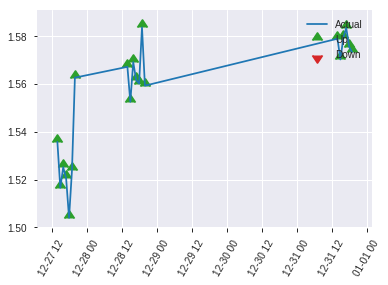


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.25401767140151876
RMSE: 0.5040016581336998
LogLoss: 0.701246998139944
Null degrees of freedom: 169
Residual degrees of freedom: -374
Null deviance: 237.15156222668182
Residual deviance: 238.42397936758096
AIC: 1326.423979367581
AUC: 0.5172222222222221
pr_auc: 0.4597997613503471
Gini: 0.03444444444444428
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5204489941812754: 


,0,1,Error,Rate
0,11.0,79.0,0.8778,(79.0/90.0)
1,3.0,77.0,0.0375,(3.0/80.0)
Total,14.0,156.0,0.4824,(82.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5204490,0.6525424,155.0
max f2,0.5094132,0.8213552,166.0
max f0point5,0.5209846,0.5491329,152.0
max accuracy,0.5494757,0.5529412,55.0
max precision,0.6077831,1.0,0.0
max recall,0.5094132,1.0,166.0
max specificity,0.6077831,1.0,0.0
max absolute_mcc,0.5209846,0.1571348,152.0
max min_per_class_accuracy,0.5387942,0.5222222,84.0
max mean_per_class_accuracy,0.5209846,0.5472222,152.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 54.26 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.5961882,1.0625,1.0625,0.5,0.6041308,0.5,0.6041308,0.0125,0.0125,6.25,6.25
,2,0.0235294,0.5799532,0.0,0.53125,0.0,0.5876248,0.25,0.5958778,0.0,0.0125,-100.0,-46.875
,3,0.0352941,0.5776670,1.0625,0.7083333,0.5,0.5779671,0.3333333,0.5899076,0.0125,0.025,6.25,-29.1666667
,4,0.0411765,0.5774195,2.125,0.9107143,1.0,0.5776170,0.4285714,0.5881518,0.0125,0.0375,112.5,-8.9285714
,5,0.0529412,0.5760675,1.0625,0.9444444,0.5,0.5769817,0.4444444,0.5856695,0.0125,0.05,6.25,-5.5555556
,6,0.1,0.5709024,0.53125,0.7500000,0.25,0.5741998,0.3529412,0.5802720,0.025,0.075,-46.875,-25.0000000
,7,0.1529412,0.5647214,0.9444444,0.8173077,0.4444444,0.5684827,0.3846154,0.5761911,0.05,0.125,-5.5555556,-18.2692308
,8,0.2,0.5596898,1.328125,0.9375,0.625,0.5616551,0.4411765,0.5727709,0.0625,0.1875,32.8125,-6.25
,9,0.3,0.5517800,1.25,1.0416667,0.5882353,0.5561593,0.4901961,0.5672337,0.125,0.3125,25.0,4.1666667
,10,0.4,0.5442435,1.0,1.03125,0.4705882,0.5475249,0.4852941,0.5623065,0.1,0.4125,0.0,3.125


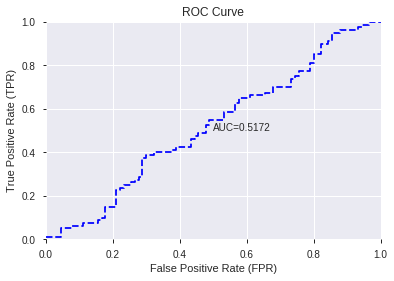

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


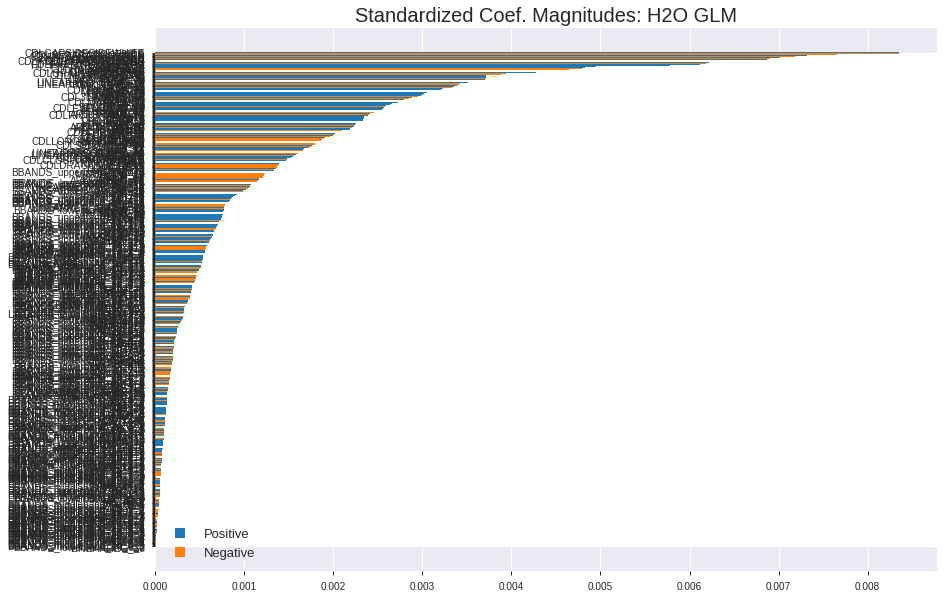

'log_likelihood'
--2019-07-25 05:11:54--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.100.227
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.100.227|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


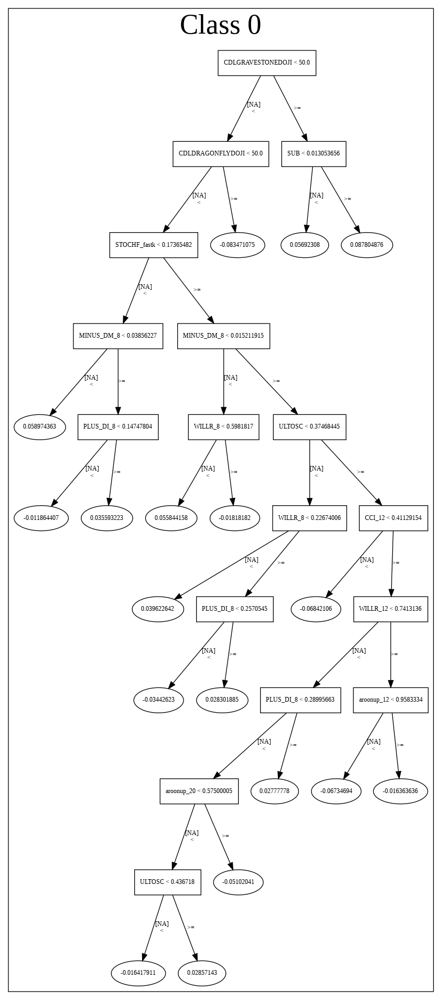

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190725_051138_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190725_051138_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_106_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_106

['CDLGAPSIDESIDEWHITE',
 'CDL3OUTSIDE',
 'CDLSEPARATINGLINES',
 'CDLINVERTEDHAMMER',
 'CDLSTALLEDPATTERN',
 'CORREL_12',
 'CDLBELTHOLD',
 'CDLSHOOTINGSTAR',
 'CDLXSIDEGAP3METHODS',
 'CDLHOMINGPIGEON',
 'CDLHIKKAKE',
 'BETA_12',
 'CDLEVENINGDOJISTAR',
 'HT_PHASOR_quadrature',
 'BETA_14',
 'STDDEV_12',
 'aroonup_8',
 'CDLHARAMICROSS',
 'CDLHIGHWAVE',
 'CDLHARAMI',
 'DX_30',
 'CDLTASUKIGAP',
 'CDLGRAVESTONEDOJI',
 'MINUS_DI_8',
 'CDLMORNINGSTAR',
 'ROCR100_30',
 'ROCR_30',
 'ROCP_30',
 'CDLSHORTLINE',
 'ROC_30',
 'AROONOSC_8',
 'LINEARREG_SLOPE_8',
 'VAR_12',
 'LINEARREG_ANGLE_8',
 'MACDEXT_hist',
 'MINUS_DI_12',
 'ATR_30',
 'NATR_30',
 'DX_24',
 'NATR_24',
 'CDLENGULFING',
 'aroonup_20',
 'MINUS_DI_14',
 'PLUS_DM_8',
 'NATR_20',
 'CORREL_14',
 'ATR_20',
 'STDDEV_14',
 'CDL3LINESTRIKE',
 'STDDEV_8',
 'BETA_30',
 'AD',
 'PLUS_DI_8',
 'CDLMARUBOZU',
 'BETA_24',
 'VAR_30',
 'NATR_14',
 'BETA_20',
 'STOCH_slowd',
 'MINUS_DI_20',
 'CDLEVENINGSTAR',
 'ATR_14',
 'PLUS_DM_12',
 'aroonup_24',
 'NA

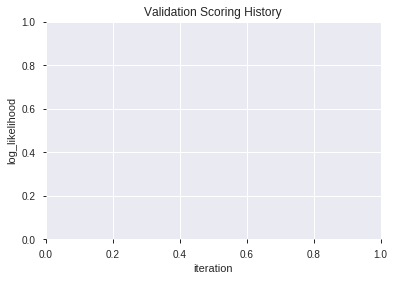

In [52]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190725_051203_model_1,0.530139,0.726334,0.494444,0.515133,0.265362
1,XGBoost_grid_1_AutoML_20190725_051203_model_2,0.509583,0.726535,0.479861,0.515823,0.266074
2,XGBoost_grid_1_AutoML_20190725_051203_model_4,0.500417,0.717779,0.500000,0.511957,0.262100
3,XGBoost_grid_1_AutoML_20190725_051203_model_3,0.493194,0.731586,0.489583,0.517871,0.268190
4,XGBoost_2_AutoML_20190725_051203,0.485000,0.733218,0.494444,0.518680,0.269029
5,XGBoost_grid_1_AutoML_20190725_051203_model_5,0.470694,0.780533,0.483333,0.536238,0.287551
6,XGBoost_grid_1_AutoML_20190725_051203_model_7,0.463194,0.772548,0.488889,0.535304,0.286550
7,XGBoost_3_AutoML_20190725_051203,0.453611,0.758484,0.500000,0.529649,0.280528
8,XGBoost_1_AutoML_20190725_051203,0.450000,0.757661,0.500000,0.529497,0.280367
9,XGBoost_grid_1_AutoML_20190725_051203_model_6,0.440972,0.736185,0.500000,0.520537,0.270959


,variable,relative_importance,scaled_importance,percentage
0,CORREL_20,123.898285,1.000000,0.030917
1,BETA_30,114.739662,0.926080,0.028632
2,BETA_24,112.951050,0.911643,0.028185
3,BETA_8,82.324677,0.664454,0.020543
4,ADX_8,82.312180,0.664353,0.020540
5,STOCHF_fastk,80.064354,0.646210,0.019979
6,CORREL_14,71.307083,0.575529,0.017794
7,CCI_8,69.551590,0.561360,0.017356
8,BETA_12,60.337387,0.486991,0.015056
9,CDLBELTHOLD,58.519650,0.472320,0.014603


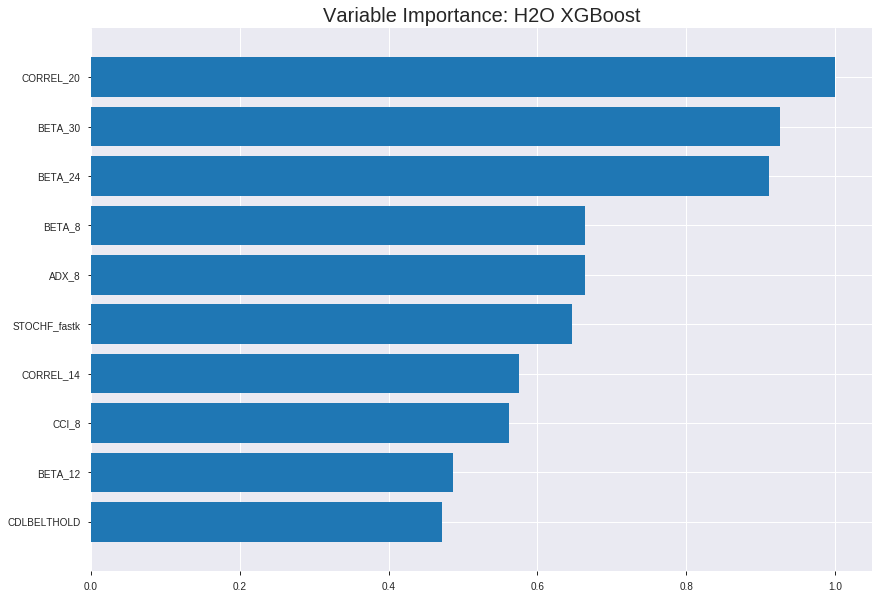

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190725_051203_model_1


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.16974832127573314
RMSE: 0.4120052442332902
LogLoss: 0.5272262468294368
Mean Per-Class Error: 0.11901715382462319
AUC: 0.9581364994316331
pr_auc: 0.9611149167769163
Gini: 0.9162729988632663
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.493818499147892: 


,0,1,Error,Rate
0,466.0,96.0,0.1708,(96.0/562.0)
1,46.0,577.0,0.0738,(46.0/623.0)
Total,512.0,673.0,0.1198,(142.0/1185.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4938185,0.8904321,230.0
max f2,0.4595464,0.9312977,262.0
max f0point5,0.5419015,0.9119497,184.0
max accuracy,0.5163997,0.8801688,207.0
max precision,0.8396370,1.0,0.0
max recall,0.3977119,1.0,318.0
max specificity,0.8396370,1.0,0.0
max absolute_mcc,0.4938185,0.7614040,230.0
max min_per_class_accuracy,0.5111048,0.8754448,213.0
max mean_per_class_accuracy,0.5163997,0.8809828,207.0


Gains/Lift Table: Avg response rate: 52.57 %, avg score: 52.36 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101266,0.7726757,1.9020867,1.9020867,1.0,0.7955659,1.0,0.7955659,0.0192616,0.0192616,90.2086677,90.2086677
,2,0.0202532,0.7404702,1.9020867,1.9020867,1.0,0.7532541,1.0,0.7744100,0.0192616,0.0385233,90.2086677,90.2086677
,3,0.0303797,0.7326960,1.9020867,1.9020867,1.0,0.7358380,1.0,0.7615527,0.0192616,0.0577849,90.2086677,90.2086677
,4,0.0405063,0.7273042,1.9020867,1.9020867,1.0,0.7299072,1.0,0.7536413,0.0192616,0.0770465,90.2086677,90.2086677
,5,0.0506329,0.7158532,1.9020867,1.9020867,1.0,0.7212499,1.0,0.7471630,0.0192616,0.0963082,90.2086677,90.2086677
,6,0.1004219,0.6827704,1.9020867,1.9020867,1.0,0.6974898,1.0,0.7225351,0.0947030,0.1910112,90.2086677,90.2086677
,7,0.1502110,0.6592540,1.9020867,1.9020867,1.0,0.6707333,1.0,0.7053649,0.0947030,0.2857143,90.2086677,90.2086677
,8,0.2,0.6413958,1.8376092,1.8860353,0.9661017,0.6502417,0.9915612,0.6916422,0.0914928,0.3772071,83.7609163,88.6035313
,9,0.3004219,0.6071191,1.8541349,1.8753720,0.9747899,0.6239797,0.9859551,0.6690247,0.1861958,0.5634029,85.4134912,87.5371977
,10,0.4,0.5667509,1.6925348,1.8298555,0.8898305,0.5875053,0.9620253,0.6487308,0.1685393,0.7319422,69.2534755,82.9855538




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.2619573542802149
RMSE: 0.5118176963335821
LogLoss: 0.7179535923917584
Mean Per-Class Error: 0.44912506971556054
AUC: 0.5325223089793641
pr_auc: 0.5464305555472915
Gini: 0.06504461795872829
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36610737442970276: 


,0,1,Error,Rate
0,0.0,176.0,1.0,(176.0/176.0)
1,0.0,163.0,0.0,(0.0/163.0)
Total,0.0,339.0,0.5192,(176.0/339.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3661074,0.6494024,338.0
max f2,0.3661074,0.8224016,338.0
max f0point5,0.3661074,0.5365372,338.0
max accuracy,0.6654816,0.5604720,55.0
max precision,0.8217321,1.0,0.0
max recall,0.3661074,1.0,338.0
max specificity,0.8217321,1.0,0.0
max absolute_mcc,0.7370740,0.1599546,19.0
max min_per_class_accuracy,0.5801280,0.5227273,169.0
max mean_per_class_accuracy,0.6362580,0.5508749,83.0


Gains/Lift Table: Avg response rate: 48.08 %, avg score: 58.37 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117994,0.8131948,2.0797546,2.0797546,1.0,0.8178381,1.0,0.8178381,0.0245399,0.0245399,107.9754601,107.9754601
,2,0.0206490,0.8049148,0.6932515,1.4855390,0.3333333,0.8085161,0.7142857,0.8138430,0.0061350,0.0306748,-30.6748466,48.5539001
,3,0.0324484,0.7873386,2.0797546,1.7016174,1.0,0.7965506,0.8181818,0.8075549,0.0245399,0.0552147,107.9754601,70.1617401
,4,0.0412979,0.7639340,0.6932515,1.4855390,0.3333333,0.7734685,0.7142857,0.8002506,0.0061350,0.0613497,-30.6748466,48.5539001
,5,0.0501475,0.7464074,2.0797546,1.5904006,1.0,0.7570231,0.7647059,0.7926223,0.0184049,0.0797546,107.9754601,59.0400577
,6,0.1002950,0.7003690,1.1010466,1.3457236,0.5294118,0.7221032,0.6470588,0.7573627,0.0552147,0.1349693,10.1046554,34.5723565
,7,0.1504425,0.6718636,0.9787080,1.2233851,0.4705882,0.6876743,0.5882353,0.7341332,0.0490798,0.1840491,-2.1291952,22.3385060
,8,0.2005900,0.6555304,1.1010466,1.1928004,0.5294118,0.6636996,0.5735294,0.7165248,0.0552147,0.2392638,10.1046554,19.2800433
,9,0.3008850,0.6206604,1.1010466,1.1622158,0.5294118,0.6359243,0.5588235,0.6896580,0.1104294,0.3496933,10.1046554,16.2215807
,10,0.4011799,0.6000087,0.9175388,1.1010466,0.4411765,0.6096496,0.5294118,0.6696559,0.0920245,0.4417178,-8.2461205,10.1046554



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 05:12:10,0.019 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4742616,0.5,0.6931472,0.5,0.0,1.0,0.5191740
,2019-07-25 05:12:11,0.297 sec,5.0,0.4853237,0.6641500,0.8332100,0.8554452,1.9020867,0.2708861,0.4990182,0.6911757,0.5482257,0.5412352,1.6638037,0.5132743
,2019-07-25 05:12:11,0.392 sec,10.0,0.4739524,0.6420829,0.8696584,0.8871189,1.9020867,0.2126582,0.5001919,0.6935019,0.5320343,0.5373320,2.0797546,0.5162242
,2019-07-25 05:12:11,0.485 sec,15.0,0.4635607,0.6222000,0.8901196,0.9056587,1.9020867,0.1991561,0.5002328,0.6935038,0.5509098,0.5542612,2.0797546,0.5162242
,2019-07-25 05:12:11,0.592 sec,20.0,0.4545656,0.6051975,0.9075090,0.9198258,1.9020867,0.1839662,0.5024554,0.6979550,0.5390930,0.5481195,1.5598160,0.5162242
,2019-07-25 05:12:11,0.697 sec,25.0,0.4471507,0.5912683,0.9171898,0.9265006,1.9020867,0.1763713,0.5034113,0.6998707,0.5389187,0.5536327,1.5598160,0.5191740
,2019-07-25 05:12:11,0.791 sec,30.0,0.4386002,0.5754259,0.9296796,0.9376084,1.9020867,0.1535865,0.5048472,0.7027668,0.5268579,0.5487127,1.5598160,0.5191740
,2019-07-25 05:12:11,0.881 sec,35.0,0.4319988,0.5632454,0.9376139,0.9442477,1.9020867,0.1392405,0.5064786,0.7061508,0.5261608,0.5508027,1.5598160,0.5132743
,2019-07-25 05:12:11,0.974 sec,40.0,0.4244530,0.5494309,0.9449155,0.9503671,1.9020867,0.1324895,0.5097400,0.7131850,0.5232153,0.5406564,1.5598160,0.5191740
,2019-07-25 05:12:11,1.064 sec,45.0,0.4185633,0.5388486,0.9513761,0.9557795,1.9020867,0.1291139,0.5111143,0.7162822,0.5293851,0.5466878,2.0797546,0.5191740


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CORREL_20,123.8982849,1.0,0.0309170
BETA_30,114.7396622,0.9260795,0.0286316
BETA_24,112.9510498,0.9116434,0.0281853
BETA_8,82.3246765,0.6644537,0.0205429
ADX_8,82.3121796,0.6643529,0.0205398
---,---,---,---
BBANDS_lowerband_20_5_2,3.1864824,0.0257185,0.0007951
MINUS_DM_20,2.6548462,0.0214276,0.0006625
MINUS_DI_30,2.3485274,0.0189553,0.0005860
MINUS_DM_8,1.9590940,0.0158121,0.0004889



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5470588235294118)

('F1', 0.642570281124498)

('auc', 0.5301388888888888)

('logloss', 0.7263341574288665)

('mean_per_class_error', 0.44652777777777786)

('rmse', 0.5151329645307754)

('mse', 0.26536197114626514)

xgboost prediction progress: |████████████████████████████████████████████| 100%


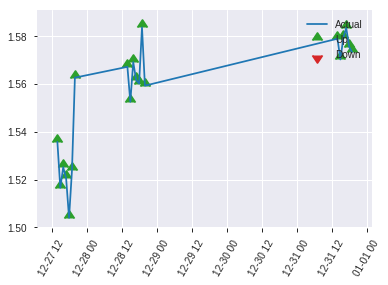


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.26536197114626514
RMSE: 0.5151329645307754
LogLoss: 0.7263341574288665
Mean Per-Class Error: 0.44652777777777786
AUC: 0.5301388888888888
pr_auc: 0.4917307492211687
Gini: 0.06027777777777765
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40136241912841797: 


,0,1,Error,Rate
0,1.0,89.0,0.9889,(89.0/90.0)
1,0.0,80.0,0.0,(0.0/80.0)
Total,1.0,169.0,0.5235,(89.0/170.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4013624,0.6425703,168.0
max f2,0.4013624,0.8179959,168.0
max f0point5,0.5616610,0.5386179,102.0
max accuracy,0.5860837,0.5470588,84.0
max precision,0.7351532,0.6666667,2.0
max recall,0.4013624,1.0,168.0
max specificity,0.8340549,0.9888889,0.0
max absolute_mcc,0.5616610,0.1092367,102.0
max min_per_class_accuracy,0.5860837,0.5444444,84.0
max mean_per_class_accuracy,0.5616610,0.5534722,102.0


Gains/Lift Table: Avg response rate: 47.06 %, avg score: 58.36 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117647,0.7500313,1.0625,1.0625,0.5,0.8086010,0.5,0.8086010,0.0125,0.0125,6.25,6.25
,2,0.0235294,0.7312328,1.0625,1.0625,0.5,0.7338774,0.5,0.7712392,0.0125,0.025,6.25,6.25
,3,0.0352941,0.7232179,2.125,1.4166667,1.0,0.7261395,0.6666667,0.7562060,0.025,0.05,112.5,41.6666667
,4,0.0411765,0.7194369,0.0,1.2142857,0.0,0.7223997,0.5714286,0.7513765,0.0,0.05,-100.0,21.4285714
,5,0.0529412,0.7122358,1.0625,1.1805556,0.5,0.7164025,0.5555556,0.7436045,0.0125,0.0625,6.25,18.0555556
,6,0.1,0.6847411,1.0625,1.125,0.5,0.6996109,0.5294118,0.7229016,0.05,0.1125,6.25,12.5
,7,0.1529412,0.6667925,0.7083333,0.9807692,0.3333333,0.6761082,0.4615385,0.7067039,0.0375,0.15,-29.1666667,-1.9230769
,8,0.2,0.6532964,1.0625,1.0,0.5,0.6581297,0.4705882,0.6952747,0.05,0.2,6.25,0.0
,9,0.3,0.6272347,1.125,1.0416667,0.5294118,0.6383916,0.4901961,0.6763137,0.1125,0.3125,12.5,4.1666667
,10,0.4,0.6018546,1.0,1.03125,0.4705882,0.6159770,0.4852941,0.6612295,0.1,0.4125,0.0,3.125


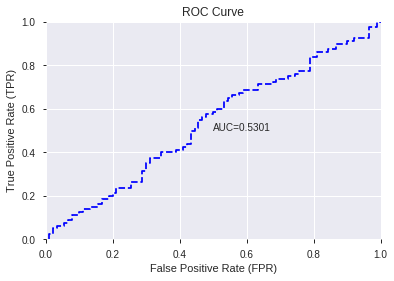

This function is available for GLM models only


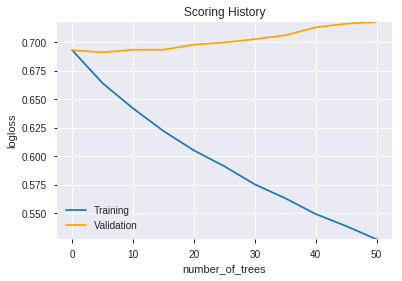

--2019-07-25 05:12:28--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.161.75
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.161.75|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at hex.genmodel.algos.tree.SharedTreeNode.findInclusiveNa(SharedTreeNode.java:129)
	at hex.genmodel.algos.tree.SharedTreeNode.findInclusiveNa(SharedTreeNode.java:129)
	at hex.genmodel.algos.tree.SharedTreeNode.findInclusiveNa(SharedTreeNode.java:129)
	at hex.genmodel.algos.tree.SharedTreeNode.calculateChildInclusiveNa(SharedTreeNode.java:133)
	at hex.genmodel.algos.tree.SharedTreeNode.setRightChild(SharedTreeNode.java:220)
	at hex.genmodel.algos.tree.SharedTreeSubgraph.makeRightEdge(Share

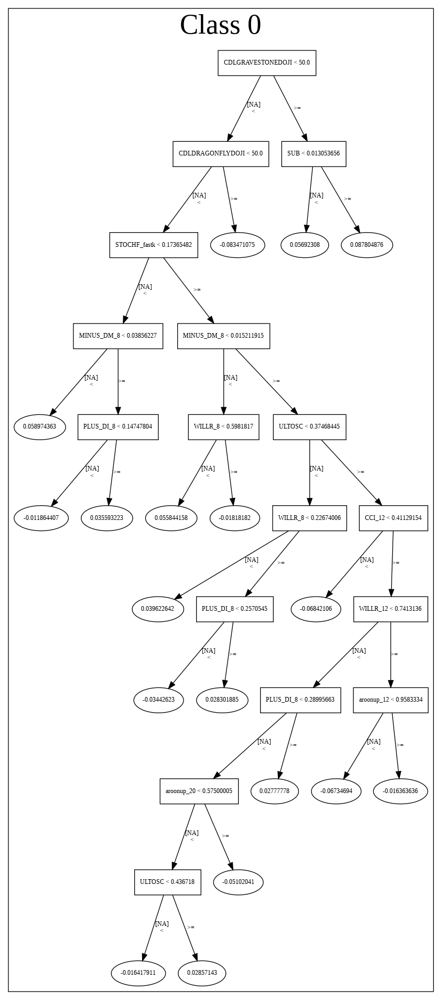

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190725_051203_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190725_051203_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_114_sid_8832',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_trainin

['CORREL_20',
 'BETA_30',
 'BETA_24',
 'BETA_8',
 'ADX_8',
 'STOCHF_fastk',
 'CORREL_14',
 'CCI_8',
 'BETA_12',
 'CDLBELTHOLD',
 'ULTOSC',
 'HT_PHASOR_quadrature',
 'BBANDS_lowerband_30_0_4',
 'CORREL_12',
 'STDDEV_12',
 'DX_20',
 'MACDEXT_hist',
 'AD',
 'MFI_14',
 'TRANGE',
 'CORREL_8',
 'BOP',
 'ADX_20',
 'HT_DCPERIOD',
 'BBANDS_upperband_24_0_5',
 'TRIX_8',
 'MOM_12',
 'STDDEV_20',
 'ATR_30',
 'BBANDS_upperband_30_0_5',
 'DX_24',
 'ADOSC',
 'MFI_8',
 'ADXR_14',
 'MINUS_DM_14',
 'DX_12',
 'STOCHRSI_fastd',
 'NATR_12',
 'BBANDS_upperband_20_1_5',
 'LINEARREG_ANGLE_20',
 'CCI_20',
 'MFI_12',
 'CDL3OUTSIDE',
 'CMO_30',
 'MOM_8',
 'BBANDS_upperband_20_0_5',
 'LINEARREG_ANGLE_24',
 'MOM_30',
 'PLUS_DM_8',
 'CORREL_30',
 'OBV',
 'BBANDS_upperband_24_1_4',
 'MINUS_DI_14',
 'HT_PHASOR_inphase',
 'MACDEXT_signal',
 'STDDEV_24',
 'MACDFIX_hist_24',
 'MINUS_DM_24',
 'PLUS_DI_12',
 'AROONOSC_14',
 'WILLR_8',
 'NATR_30',
 'MFI_30',
 'BBANDS_upperband_14_4_5',
 'BBANDS_upperband_24_2_5',
 'CDLHIKK

In [53]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [54]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


DeepLearning    0.571
GLM             0.571
XGBoost         0.582
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.541,0.553,0.553
DLF,0.547,0.571,0.582
Fwe,0.571,0.553,0.553
RFE,0.559,0.553,0.547
XGBF,0.571,0.571,0.582






F1


DeepLearning    0.650
GLM             0.655
XGBoost         0.648
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.650,0.655,0.648
DLF,0.645,0.648,0.645
Fwe,0.645,0.655,0.648
RFE,0.648,0.653,0.643
XGBF,0.642,0.648,0.645






auc


DeepLearning    0.558
GLM             0.532
XGBoost         0.536
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.521,0.523,0.536
DLF,0.511,0.532,0.525
Fwe,0.541,0.523,0.536
RFE,0.558,0.517,0.530
XGBF,0.549,0.532,0.525






logloss


DeepLearning    1.381
GLM             0.706
XGBoost         0.738
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.697,0.706,0.738
DLF,1.381,0.698,0.713
Fwe,1.065,0.706,0.738
RFE,0.696,0.701,0.726
XGBF,1.121,0.698,0.713






mean_per_class_error


DeepLearning    0.474
GLM             0.453
XGBoost         0.456
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.473,0.452,0.456
DLF,0.474,0.426,0.426
Fwe,0.431,0.452,0.456
RFE,0.441,0.453,0.447
XGBF,0.422,0.426,0.426






rmse


DeepLearning    0.627
GLM             0.506
XGBoost         0.520
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.502,0.506,0.520
DLF,0.627,0.503,0.509
Fwe,0.591,0.506,0.520
RFE,0.501,0.504,0.515
XGBF,0.593,0.503,0.509






mse


DeepLearning    0.393
GLM             0.256
XGBoost         0.271
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.252,0.256,0.271
DLF,0.393,0.253,0.260
Fwe,0.349,0.256,0.271
RFE,0.251,0.254,0.265
XGBF,0.351,0.253,0.260


{'F1':       DeepLearning    GLM  XGBoost
 All          0.650    NaN      NaN
 DLF          0.645    NaN      NaN
 DLF            NaN  0.648      NaN
 DLF            NaN    NaN    0.645
 All            NaN  0.655      NaN
 All            NaN    NaN    0.648
 XGBF         0.642    NaN      NaN
 XGBF           NaN  0.648      NaN
 XGBF           NaN    NaN    0.645
 Fwe          0.645    NaN      NaN
 Fwe            NaN  0.655      NaN
 Fwe            NaN    NaN    0.648
 RFE          0.648    NaN      NaN
 RFE            NaN  0.653      NaN
 RFE            NaN    NaN    0.643,
 'accuracy':       DeepLearning    GLM  XGBoost
 All          0.541    NaN      NaN
 DLF          0.547    NaN      NaN
 DLF            NaN  0.571      NaN
 DLF            NaN    NaN    0.582
 All            NaN  0.553      NaN
 All            NaN    NaN    0.553
 XGBF         0.571    NaN      NaN
 XGBF           NaN  0.571      NaN
 XGBF           NaN    NaN    0.582
 Fwe          0.571    NaN      NaN
 Fwe     